# Background

Inspired by my analysis of Miami Lakes Rboom data to measure the pressure pulse from the Tonga eruption an beamform back to the source, I began drinking in global barometric and infrasound data from IRIS (and Shake.net). Steve then took my measurements and began collating a table of reduced pressure versus other eruptions. This then mainfested an invite from Zhigang Peng to collaborate on a Tonga paper to look at all waves emanating from this eruption.

While I am focusing on that paper currently, this notebook has lots of earlier work, and will later be expanded for my own conference and journal papers (and one I am co-authoring with Steve).

Glenn Thompson, Jan - Feb 2022

# 1. Startup

## 1.1 Functions and imports

In [88]:
import os, sys, obspy, pickle, datetime
import pandas as pd
import matplotlib.pyplot as plt
LIBpath = os.path.join( os.getenv('HOME'),'src','kitchensinkGT', 'LIB')
sys.path.append(LIBpath)
import libTonga

## 1.2 Reload modules as needed

In [91]:
import importlib
importlib.reload(libTonga)

<module 'libTonga' from '/Users/thompsong/src/kitchensinkGT/LIB/libTonga.py'>

# 2. New functions

In [59]:
from obspy.clients.fdsn import Client
import numpy as np
def get_raw_data(fdsnURL, chanstring, startt, endt, lat=libTonga.sourcelat, lon=libTonga.sourcelon, fmin=0.001, network='*', station='*', \
                location='*', searchRadiusDeg=180.0):
    # raw stream and inventory - note that stationXML and Miniseed files are written if they do not exist already
    this_stream, this_inventory = libTonga.get_inventory_and_waveforms(fdsnURL, searchRadiusDeg, lat, \
                lon, startt, endt, chanstring, libTonga.DATA_ROOT, network=network, station=station, \
                location=location, overwrite=False)
    return this_stream, this_inventory

def reconstitute_raw_data(this_stream, this_inventory, reconfile): #chanstring, prepend):    
    # reconstituted Stream
    #T = np.round(1/fmin,0)
    #reconfile = os.path.join(libTonga.DATA_ROOT, 'MINISEED', '%s%s_reconstituted_%.0f.mseed' % (prepend, chanstring, T))
    this_reconstituted = obspy.Stream()
    if os.path.exists(reconfile):
        choice = input('%s exists. Load this (y/n)? Otherwise data will be reconstituted and saved over this' % reconfile)
        if choice[0].lower() == 'y':
            this_reconstituted = obspy.read(reconfile)
    if len(this_reconstituted)==0:
        this_reconstituted = libTonga.reconstitute_stream(this_stream, this_inventory, fmin=fmin)
        this_reconstituted.write(reconfile, format='PICKLE')
    return this_reconstituted
        
def filter_out_bad_traces(this_reconstituted, this_inventory, goodpklfile):
    good_ids_pickle = os.path.join(libTonga.DATA_ROOT, 'PICKLE', '%sgood_%s_ids_within_%.0f_degrees.pkl' % (prepend, chanstring, searchRadiusDeg))
    if os.path.exists(good_ids_pickle):
        with open(good_ids_pickle, 'rb') as f:
            good_ids = pickle.load(f)
        this_good = select_previously_manually_selected_traces(this_reconstituted, good_ids)
    else:
        this_good = obspy.Stream()
        if os.path.exists(goodpklfile):
            choice = input('%s exists. Load this (y/n)? Otherwise you have to manually pick traces and overwrite existing file' % goodmseedfile)
            if choice[0].lower() == 'y':
                this_good = obspy.read(goodpklfile)
        if len(this_good)==0:
            this_good = manually_select_good_traces(this_reconstituted)
            good_ids = []
            for tr in this_good:
                good_ids.append(tr.id)
            with open(good_ids_pickle, 'wb') as f:
                pickle.dump(good_ids, f)
            this_good.write(goodpklfile, format='PICKLE')
    print('Good traces saved as %s ' % goodpklfile)

    good_inv = subset_inv(this_inventory, this_stream, this_good)
    #plot_inv(good_inv)

    return this_good, good_inv

def enhance_stream(st, inv, lat=libTonga.sourcelat, lon=libTonga.sourcelon):
    st = libTonga.smart_merge(st)
    libTonga.attach_station_coordinates_from_inventory(inv, st)
    libTonga.attach_distance_to_stream(st, lat, lon)
    return st
    
def load_data_by_chanstring(chanstring, searchRadiusDeg, fmin, startt, endt, fdsnURL, \
                            select_good_channels=False):
    prepend = libTonga.get_fdsn_identifier(fdsnURL)
    # Files names like st_$CHANSTRING_$SEARCHRADIUSDEG_$FMIN.pkl (or _raw.pkl for data not reconstituted)
    rawmseedfile = os.path.join(libTonga.DATA_ROOT, 'MINISEED', '%s%s_within_%.0f_degrees.mseed' % (prepend, chanstring, searchRadiusDeg))
    rawxmlfile = os.path.join(libTonga.DATA_ROOT, 'STATIONXML', '%s%s_within_%.0f_degrees.xml' % (prepend, chanstring, searchRadiusDeg))
    reconpklfile = os.path.join(libTonga.DATA_ROOT, 'PICKLE', '%s%s_within_%.0f_degrees_%f.pkl' % (prepend, chanstring, searchRadiusDeg, fmin))
    goodpklfile = os.path.join(libTonga.DATA_ROOT, 'PICKLE', '%s%s_within_%.0f_degrees_%f_good.pkl' % (prepend, chanstring, searchRadiusDeg, fmin))
    goodxmlfile = os.path.join(libTonga.DATA_ROOT, 'STATIONXML', '%s%s_within_%.0f_degrees_%f_good.mseed' % (prepend, chanstring, searchRadiusDeg, fmin))

    # get correct Inventory
    if os.path.isfile(rawxmlfile):
        raw_inv = obspy.read_inventory(rawxmlfile)
        inv = raw_inv
    if select_good_channels:
        pklfile = goodpklfile
        if os.path.isfile(goodxmlfile):
            inv = obspy.read_inventory(goodxmlfile)        
    else:
        pklfile = reconpklfile

    # get correct Stream    
    if os.path.isfile(pklfile): 
        print('Loading %s\n(which we think is already reconstituted)' % pklfile)
        with open(pklfile, 'rb') as f:
            st = pickle.load(f)
        print('Enhancing')   
        enhanced_st = enhance_stream(st, raw_inv)    
        return enhanced_st, inv
    
    elif os.path.isfile(rawmseedfile): 
        print('Reading %s' % rawmseedfile)
        raw_st = obspy.read(rawmseedfile)
        print('Enhancing')
        enhanced_raw_st = enhance_stream(raw_st, raw_inv)
        print('Reconstituting')
        recon_st = reconstitute_raw_data(enhanced_raw_st, inv, reconpklfile)  
    else:
        raw_st, raw_inv = get_raw_data(fdsnURL, 
            chanstring, startt, endt, fmin=fmin, searchRadiusDeg=searchRadiusDeg)
        print('Enhancing')
        enhanced_raw_st = enhance_stream(raw_st, raw_inv)
        print('Reconstituting')
        recon_st = reconstitute_raw_data(raw_st, raw_inv, reconpklfile) 
        
    if select_good_channels:
        print('Filtering out bad traces')
        good_st, good_inv = filter_out_bad_traces(recon_st, raw_inv)
        return good_st, good_inv 
    else:
        return recon_st, raw_inv

# 3. Load 1 Hz data

## 3.1 Barometric and infrasound data

In [66]:
chanstring = 'LDO'
fmin_infrasound = 0.0001
searchRadiusDeg_1Hz = 180
fdsnURL = "http://service.iris.edu"
startt_1Hz =  obspy.core.UTCDateTime('2022-01-13T00:00:00.000000Z') - (1.0/fmin_infrasound)*2
endt_1Hz = obspy.core.UTCDateTime('2022-01-20T00:00:00.000000Z') - (1.0/fmin_infrasound)*2

In [60]:
st_ldo, inv_ldo = load_data_by_chanstring('LDO', searchRadiusDeg_1Hz, fmin_infrasound, startt_1Hz, \
                        endt_1Hz, fdsnURL, select_good_channels=False)

Loading /Users/thompsong/DATA/HungaTonga/PICKLE/iris_LDO_within_180_degrees_0.000100.pkl
(which we think is already reconstituted)
Enhancing


In [68]:
st_ldf, inv_ldf = load_data_by_chanstring('LDF', searchRadiusDeg_1Hz, fmin_infrasound, startt_1Hz, \
                        endt_1Hz, fdsnURL, select_good_channels=False)

Loading /Users/thompsong/DATA/HungaTonga/PICKLE/iris_LDF_within_180_degrees_0.000100.pkl
(which we think is already reconstituted)
Enhancing


In [80]:
# Raspberry Boom data - previously corrected
import glob
filepattern = os.path.join(libTonga.DATA_ROOT, 'MINISEED', 'corrected.AM.*.HDF.mseed')
rboompklfile = os.path.join(libTonga.DATA_ROOT, 'PICKLE', 'corrected.AM.HDF.pkl')
st_rboom = obspy.Stream()
for thisfile in glob.glob(filepattern):
    print(thisfile)
    st = obspy.read(thisfile)
    st.merge()
    for tr in st:
        print(tr)
        st_rboom.append(tr)
st_rboom.write(rboompklfile, 'PICKLE')

/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R3F75.HDF.mseed
AM.R3F75.00.HDF | 2022-01-15T15:34:44.196000Z - 2022-01-15T21:18:39.716000Z | 3.1 Hz, 64487 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R4B63.HDF.mseed
AM.R4B63.00.HDF | 2022-01-15T10:43:49.058999Z - 2022-01-15T15:10:09.858999Z | 3.1 Hz, 49941 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R44DC.HDF.mseed
AM.R44DC.00.HDF | 2022-01-15T16:00:58.059000Z - 2022-01-15T21:51:53.419000Z | 3.1 Hz, 65799 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.RC59E.HDF.mseed
AM.RC59E.00.HDF | 2022-01-15T16:00:12.265000Z - 2022-01-15T21:50:55.465000Z | 3.1 Hz, 65761 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R13D2.HDF.mseed
AM.R13D2.00.HDF | 2022-01-15T12:39:09.156999Z - 2022-01-15T17:36:15.396999Z | 3.1 Hz, 55708 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R94AB.HDF.mseed
AM.R94AB.00.HDF | 2022-01-15T10:45:56.389999Z - 2022-01-15T15:12:51.429999

AM.RDACF.00.HDF | 2022-01-15T13:22:30.132999Z - 2022-01-15T18:31:10.132999Z | 3.1 Hz, 57876 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R94FB.HDF.mseed
AM.R94FB.00.HDF | 2022-01-15T13:50:43.886000Z - 2022-01-15T19:06:55.406000Z | 3.1 Hz, 59287 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.RC4FB.HDF.mseed
AM.RC4FB.00.HDF | 2022-01-15T16:36:49.072999Z - 2022-01-15T22:37:17.872999Z | 3.1 Hz, 67591 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.RCB56.HDF.mseed
AM.RCB56.00.HDF | 2022-01-15T11:01:57.626999Z - 2022-01-15T15:33:08.986999Z | 3.1 Hz, 50849 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R8866.HDF.mseed
AM.R8866.00.HDF | 2022-01-15T16:45:29.789000Z - 2022-01-15T22:48:17.469000Z | 3.1 Hz, 68025 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R0352.HDF.mseed
AM.R0352.00.HDF | 2022-01-15T13:45:10.934000Z - 2022-01-15T18:59:53.814000Z | 3.1 Hz, 59010 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/cor

AM.R99EA.00.HDF | 2022-01-15T12:39:48.889999Z - 2022-01-15T17:37:05.689999Z | 3.1 Hz, 55741 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R39A8.HDF.mseed
AM.R39A8.00.HDF | 2022-01-15T10:45:44.261999Z - 2022-01-15T15:12:35.781999Z | 3.1 Hz, 50037 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R3412.HDF.mseed
AM.R3412.00.HDF | 2022-01-15T16:57:11.686000Z - 2022-01-15T23:03:06.566000Z | 3.1 Hz, 68610 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R5C9B.HDF.mseed
AM.R5C9B.00.HDF | 2022-01-15T10:43:52.387999Z - 2022-01-15T15:10:14.147999Z | 3.1 Hz, 49944 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.R167F.HDF.mseed
AM.R167F.00.HDF | 2022-01-15T13:43:17.940999Z - 2022-01-15T18:57:30.420999Z | 3.1 Hz, 58915 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/corrected.AM.REAF3.HDF.mseed
AM.REAF3.00.HDF | 2022-01-15T11:04:36.475999Z - 2022-01-15T15:36:30.075999Z | 3.1 Hz, 50981 samples
/Users/thompsong/DATA/HungaTonga/MINISEED/cor

## 3.2 Seismic data

In [70]:
searchRadiusDeg_1Hz_seismic = 30
st_lh, inv_lh = load_data_by_chanstring('LH?', searchRadiusDeg_1Hz_seismic, fmin, startt, endt, fdsnURL, \
                            select_good_channels=False)

/Users/thompsong/DATA/HungaTonga/STATIONXML/iris_LH?_within_30_degrees.xml /Users/thompsong/DATA/HungaTonga/MINISEED/iris_LH?_within_30_degrees.mseed
Trying to load inventory from 2022/01/12 18:26 to 2022/01/20 05:33
inventory saved to /Users/thompsong/DATA/HungaTonga/STATIONXML/iris_LH?_within_30_degrees.xml
waveform downloaded for  G.FUTU.LHE
waveform downloaded for  G.FUTU.LHN
waveform downloaded for  G.FUTU.LHZ
waveform downloaded for  G.NOUC.LHE
waveform downloaded for  G.NOUC.LHN
waveform downloaded for  G.NOUC.LHZ
waveform downloaded for  G.PPTF.LHE
waveform downloaded for  G.PPTF.LHN
waveform downloaded for  G.PPTF.LHZ
waveform downloaded for  G.SANVU.LHE
waveform downloaded for  G.SANVU.LHN
waveform downloaded for  G.SANVU.LHZ
waveform downloaded for  G.SANVU.LHZ
waveform downloaded for  II.MSVF.LH1
More than 1 Trace
waveform downloaded for  II.MSVF.LH2
More than 1 Trace
waveform downloaded for  II.MSVF.LHZ
More than 1 Trace
waveform downloaded for  II.MSVF.LH1
More than 1 Tra

# 4. Load high sample rate data

## 4.1 Higher frequency infrasound data

In [73]:
searchRadiusDeg_50Hz_infrasound = 80
c_infrasound = 300
meters_per_degree = 1.11e5
startt_infrasound_high =  obspy.core.UTCDateTime('2022-01-15T03:45:00.000000Z') 
endt_infrasound_high = startt_infrasound_high + searchRadiusDeg_50Hz_infrasound * meters_per_degree/c_infrasound + 10800
st_baro_medium, inv_baro_medium = load_data_by_chanstring('BDO', searchRadiusDeg_50Hz_infrasound, fmin_infrasound, startt_infrasound_high, \
                    endt_infrasound_high, fdsnURL, select_good_channels=False)
st_infra_medium, inv_baro_medium = load_data_by_chanstring('BDF', searchRadiusDeg_50Hz_infrasound, fmin_infrasound, startt_infrasound_high, \
                    endt_infrasound_high, fdsnURL, select_good_channels=False)
st_baro_high, inv_baro_high = load_data_by_chanstring('HDO', searchRadiusDeg_50Hz_infrasound, fmin_infrasound, startt_infrasound_high, \
                    endt_infrasound_high, fdsnURL, select_good_channels=False)
st_infra_high, inv_baro_high = load_data_by_chanstring('HDF', searchRadiusDeg_50Hz_infrasound, fmin_infrasound, startt_infrasound_high, \
                    endt_infrasound_high, fdsnURL, select_good_channels=False)

/Users/thompsong/DATA/HungaTonga/STATIONXML/iris_BDO_within_80_degrees.xml /Users/thompsong/DATA/HungaTonga/MINISEED/iris_BDO_within_80_degrees.mseed
Trying to load inventory from 2022/01/15 03:45 to 2022/01/15 14:58
inventory saved to /Users/thompsong/DATA/HungaTonga/STATIONXML/iris_BDO_within_80_degrees.xml
failed to download waveform for  AE.214A.BDO
waveform downloaded for  AK.P08K.BDO
waveform downloaded for  AK.R16K.BDO
waveform downloaded for  AK.S15K.BDO
failed to download waveform for  AK.S19K.BDO
waveform downloaded for  OO.AXCC1.BDO
More than 1 Trace
waveform downloaded for  OO.AXEC2.BDO
More than 1 Trace
waveform downloaded for  OO.AXID1.BDO
More than 1 Trace
waveform downloaded for  PY.BPH01.BDO
waveform downloaded for  PY.BPH03.BDO
failed to download waveform for  PY.BPH05.BDO
waveform downloaded for  PY.BPH06.BDO
waveform downloaded for  PY.BPH07.BDO
waveform downloaded for  PY.BPH09.BDO
waveform downloaded for  PY.BPH10.BDO
waveform downloaded for  PY.BPH11.BDO
waveform

waveform downloaded for  IM.I59H4.BDF
waveform downloaded for  IM.I60H1.BDF
waveform downloaded for  IM.I60H2.BDF
waveform downloaded for  IM.I60H3.BDF
waveform downloaded for  IM.I60H4.BDF
waveform downloaded for  IM.I60H5.BDF
waveform downloaded for  IM.I60H6.BDF
waveform downloaded for  IM.I60H7.BDF
waveform downloaded for  IM.I60H8.BDF
waveform downloaded for  IU.ADK.BDF
waveform downloaded for  IU.CTAO.BDF
waveform downloaded for  IU.GUMO.BDF
waveform downloaded for  IU.POHA.BDF
waveform downloaded for  IU.RAR.BDF
waveform downloaded for  IU.WAKE.BDF
failed to download waveform for  PY.TPFO.BDF
failed to download waveform for  UH.MENE1.BDF
failed to download waveform for  UH.MENE2.BDF
failed to download waveform for  UH.MENE3.BDF
failed to download waveform for  UH.MENE4.BDF
failed to download waveform for  UH.MENE5.BDF
failed to download waveform for  UH.MR01.BDF
failed to download waveform for  UH.MR02.BDF
failed to download waveform for  UH.MR03.BDF
failed to download waveform 

## 4.2 Higher frequency seismic data

In [103]:
fmin_seismic = 0.001
searchRadiusDeg_50Hz_seismic = 45
c_seismic = 3500 # surface waves
startt_seismic_high =  startt_infrasound_high
endt_seismic_high = endt_infrasound_high
st_seismic_medium, inv_seismic_high = load_data_by_chanstring('BH?', searchRadiusDeg_50Hz_seismic, fmin_seismic, startt_seismic_high, \
                    endt_seismic_high, fdsnURL, select_good_channels=False)
st_seismic_high, inv_seismic_high = load_data_by_chanstring('HH?', searchRadiusDeg_50Hz_seismic, fmin_seismic, startt_seismic_high, \
                    endt_seismic_high, fdsnURL, select_good_channels=False)

/Users/thompsong/DATA/HungaTonga/STATIONXML/iris_BH?_within_45_degrees.xml /Users/thompsong/DATA/HungaTonga/MINISEED/iris_BH?_within_45_degrees.mseed
Trying to load inventory from 2022/01/15 03:45 to 2022/01/15 14:58
inventory saved to /Users/thompsong/DATA/HungaTonga/STATIONXML/iris_BH?_within_45_degrees.xml
waveform downloaded for  AU.ARMA.BHE
waveform downloaded for  AU.ARMA.BHN
waveform downloaded for  AU.ARMA.BHZ
waveform downloaded for  AU.ARPS.BHE
waveform downloaded for  AU.ARPS.BHN
waveform downloaded for  AU.ARPS.BHZ
waveform downloaded for  AU.BBOO.BHE
waveform downloaded for  AU.BBOO.BHN
waveform downloaded for  AU.BBOO.BHZ
waveform downloaded for  AU.BW1H.BHE
waveform downloaded for  AU.BW1H.BHN
waveform downloaded for  AU.BW1H.BHZ
waveform downloaded for  AU.BW2S.BHE
waveform downloaded for  AU.BW2S.BHN
waveform downloaded for  AU.BW2S.BHZ
waveform downloaded for  AU.CMSA.BHE
waveform downloaded for  AU.CMSA.BHN
waveform downloaded for  AU.CMSA.BHZ
waveform downloaded for

waveform downloaded for  IU.AFI.BH2
More than 1 Trace
waveform downloaded for  IU.AFI.BHZ
More than 1 Trace
waveform downloaded for  IU.AFI.BH1
More than 1 Trace
waveform downloaded for  IU.AFI.BH2
More than 1 Trace
waveform downloaded for  IU.AFI.BHZ
More than 1 Trace
waveform downloaded for  IU.CTAO.BH1
More than 1 Trace
waveform downloaded for  IU.CTAO.BH2
More than 1 Trace
waveform downloaded for  IU.CTAO.BHZ
More than 1 Trace
waveform downloaded for  IU.CTAO.BH1
More than 1 Trace
waveform downloaded for  IU.CTAO.BH2
More than 1 Trace
waveform downloaded for  IU.CTAO.BHZ
More than 1 Trace
waveform downloaded for  IU.FUNA.BH1
waveform downloaded for  IU.FUNA.BH2
waveform downloaded for  IU.FUNA.BHZ
waveform downloaded for  IU.HNR.BH1
More than 1 Trace
waveform downloaded for  IU.HNR.BH2
More than 1 Trace
waveform downloaded for  IU.HNR.BHZ
More than 1 Trace
waveform downloaded for  IU.HNR.BH1
More than 1 Trace
waveform downloaded for  IU.HNR.BH2
More than 1 Trace
waveform downloaded

failed to download waveform for  S1.AUROX.BHE
failed to download waveform for  S1.AUROX.BHN
failed to download waveform for  S1.AUROX.BHZ
failed to download waveform for  S1.AURSC.BHE
failed to download waveform for  S1.AURSC.BHN
failed to download waveform for  S1.AURSC.BHZ
failed to download waveform for  S1.AUSIS.BHE
failed to download waveform for  S1.AUSIS.BHN
failed to download waveform for  S1.AUSIS.BHZ
waveform downloaded for  S1.AUSMG.BHE
waveform downloaded for  S1.AUSMG.BHN
waveform downloaded for  S1.AUSMG.BHZ
failed to download waveform for  S1.AUSSC.BHE
failed to download waveform for  S1.AUSSC.BHN
failed to download waveform for  S1.AUSSC.BHZ
waveform downloaded for  S1.AUTAR.BHE
waveform downloaded for  S1.AUTAR.BHN
waveform downloaded for  S1.AUTAR.BHZ
failed to download waveform for  S1.AUTKS.BHE
failed to download waveform for  S1.AUTKS.BHN
failed to download waveform for  S1.AUTKS.BHZ
waveform downloaded for  S1.AUTOO.BHE
waveform downloaded for  S1.AUTOO.BHN
wavefo

failed to download waveform for  AU.NFK.HHN
failed to download waveform for  AU.NFK.HHZ
failed to download waveform for  AU.NTLH.HHE
failed to download waveform for  AU.NTLH.HHN
failed to download waveform for  AU.NTLH.HHZ
failed to download waveform for  AU.NTLS.HHE
failed to download waveform for  AU.NTLS.HHN
failed to download waveform for  AU.NTLS.HHZ
failed to download waveform for  AU.NTNOZ.HHE
failed to download waveform for  AU.NTNOZ.HHN
failed to download waveform for  AU.NTNOZ.HHZ
failed to download waveform for  AU.NTNOZ.HHE
failed to download waveform for  AU.NTNOZ.HHN
failed to download waveform for  AU.NTNOZ.HHZ
failed to download waveform for  AU.OKDL.HHE
failed to download waveform for  AU.OKDL.HHN
failed to download waveform for  AU.OKDL.HHZ
failed to download waveform for  AU.OOD.HHE
failed to download waveform for  AU.OOD.HHN
failed to download waveform for  AU.OOD.HHZ
failed to download waveform for  AU.PHB.HHE
failed to download waveform for  AU.PHB.HHN
failed to d

waveform downloaded for  IU.CTAO.HH1
More than 1 Trace
waveform downloaded for  IU.CTAO.HH2
More than 1 Trace
waveform downloaded for  IU.CTAO.HHZ
More than 1 Trace
waveform downloaded for  IU.CTAO.HH1
More than 1 Trace
waveform downloaded for  IU.CTAO.HH2
More than 1 Trace
waveform downloaded for  IU.CTAO.HHZ
More than 1 Trace
failed to download waveform for  IU.FUNA.HH1
failed to download waveform for  IU.FUNA.HH2
failed to download waveform for  IU.FUNA.HHZ
waveform downloaded for  IU.HNR.HH1
More than 1 Trace
waveform downloaded for  IU.HNR.HH2
More than 1 Trace
waveform downloaded for  IU.HNR.HHZ
More than 1 Trace
waveform downloaded for  IU.HNR.HH1
More than 1 Trace
waveform downloaded for  IU.HNR.HH2
More than 1 Trace
waveform downloaded for  IU.HNR.HHZ
More than 1 Trace
failed to download waveform for  IU.JOHN.HH1
failed to download waveform for  IU.JOHN.HH2
failed to download waveform for  IU.JOHN.HHZ
failed to download waveform for  IU.KNTN.HH1
failed to download waveform for

failed to download waveform for  S1.AUROX.HHN
failed to download waveform for  S1.AUROX.HHZ
failed to download waveform for  S1.AURSC.HHE
failed to download waveform for  S1.AURSC.HHN
failed to download waveform for  S1.AURSC.HHZ
failed to download waveform for  S1.AUSIS.HHE
failed to download waveform for  S1.AUSIS.HHN
failed to download waveform for  S1.AUSIS.HHZ
waveform downloaded for  S1.AUSMG.HHE
waveform downloaded for  S1.AUSMG.HHN
waveform downloaded for  S1.AUSMG.HHZ
failed to download waveform for  S1.AUSSC.HHE
failed to download waveform for  S1.AUSSC.HHN
failed to download waveform for  S1.AUSSC.HHZ
waveform downloaded for  S1.AUTAR.HHE
waveform downloaded for  S1.AUTAR.HHN
waveform downloaded for  S1.AUTAR.HHZ
failed to download waveform for  S1.AUTKS.HHE
failed to download waveform for  S1.AUTKS.HHN
failed to download waveform for  S1.AUTKS.HHZ
waveform downloaded for  S1.AUTOO.HHE
waveform downloaded for  S1.AUTOO.HHN
waveform downloaded for  S1.AUTOO.HHZ
waveform downl

# 5. MSVF data only

In [78]:
fdsnClient = Client(fdsnURL)  
msvf_all = fdsnClient.get_waveforms('II', 'MSVF', '*', '*', startt_infrasound_high, endt_infrasound_high)
msvf_low = fdsnClient.get_waveforms('II', 'MSVF', '*', 'L*', startt_1Hz, endt_1Hz)
msvflowpklfile = os.path.join(libTonga.DATA_ROOT, 'PICKLE', 'MSVF_low.pkl')
msvf_low.write(msvflowpklfile, 'PICKLE')
msvfhighpklfile = os.path.join(libTonga.DATA_ROOT, 'PICKLE', 'MSVF_high.pkl')
msvf_all.write(msvfhighpklfile, 'PICKLE')

# 6. Lightning data

                     latitude  longitude  residual  num_stations  ones  \
datetime                                                                 
2022-01-15 04:13:40  -20.4972  -175.3838      15.0            11   1.0   
2022-01-15 04:13:50    0.0000     0.0000       0.0             0   0.0   
2022-01-15 04:14:00    0.0000     0.0000       0.0             0   0.0   
2022-01-15 04:14:10  -61.6786  -525.9830      43.5            26   3.0   
2022-01-15 04:14:20  -20.5591  -175.2450      15.5             6   1.0   
...                       ...        ...       ...           ...   ...   
2022-01-15 06:45:30    0.0000     0.0000       0.0             0   0.0   
2022-01-15 06:45:40    0.0000     0.0000       0.0             0   0.0   
2022-01-15 06:45:50    0.0000     0.0000       0.0             0   0.0   
2022-01-15 06:46:00    0.0000     0.0000       0.0             0   0.0   
2022-01-15 06:46:10  -20.4765  -175.3052       1.5             5   1.0   

                     cum_events  cum_

KeyError: <class 'numpy.int64'>

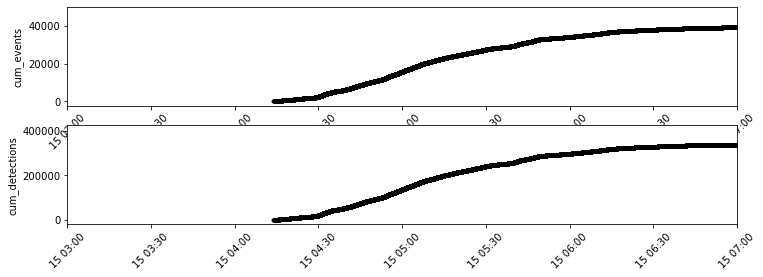

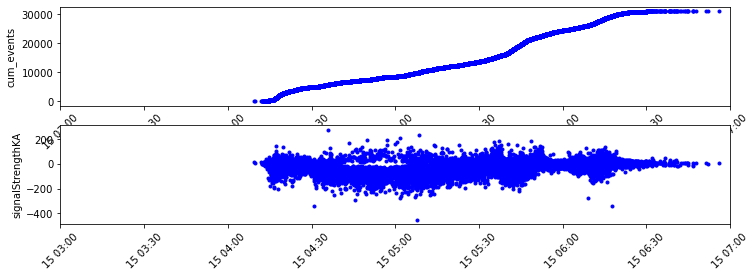

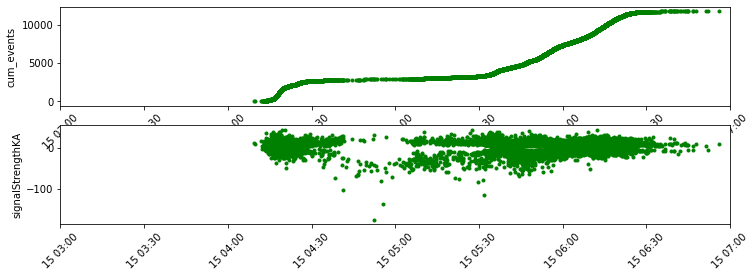

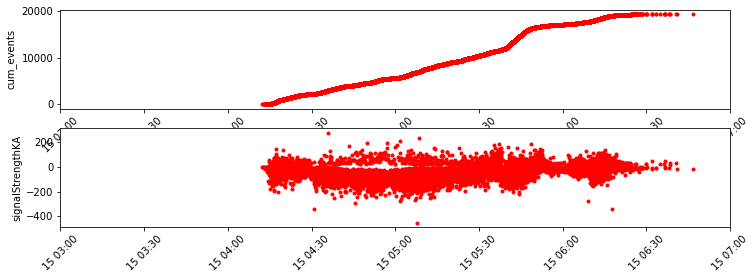

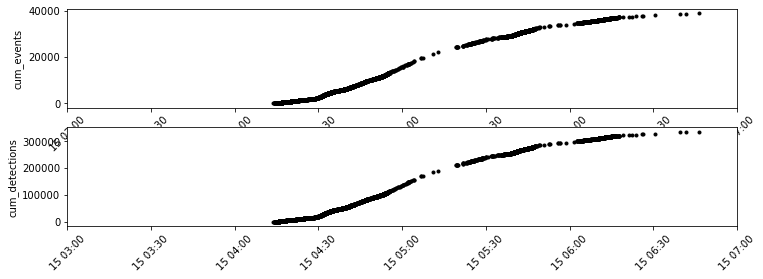

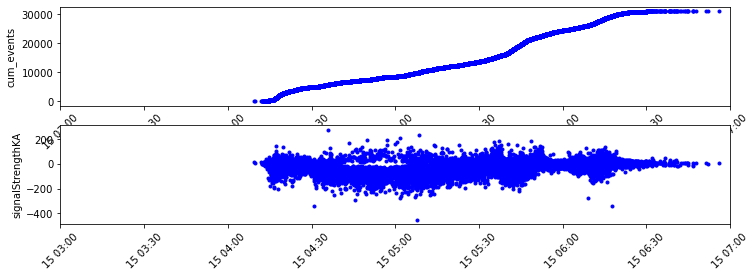

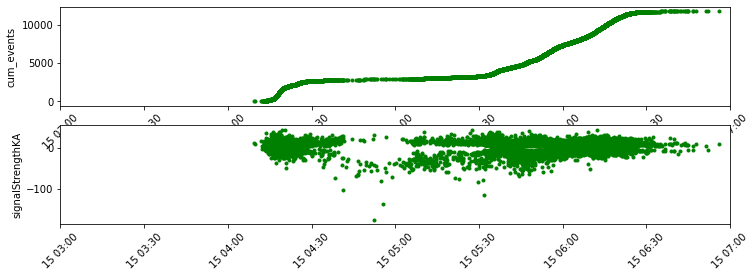

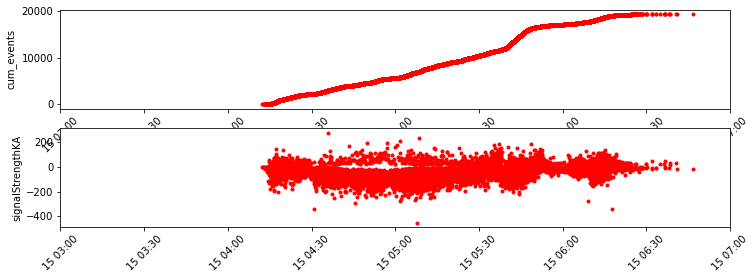

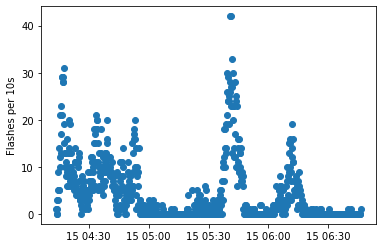

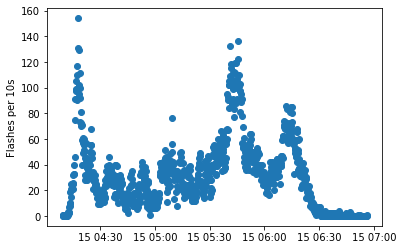

In [101]:
# read raw lightning data
wwlln_pickle_raw = os.path.join(libTonga.DATA_ROOT, 'PICKLE', 'DF_WWLLN_RAW.pkl')
if os.path.isfile(wwlln_pickle_raw):
    wwllndf = pd.read_pickle(wwlln_pickle_raw)
else:
    wwllndf = libTonga.read_wwlln()  
    wwllndf.to_pickle(wwlln_pickle_raw)

    
gld360_pickle_raw = os.path.join(libTonga.DATA_ROOT, 'PICKLE', 'DF_GLD360_RAW.pkl')
if os.path.isfile(gld360_pickle_raw):
    gld360df = pd.read_pickle(gld360_pickle_raw)
else:
    gld360df = libTonga.read_gld360()  
    gld360df.to_pickle(gld360_pickle_raw)

# plot
stime = datetime.datetime(2022, 1, 15, 3, 0, 0)
etime = datetime.datetime(2022, 1, 15, 7, 0, 0)
maxDistance = 15000.0 # was 10000
libTonga.plot_wwlln(wwllndf, starttime=stime, endtime=etime, radiusM=maxDistance )
libTonga.plot_gld360(gld360df, starttime=stime, endtime=etime, radiusM=maxDistance)
libTonga.plot_gld360(gld360df, lightning_type='cloud2cloud', starttime=stime, endtime=etime, radiusM=maxDistance)
libTonga.plot_gld360(gld360df, lightning_type='cloud2ground', starttime=stime, endtime=etime, radiusM=maxDistance)

# filter
wwlln_filt = libTonga.filter_df(wwllndf, starttime=stime, endtime=etime, radiusM=maxDistance)
gld360_filt = libTonga.filter_df(gld360df, starttime=stime, endtime=etime, radiusM=maxDistance)
libTonga.plot_wwlln(wwlln_filt, starttime=stime, endtime=etime, radiusM=maxDistance )
libTonga.plot_gld360(gld360_filt, starttime=stime, endtime=etime, radiusM=maxDistance)
libTonga.plot_gld360(gld360_filt, lightning_type='cloud2cloud', starttime=stime, endtime=etime, radiusM=maxDistance)
libTonga.plot_gld360(gld360_filt, lightning_type='cloud2ground', starttime=stime, endtime=etime, radiusM=maxDistance)

# bin
seconds = 10
binned_wwlln = libTonga.bin_by_seconds(wwlln_filt, seconds)
binned_gld360 = libTonga.bin_by_seconds(gld360_filt, seconds)
print(binned_wwlln)
wwlln_pickle_binned = os.path.join(libTonga.DATA_ROOT, 'PICKLE', 'DF_WWLLN_binned.pkl')
if os.path.isfile(wwlln_pickle_binned):
    binned_wwlln = pd.read_pickle(wwlln_pickle_binned)
else:
    binned_wwlln = libTonga.bin_by_seconds(wwlln_filt, seconds) 
    binned_wwlln.to_pickle(wwlln_pickle_binned)
    
gld360_pickle_binned = os.path.join(libTonga.DATA_ROOT, 'PICKLE', 'DF_GLD360_binned.pkl')
if os.path.isfile(gld360_pickle_binned):
    binned_gld360 = pd.read_pickle(gld360_pickle_binned)
else:
    binned_gld360 = libTonga.bin_by_seconds(gld360_filt, seconds) 
    binned_gld360.to_pickle(gld360_pickle_binned)

# plot binned data
fig, ax = plt.subplots(1,1)
ax.plot_date(binned_wwlln.index, binned_wwlln.ones)
ax.set_ylabel('Flashes per %ds' % seconds)
fig, ax = plt.subplots(1,1)
ax.plot_date(binned_gld360.index, binned_gld360.ones)
ax.set_ylabel('Flashes per %ds' % seconds)

# create Stream
st = obspy.Stream()
st.append(libTonga.column2Trace(binned_wwlln, 'ones', seconds, net='UW', sta='WWLLN', chan='CNT'))
st.append(libTonga.column2Trace(binned_wwlln, 'num_stations', seconds, net='UW', sta='WWLLN', chan='DET'))
st.append(libTonga.column2Trace(binned_wwlln, 'weightedDetections', seconds, net='UW', sta='WWLLN', chan='WDE'))
st.append(libTonga.column2Trace(binned_gld360, 'ones', seconds, net='VA', sta='GLD36', chan='CNT'))
st.append(libTonga.column2Trace(binned_gld360, 'signalPower', seconds, net='VA', sta='GLD36', chan='PWR'))
st.append(libTonga.column2Trace(binned_gld360, 'weightedPower', seconds, net='VA', sta='GLD36', chan='WPW'))
lightningmseed = os.path.join(libTonga.DATA_ROOT, 'MINISEED', 'lightning.mseed')
st.write(lightningmseed)

# plot Stream
fig  = plt.figure(figsize=(12,12))
#st.plot(equal_scale=False, starttime=obspy.UTCDateTime(stime), endtime=obspy.UTCDateTime(etime), fig=fig);  
st.plot(equal_scale=False);
ax = fig.axes
for this_ax in ax:
    this_ax.grid()

# 6. Poster figures
- compute moveout speed of N wave peak times
- Supersonic travel speed vs distance
- Pressure versus distance, corrected for actual circumference of wavefronts on a spherical earth
- Lightning vs seismic vs infrasound: Filter lightning, seismic, infrasound above 0.1 Hz from January 13-15.
- Ground coupled airwave amplitude vs airwave at different frequencies
- Time from seismic to infrasound to lightning origin, if I can figure that out
- Examine particle motion of those initial seismic waves
- - get GISMO and Antelope licence)
- Look for Youtube/human reported blasts in high frequency infrasound? 
- Examine amplitude, duration, and area to peak and under positive and negative portions of the Lamb wave. 

Model as a cylindrical source of tropospheric height? What about radius? A rise time of say 15 minutes might indicate a radius of say 900 s * 314 m/s = 280 km.

# 7. Miscellaneous stuff from before

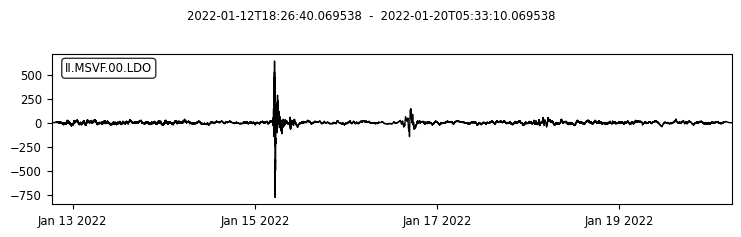

In [27]:
st_ldo_downsample_pick[0].plot();

## 3.1 Pick N-wave onsets

In [419]:
%matplotlib inline
rmax = 6000000
cmin=210
cmax=410

st = raw_st_ldo.copy()
st = smart_merge(st)
#r = get_distance_vector(st_downsample)

st = obspy.Stream()
for tr in st_downsample:
    if tr.stats.distance < rmax:
        st.append(tr)

#decimation_factor=10 
#stdown=st.copy()
#stdown.decimate(decimation_factor)  

r = get_distance_vector(st)
st = order_traces_by_distance(st, r) 
#stpicked = manually_select_good_traces(stdown, trim_mins=0, record_section=False, auto=False, wlen=7200, rmax=rmax)

32 Trace(s) in Stream:

II.MSVF.00.LDO | 2022-01-12T18:26:40.069538Z - 2022-01-20T05:33:10.069538Z | 0.1 Hz, 64480 samples
...
(30 other traces)
...
IU.GUMO.30.LDO | 2022-01-12T18:26:40.666680Z - 2022-01-20T05:33:10.666680Z | 0.1 Hz, 64480 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]
[1, 1.01, 1.0201] [157164.80076633673, 171247.19648849664, 169628.90535007953]
[1, 1.01, 1.0201] [11654.887108982452, 23136.538380708731, 22964.732049638042]
[ 2.87957856  4.59457937  2.92080658  4.59374496  2.92080658] [ 4.14099817  2.43757494  2.67909719  1.65848     3.80906884]
-0.892979093437 6.14360850629


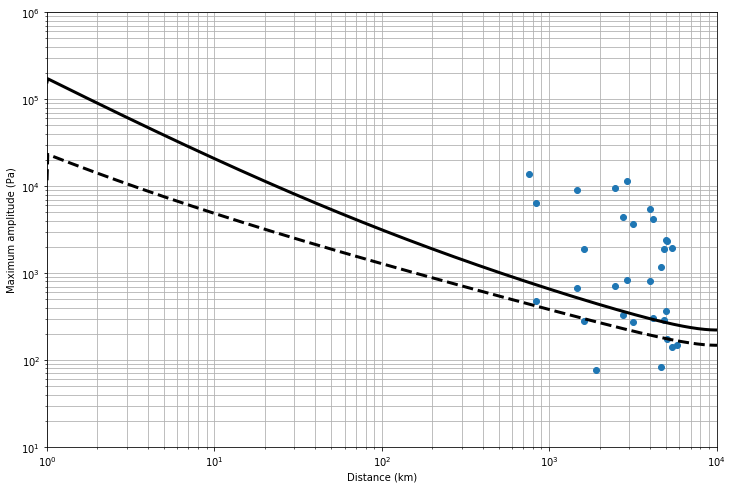

In [409]:
print(stpicked)
plot_amplitude_versus_distance(stpicked, 'Pa', reftime=otime, cmin=280, cmax=360, duration=7200)

In [415]:
for tr in stpicked: 
    print(tr.stats.arrival)

AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 4, 7, 40), 'c': -1783.1572063870744, 'traveltime': -425.0})
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 3, 58, 40), 'c': -863.53364987524094, 'traveltime': -965.0})
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 3, 58, 40), 'c': -863.53364987524094, 'traveltime': -965.0})
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 3, 30), 'c': -310.35753151940685, 'traveltime': -2685.0})
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 4, 22, 10), 'c': 3281.8015942537522, 'traveltime': 445.0})
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 3, 41, 20), 'c': -728.37990495906229, 'traveltime': -2005.0})
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 3, 52, 10), 'c': -1197.2103579487682, 'traveltime': -1355.0})
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 3, 52, 10), 'c': -1197.2103579487682, 'traveltime': -1355.0})
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 3, 39, 30), 'c': -899.88302315198291, 'travelti

In [ ]:
import matplotlib
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
stpicked = st.copy()
pick_pressure_onset(stpicked, otime)
%matplotlib inline

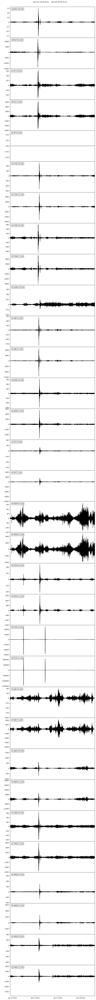

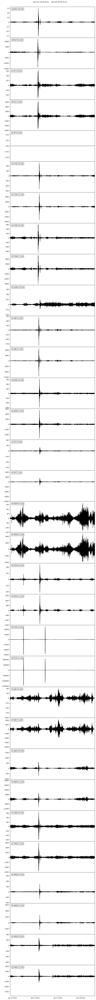

In [418]:
stpicked.plot(equal_scale=False)

Pick onset times with left mouse button. Middle button to skip trace.
infrasonic wave speed = 240.7 m/s, origin time = 2022-01-14 23:57:13
Average speed to station MSVF at 757.8 km is 55.8 m/s
To fit earthquake time, speed is -404.2 m/s


(240.65964329038687,
 2022-01-14T23:57:13.269563Z,
 array([-15451.73043671, -15450.81543671, -15449.90043671, ...,
           913.04456331,    913.95956331,    914.87456331]),
 array([  0.00000000e+00,   2.20203574e+02,   4.40407147e+02, ...,
          3.93834091e+06,   3.93856112e+06,   3.93878132e+06]))

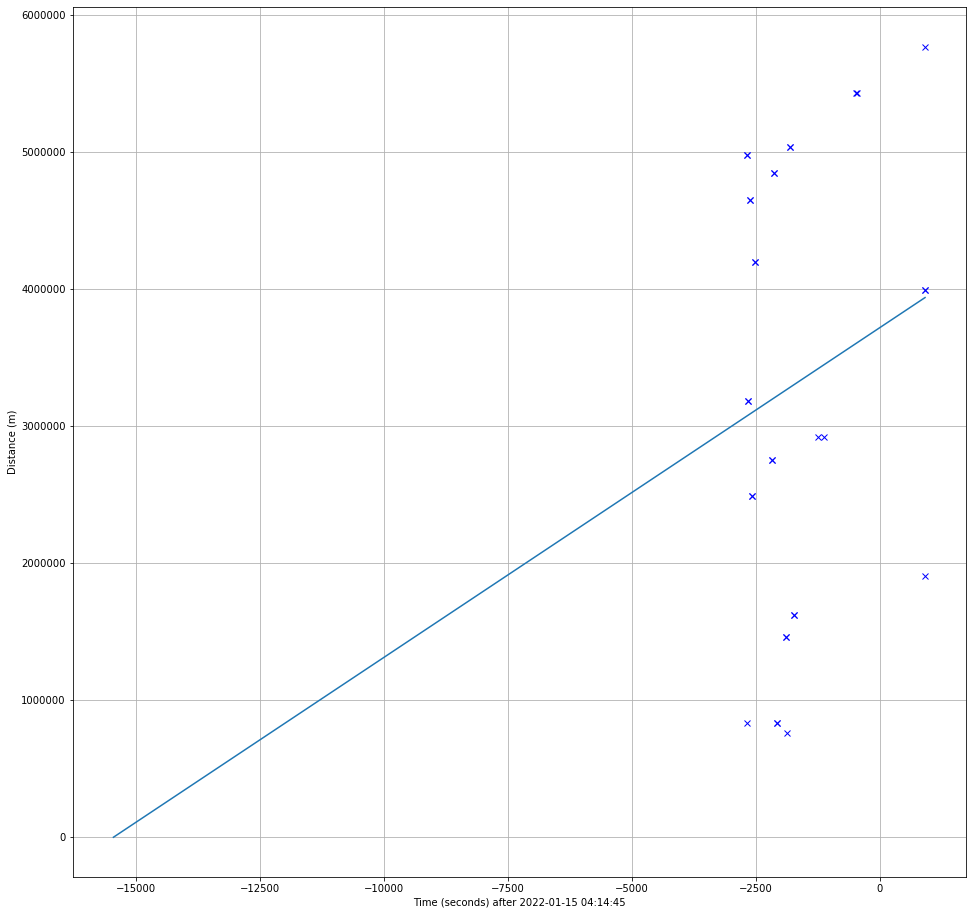

In [421]:
pick_pressure_onset(st, otime, manual=False)
regress_arrival_times(st, otime, outfile=None)

Trimming
[[312, UTCDateTime(2022, 1, 15, 4, 14, 45)]]
[312, UTCDateTime(2022, 1, 15, 4, 14, 45)]


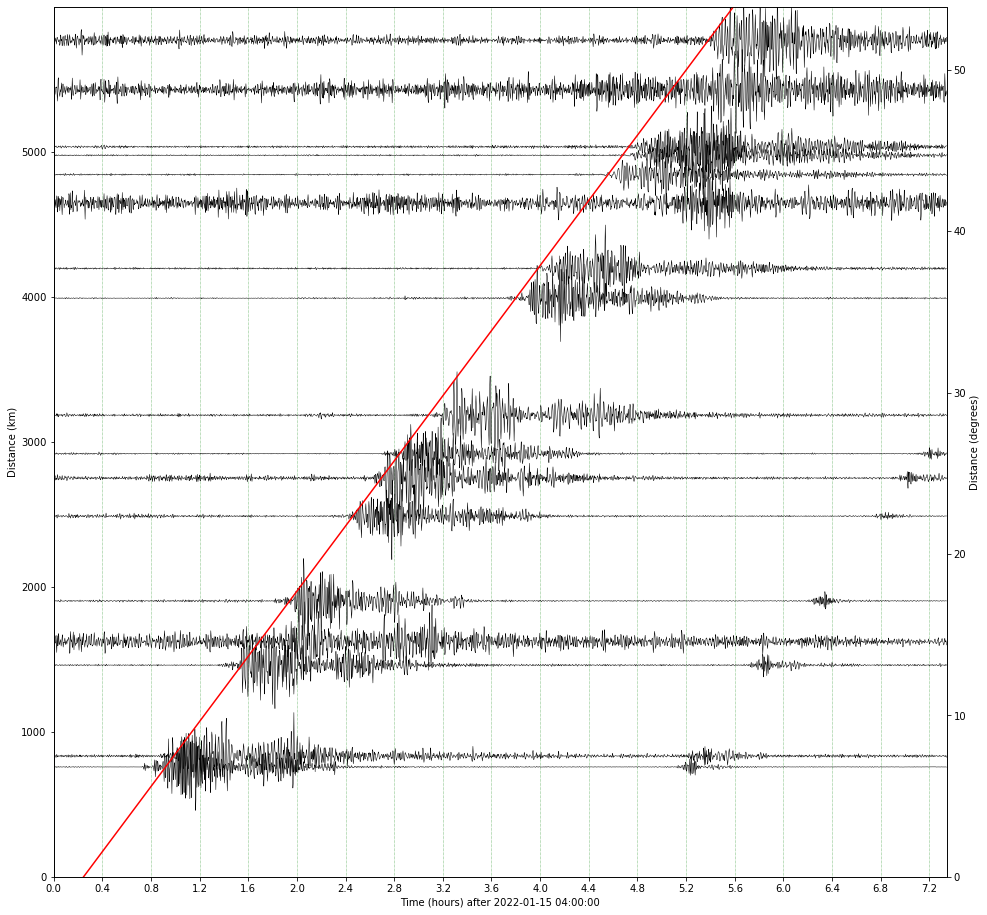

In [428]:
reftime = obspy.UTCDateTime(2022,1,15,4,0,0)
clamb = 312
stime = reftime
etime = stime + 7200 + rmax/clamb
plot_record_section(stpicked, reftime, outfile=None, starttime=stime, endtime=etime, \
                        km_min=0, km_max=rmax/1000, slopes = [[clamb, obspy.UTCDateTime(2022,1,15,4,14,45)]], \
                        scale_factor=300.0, plot_arrivals=False, \
                        figsize=(16,16), min_spacing_km=10, normalize=True) #, reduced_speed=clamb )

Trimming


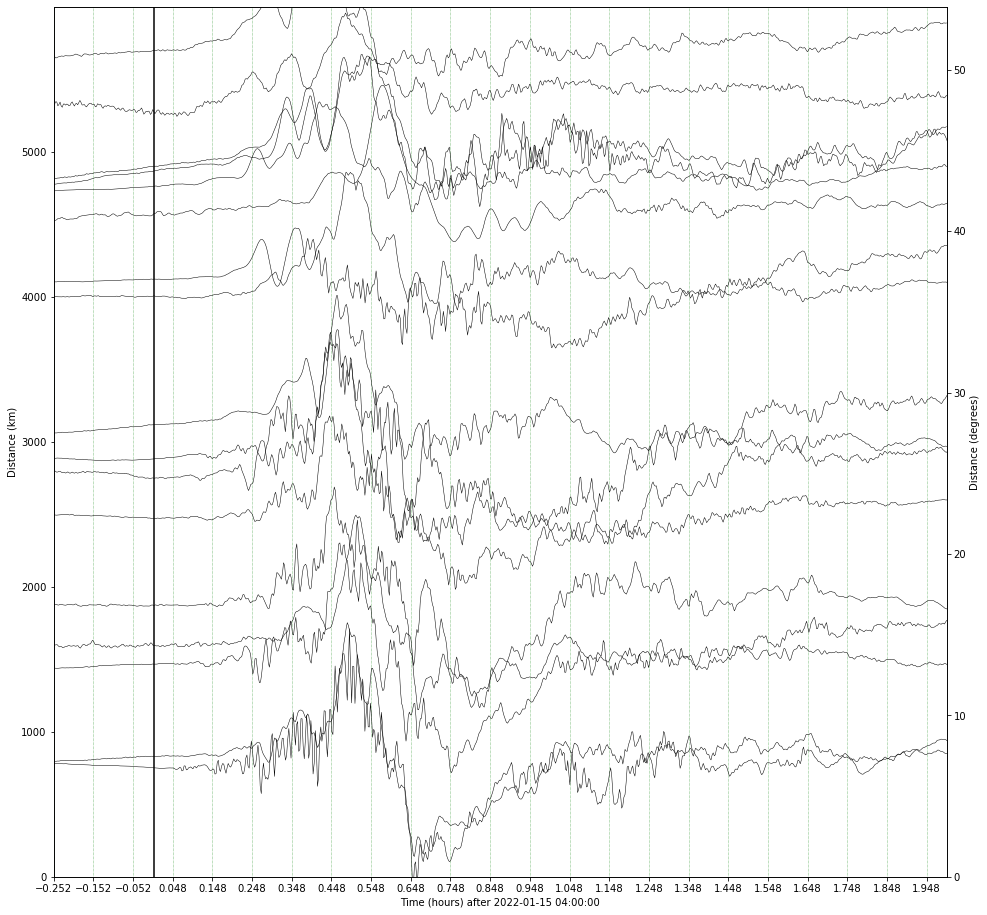

In [62]:
plot_record_section(stpicked, reftime, outfile=None, starttime=stime-900, endtime=stime+7200, \
                        km_min=0, km_max=rmax/1000, \
                        scale_factor=900.0, plot_arrivals=False, \
                        figsize=(16,16), min_spacing_km=10, normalize=True, reduced_speed=clamb )

2022-01-15T05:08:29.740569Z 2022-01-15T05:09:49.990685Z 2412.74056897 2492.99068497 80.250116
II.MSVF.00.LDO | 2022-01-12T17:45:07.078853Z - 2022-01-20T04:51:37.078853Z | 0.1 Hz, 64480 samples
2022-01-15T05:12:30.008507Z 2022-01-15T05:13:30.784960Z 2653.00850726 2713.78495926 60.776452
IU.AFI.30.LDO | 2022-01-12T17:41:26.881721Z - 2022-01-20T04:47:56.881721Z | 0.1 Hz, 64480 samples
2022-01-15T05:12:30.008507Z 2022-01-15T05:13:31.089280Z 2653.00850726 2714.08927926 61.080772
IU.AFI.31.LDO | 2022-01-12T17:41:26.881721Z - 2022-01-20T04:47:56.881721Z | 0.1 Hz, 64480 samples
2022-01-15T05:45:46.480132Z 2022-01-15T05:45:40.390694Z 4649.48013194 4643.39069394 -6.089438
IU.FUNA.30.LDO | 2022-01-12T17:09:17.275986Z - 2022-01-20T04:15:47.275986Z | 0.1 Hz, 64480 samples
2022-01-15T05:45:46.480132Z 2022-01-15T05:45:41.089280Z 4649.48013194 4644.08927994 -5.390852
IU.FUNA.31.LDO | 2022-01-12T17:09:16.881720Z - 2022-01-20T04:15:46.881720Z | 0.1 Hz, 64480 samples
2022-01-15T05:54:21.661048Z 2022-01-1

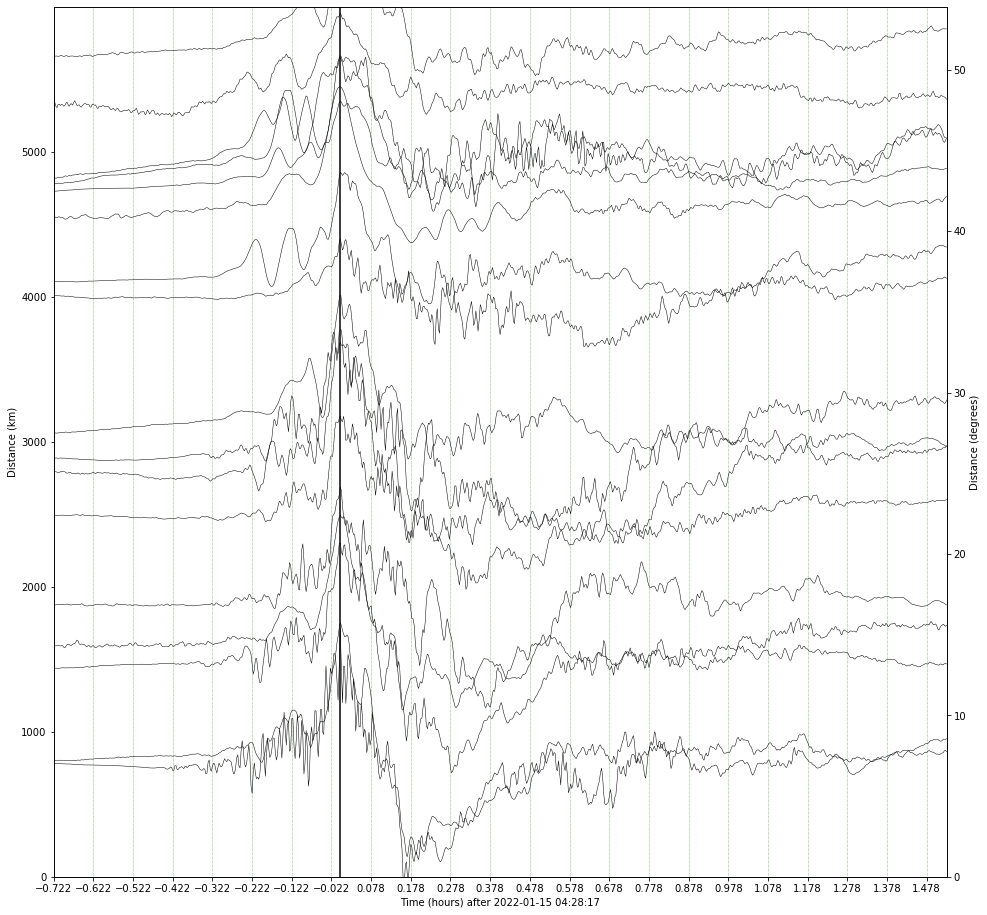

In [77]:
streduced = stpicked.copy()
reduced_speed = 314.1
reftime = obspy.UTCDateTime(2022,1,15,4,28,17)
for tr in streduced: # need to remove travel time from traces by altering starttime
    predicted_travel_time = tr.stats.distance/reduced_speed
    predicted_arrival_time = reftime + predicted_travel_time
    #print(tr.stats['arrival'])
    if 'arrival' in tr.stats:
        actual_arrival_time = tr.stats['arrival']['arrivaltime']
        actual_minus_predicted = actual_arrival_time - predicted_arrival_time
        actual_travel_time = actual_minus_predicted + predicted_travel_time
        print(predicted_arrival_time, actual_arrival_time, predicted_travel_time, actual_travel_time, actual_minus_predicted)
        tr.stats.starttime = tr.stats.starttime - actual_travel_time
        print(tr)
plot_record_section(streduced, reftime, outfile=None, starttime=stime-900, endtime=stime+7200, \
                        km_min=0, km_max=rmax/1000, \
                        scale_factor=900.0, plot_arrivals=False, \
                        figsize=(16,16), min_spacing_km=10, normalize=True )

II.MSVF.00.LDO | 2022-01-15T02:59:57.078853Z - 2022-01-15T06:59:57.078853Z | 0.1 Hz, 1441 samples


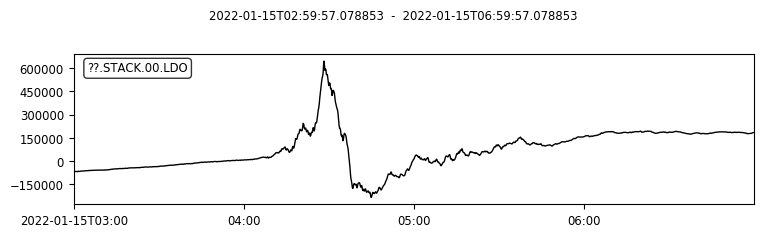

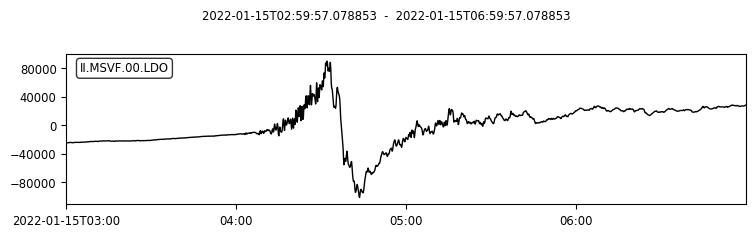

In [105]:
st3 = streduced.copy()
st3.trim(starttime=obspy.UTCDateTime(2022,1,15,3,0,0), endtime=obspy.UTCDateTime(2022,1,15,7,0,0))
stack = st3.copy()[0]
print(stack)
stack.id='??.STACK.00.LDO'

for tr in st3[1:]:
    stack.data = stack.data + tr.data

stack.plot();
msvf = st3.select(station='MSVF')
msvf.plot();

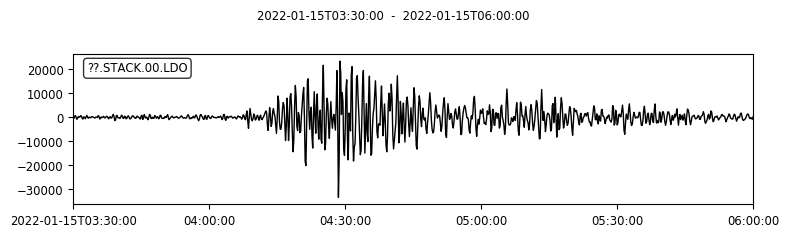

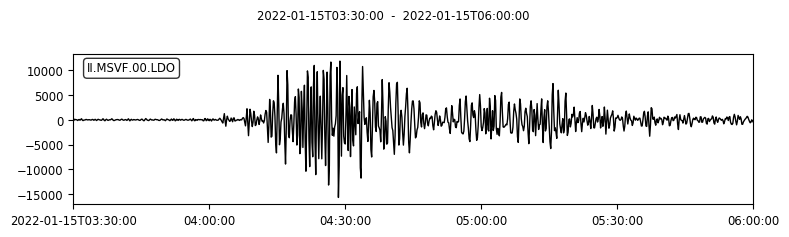

In [116]:
stime = obspy.UTCDateTime(2022,1,15,3,30,0)
etime = stime + 9000
stack.plot(starttime=stime, endtime=etime);
msvf = st3.select(station='MSVF')
msvf.plot(starttime=stime, endtime=etime);

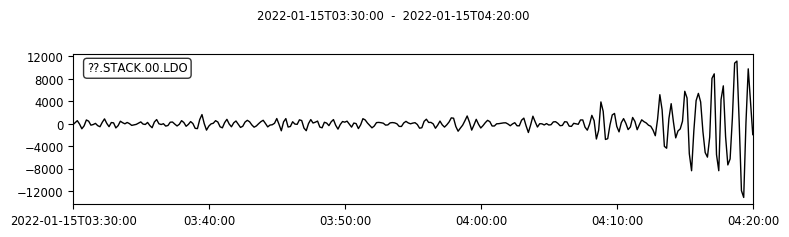

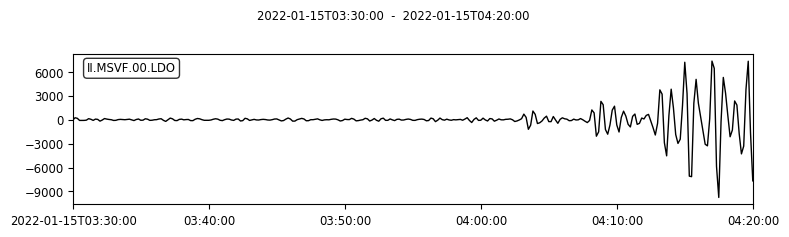

In [117]:
stime = obspy.UTCDateTime(2022,1,15,3,30,0)
etime = stime +3000
stack.filter('highpass',freq=0.01).plot(starttime=stime, endtime=etime);
msvf = st3.select(station='MSVF')
msvf.filter('highpass',freq=0.01).plot(starttime=stime, endtime=etime);

The plots show data from a STACK, reduced with a speed of 314.1 m/s, and MSVF.

From the plots above, there is certainly evidence for an infrasound arrival around 04:03, and another around 04:08 before ramping up at 04:13.

The STACK trace actually suggests there was not a signal at 04:03 because it was not bigger than signals before 04:00. The signal on MSVF might still be real.

What I still need to do is examine higher frequency infrasound, ahead of the Lamb wave, and see how fast that travelled.

In [108]:
%matplotlib inline
rmax = 6000000
cmin=210
cmax=410

st = st_ldo.copy()
st = smart_merge(st)
#r = get_distance_vector(st_downsample)

st = obspy.Stream()
for tr in st_downsample:
    if tr.stats.distance < rmax:
        st.append(tr)

#decimation_factor=10 
#stdown=st.copy()
#stdown.decimate(decimation_factor)  

r = get_distance_vector(st)
st = order_traces_by_distance(st, r) 
#stpicked = manually_select_good_traces(stdown, trim_mins=0, record_section=False, auto=False, wlen=7200, rmax=rmax)

Pick onset times with left mouse button. Middle button to skip trace.
2022-01-15T04:43:30.929753Z
2022-01-15T04:43:13.983516Z
2022-01-15T04:43:09.924377Z
2022-01-15T04:42:50.671689Z
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 4, 42, 50, 671689), 'c': 449.57853754077411, 'traveltime': 1685.671689})
2022-01-15T04:56:59.268831Z
2022-01-15T04:56:54.043024Z
2022-01-15T04:56:00.022713Z
2022-01-15T04:55:59.996429Z
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 4, 55, 59, 996429), 'c': 336.69138361799531, 'traveltime': 2474.996429})
2022-01-15T04:56:35.917237Z
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 4, 56, 35, 917237), 'c': 331.87472683298461, 'traveltime': 2510.917237})
2022-01-15T05:20:34.215067Z
2022-01-15T05:20:38.236572Z
2022-01-15T05:20:46.719249Z
2022-01-15T05:20:50.693562Z
AttribDict({'arrivaltime': UTCDateTime(2022, 1, 15, 5, 20, 50, 693562), 'c': 368.25883962310041, 'traveltime': 3965.693562})
2022-01-15T05:21:21.831215Z
2022-01-15T05:21:04.884978Z
2022-01-15

(298.81644581994925,
 2022-01-15T04:05:14.567125Z,
 array([  -570.4328753 ,   -551.90827314,   -533.38367097, ...,
         18472.85814929,  18491.38275146,  18509.90735362]),
 array([  0.00000000e+00,   5.53545578e+03,   1.10709116e+04, ...,
          5.69044854e+06,   5.69598400e+06,   5.70151945e+06]))

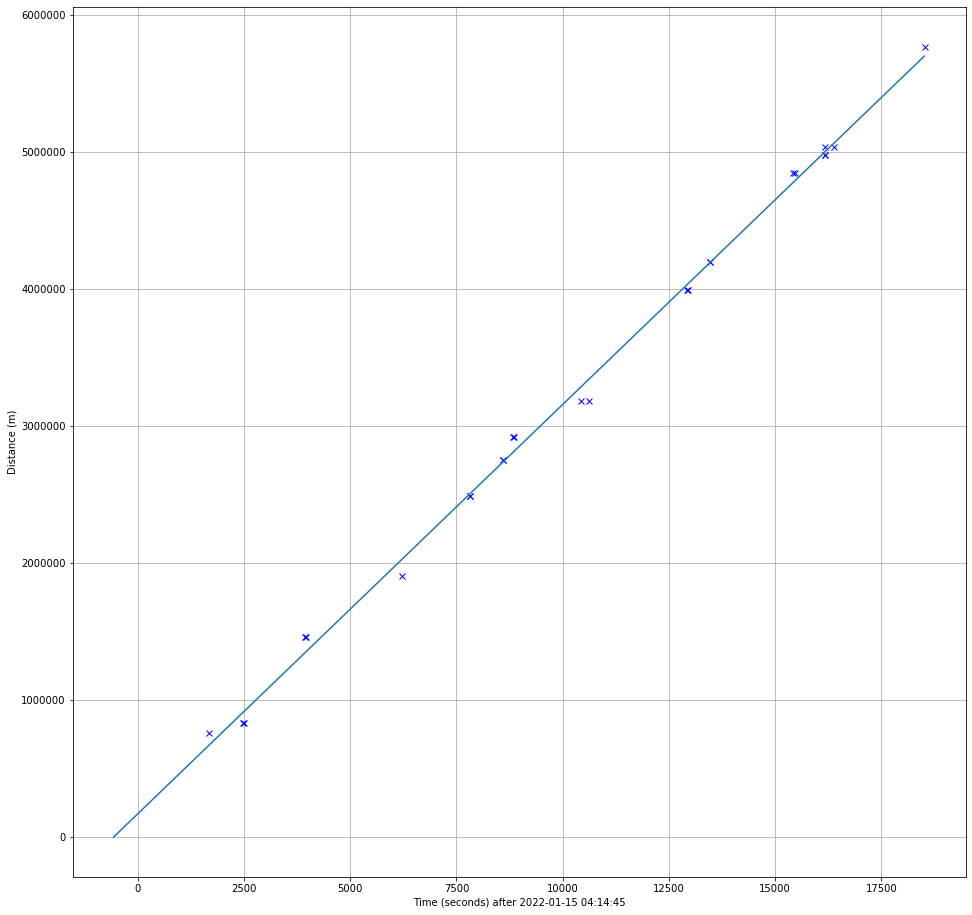

In [110]:
import matplotlib
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
stpicked = st.copy()
stpicked.filter('highpass',freq=0.01,corners=4)
pick_pressure_onset(stpicked, otime)
%matplotlib inline
regress_arrival_times(stpicked, otime, outfile=None)


Trimming
[[298.8, UTCDateTime(2022, 1, 15, 4, 1, 30)], [298.8, UTCDateTime(2022, 1, 15, 8, 25)]]
[298.8, UTCDateTime(2022, 1, 15, 4, 1, 30)]
[298.8, UTCDateTime(2022, 1, 15, 8, 25)]


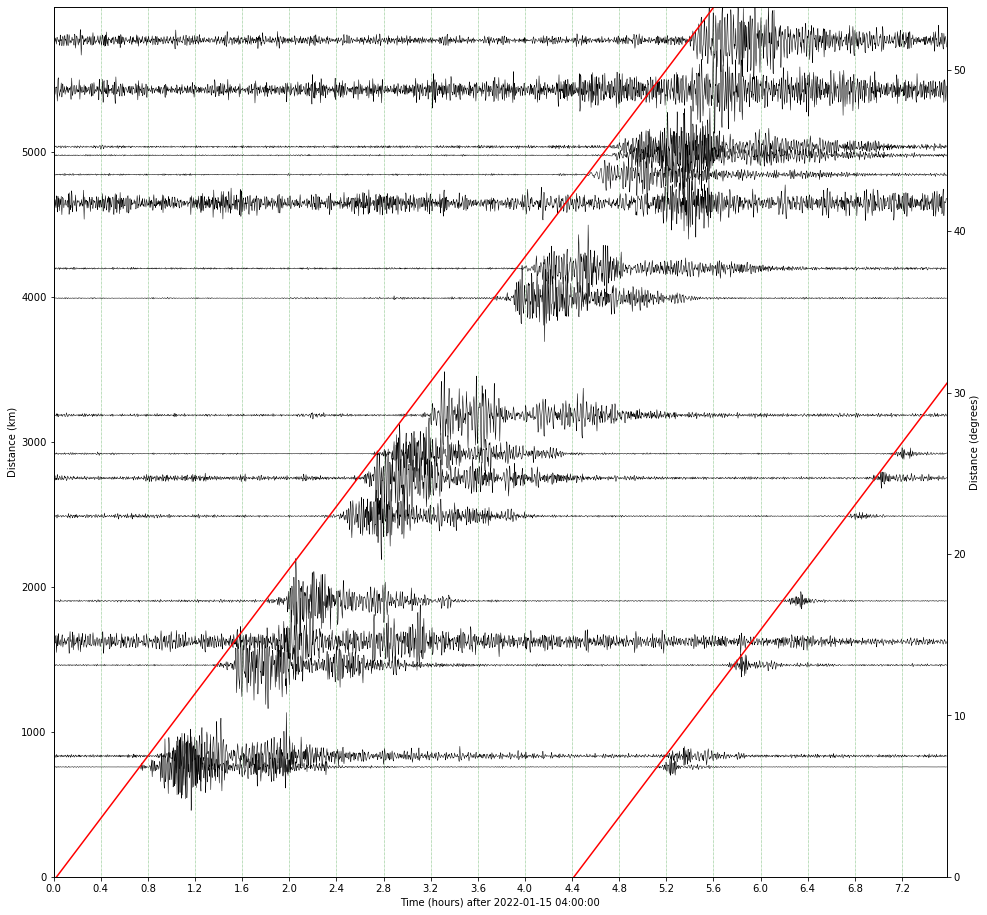

In [435]:
reftime = obspy.UTCDateTime(2022,1,15,4,0,0)
clamb = 298.8
stime = reftime
etime = stime + 7200 + rmax/clamb
plot_record_section(stpicked, reftime, outfile=None, starttime=stime, endtime=etime, \
                        km_min=0, km_max=rmax/1000, slopes = [[clamb, obspy.UTCDateTime(2022,1,15,4,1,30)], [clamb, obspy.UTCDateTime(2022,1,15,8,25,0)]], \
                        scale_factor=300.0, plot_arrivals=False, \
                        figsize=(16,16), min_spacing_km=10, normalize=True) #, reduced_speed=clamb )

### 3.1.1 Raw traces

In [130]:
# Parameters for high frequency data
DATA_ROOT = os.path.join(os.getenv('HOME'), 'DATA', 'Tonga_eruption_analysis')
if not os.path.isdir(DATA_ROOT):
    os.makedirs(DATA_ROOT)
searchRadiusDeg = 60
fmin = 0.0001
T = 1.0/fmin
circum_earth_km = 40075
circum_earth_m = circum_earth_km*1000
m_per_deg = circum_earth_m/360.0

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

startt =  obspy.core.UTCDateTime('2022-01-15T03:45:00.000000Z') 
endt = obspy.core.UTCDateTime('2022-01-15T12:00:00.000000Z') 

/home/thompsong/DATA/Tonga_eruption_analysis/iris_HDF_within_60_degrees.xml /home/thompsong/DATA/Tonga_eruption_analysis/iris_HDF_within_60_degrees.mseed
Trying to load inventory from 2022/01/15 03:45 to 2022/01/15 12:00
inventory saved to /home/thompsong/DATA/Tonga_eruption_analysis/iris_HDF_within_60_degrees.xml
waveform downloaded for  HV.WALE.HDF
More than 1 Trace
waveform downloaded for  HV.WALE.HDF
More than 1 Trace
waveform downloaded for  HV.WALE.HDF
More than 1 Trace
waveform downloaded for  HV.WALE.HDF
More than 1 Trace
waveform downloaded for  HV.WALE.HDF
More than 1 Trace
waveform downloaded for  HV.WALE.HDF
More than 1 Trace
Failed to reconstitute:  []


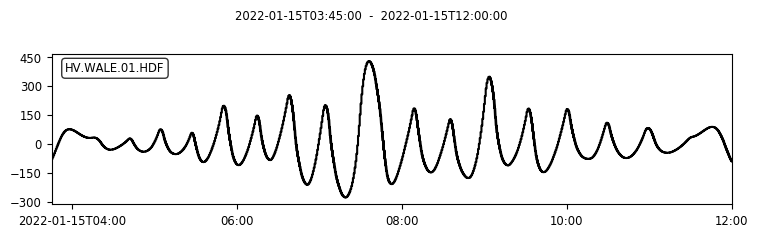

max amp =  427.702415288
distance =  4981128.06792
keep this trace? (y) (y/n): 


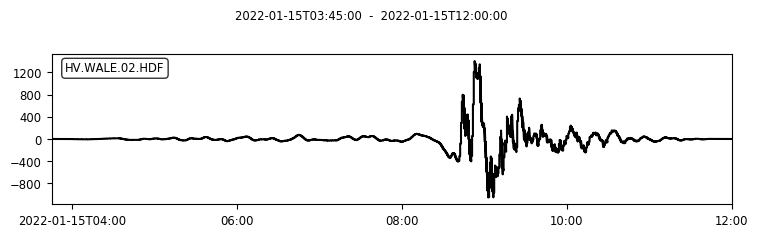

max amp =  1401.71534022
distance =  4981114.73532
keep this trace? (n) (y/n): y


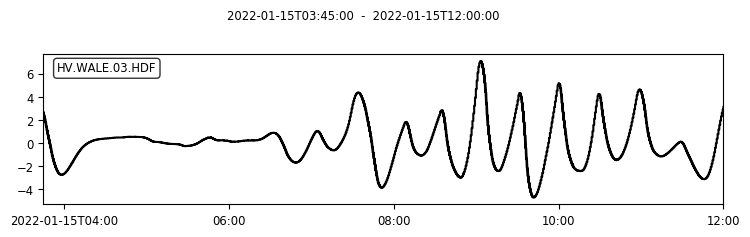

max amp =  7.09695719037
distance =  4981131.29647
keep this trace? (y) (y/n): y


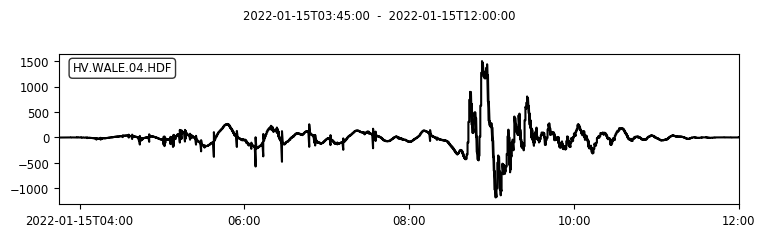

max amp =  1500.86021921
distance =  4981171.05471
keep this trace? (n) (y/n): y


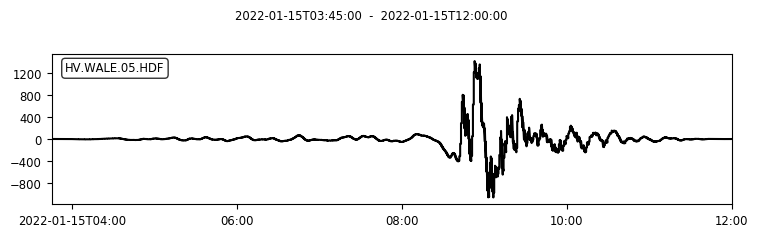

max amp =  1424.4248224
distance =  4981202.98917
keep this trace? (y) (y/n): y


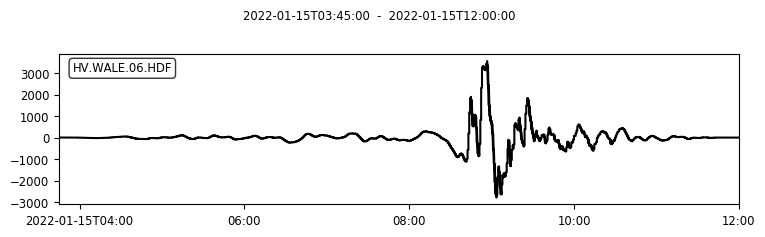

max amp =  3568.92102564
distance =  4981177.6038
keep this trace? (n) (y/n): y
['HV.WALE.01.HDF', 'HV.WALE.02.HDF', 'HV.WALE.03.HDF', 'HV.WALE.04.HDF', 'HV.WALE.05.HDF', 'HV.WALE.06.HDF']
6
Failed to subset inventory. Returning unchanged


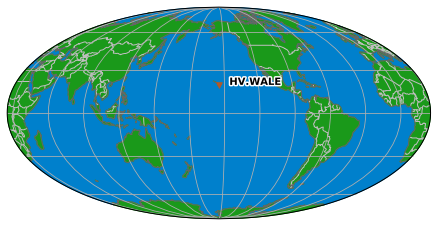

In [132]:
fdsnURL = "http://service.iris.edu"
chanstring = 'HDF'
st_hdf, inv_hdf, raw_st_hdf, raw_inv_hdf = analyze_clientchan(fdsnURL, chanstring, fmin=fmin, searchRadiusDeg=searchRadiusDeg)

In [137]:
raw_st_hdf_merged = smart_merge(raw_st_hdf)

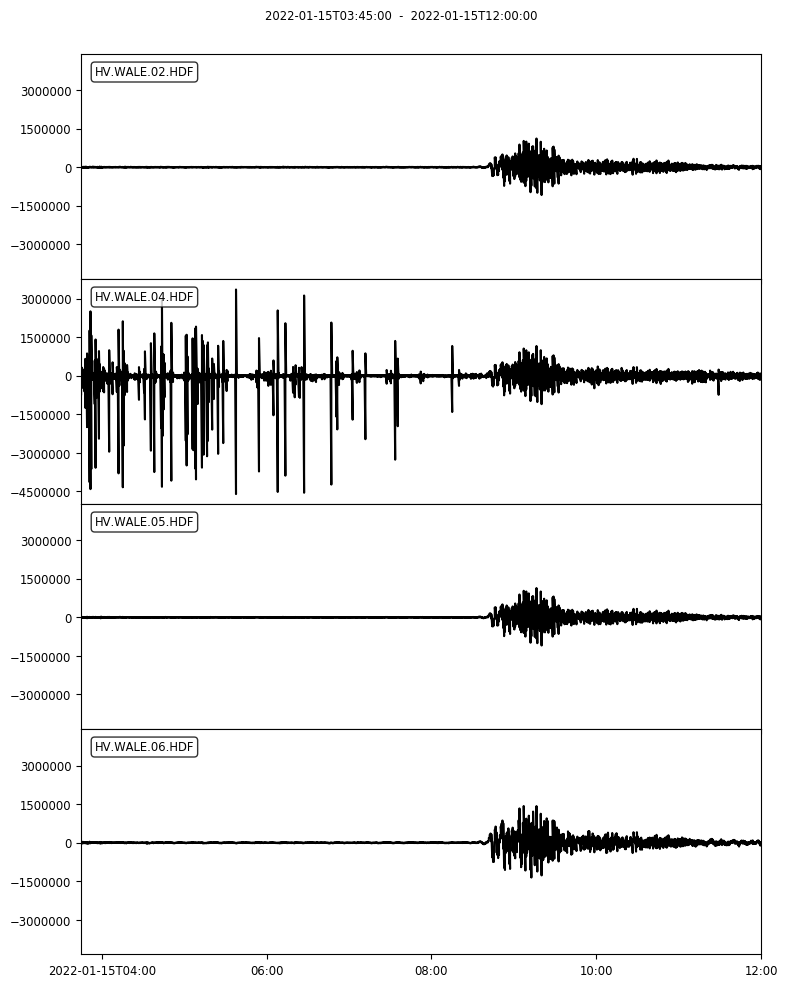

In [140]:
for tr in raw_st_hdf_merged:
    if tr.stats.location == '01' or tr.stats.location == '03':
        raw_st_hdf_merged.remove(tr)
raw_st_hdf_merged.plot();

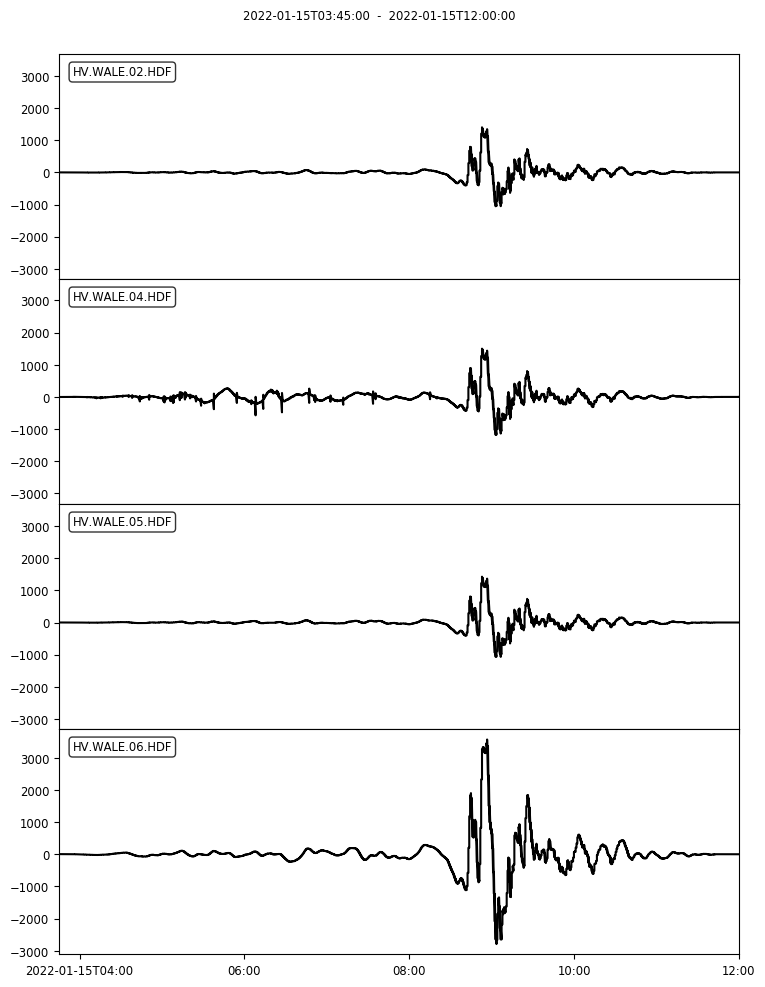

In [141]:
for tr in st_hdf:
    if tr.stats.location == '01' or tr.stats.location == '03':
        st_hdf.remove(tr)
st_hdf.plot();

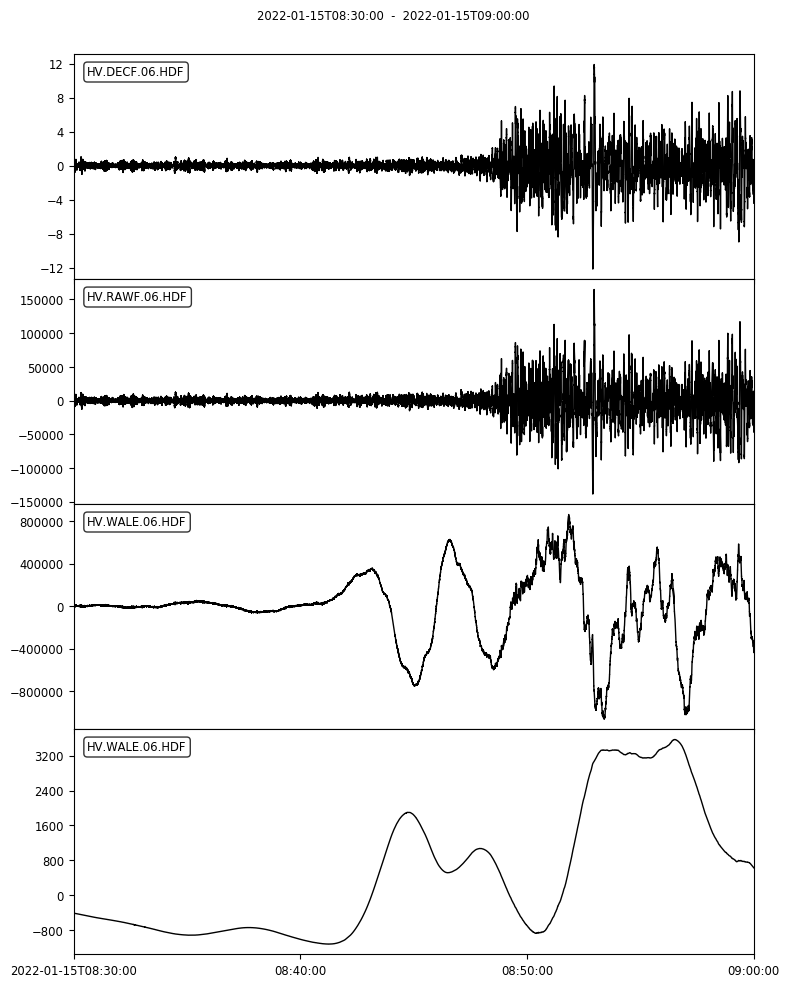

In [151]:
fcorner = 0.1
st_hdf_filt = st_hdf.copy()
st_hdf_filt.filter('highpass', freq=fcorner, corners=4)
st_hdf_filt[-1].stats.station = 'DECF'
raw_st_hdf_merged_filt = raw_st_hdf_merged.copy()
raw_st_hdf_merged_filt[-1].stats.station = 'RAWF'
raw_st_hdf_merged_filt.filter('highpass', freq=fcorner, corners=4)
st_tmp = obspy.Stream()
st_tmp.append(raw_st_hdf_merged[-1])
st_tmp.append(raw_st_hdf_merged_filt[-1])
st_tmp.append(st_hdf[-1])
st_tmp.append(st_hdf_filt[-1]);
st_tmp.plot(equal_scale=False, starttime=obspy.UTCDateTime(2022,1,15,8,30,0), endtime=obspy.UTCDateTime(2022,1,15,9,0,0));

In [157]:
traveltime = tr.stats.distance/314
origintime = obspy.UTCDateTime(2022,1,15,8,42,0) - traveltime
print(origintime)

2022-01-15T04:17:36.377058Z


/home/thompsong/DATA/Tonga_eruption_analysis/iris_BDF_within_60_degrees.xml /home/thompsong/DATA/Tonga_eruption_analysis/iris_BDF_within_60_degrees.mseed
Trying to load inventory from 2022/01/15 03:45 to 2022/01/15 12:00
inventory saved to /home/thompsong/DATA/Tonga_eruption_analysis/iris_BDF_within_60_degrees.xml
waveform downloaded for  AU.I07H1.BDF
waveform downloaded for  AU.I07H2.BDF
waveform downloaded for  AU.I07H3.BDF
waveform downloaded for  AU.I07H4.BDF
waveform downloaded for  AU.I07H5.BDF
waveform downloaded for  AU.I07H6.BDF
waveform downloaded for  AU.I07H7.BDF
waveform downloaded for  AU.I07H8.BDF
waveform downloaded for  HV.AHUD.BDF
More than 1 Trace
waveform downloaded for  HV.AHUD.BDF
More than 1 Trace
waveform downloaded for  HV.AHUD.BDF
More than 1 Trace
waveform downloaded for  HV.AHUD.BDF
More than 1 Trace
failed to download waveform for  II.KWJN.BDF
failed to download waveform for  IM.I05H1.BDF
failed to download waveform for  IM.I05H2.BDF
failed to download wave

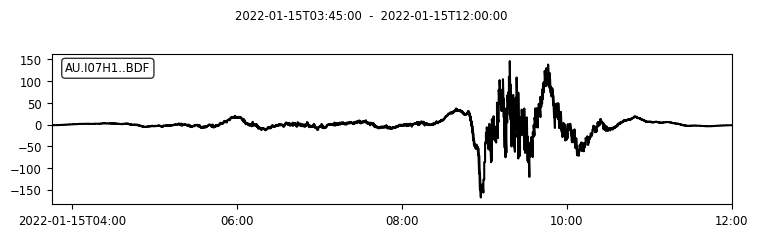

max amp =  167.727961338
distance =  5225147.70239
keep this trace? (y) (y/n): 


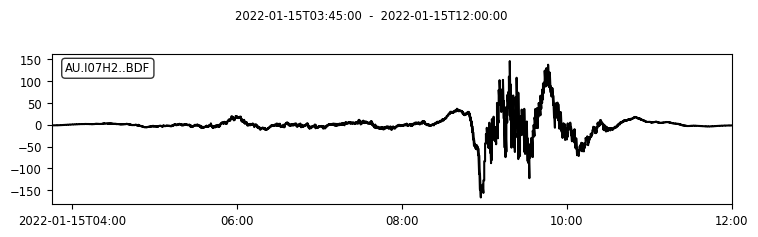

max amp =  166.843324584
distance =  5225032.36003
keep this trace? (y) (y/n): 


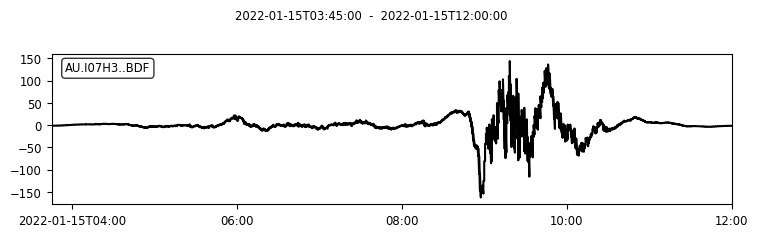

max amp =  162.511760763
distance =  5224991.77076
keep this trace? (y) (y/n): 


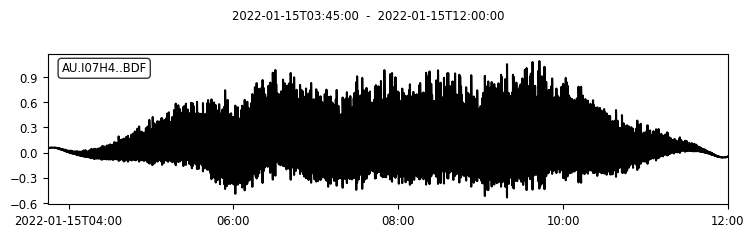

max amp =  1.09101478111
distance =  5225334.51897
keep this trace? (y) (y/n): n


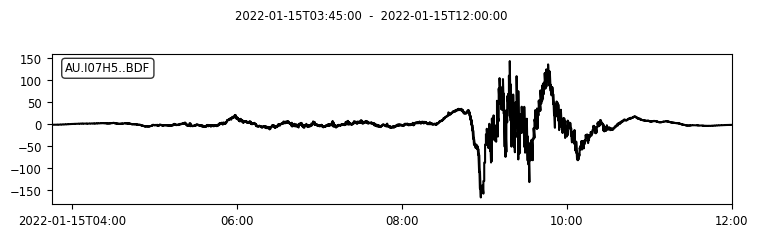

max amp =  166.332527496
distance =  5225732.26082
keep this trace? (y) (y/n): y


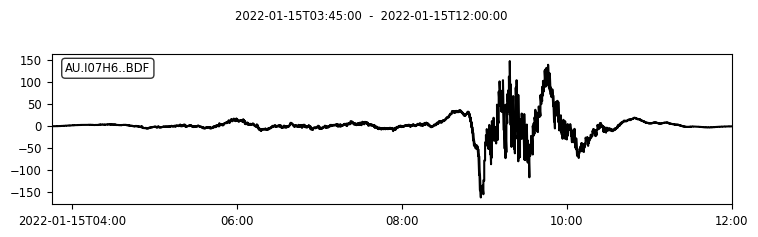

max amp =  163.081063949
distance =  5224230.69431
keep this trace? (y) (y/n): 


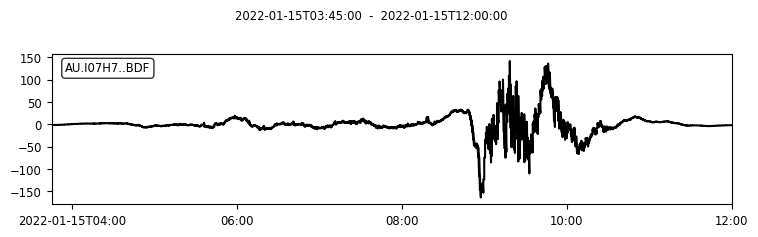

max amp =  163.692154767
distance =  5224006.13237
keep this trace? (y) (y/n): 


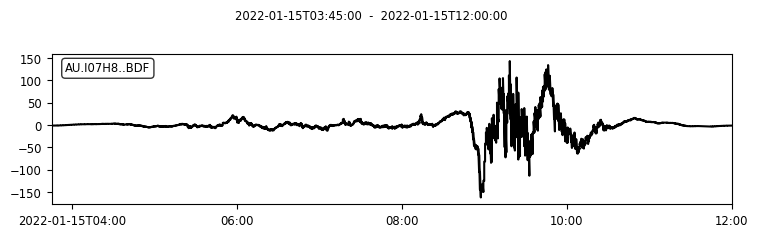

max amp =  162.479095576
distance =  5225669.02658
keep this trace? (y) (y/n): 


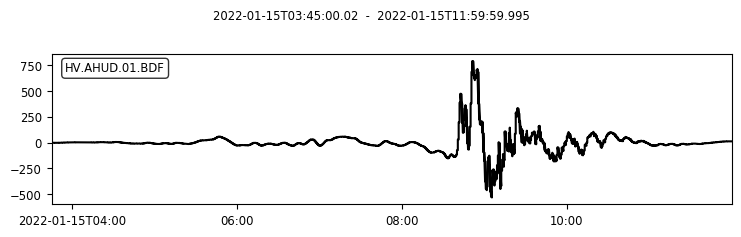

max amp =  786.667121009
distance =  4952104.48916
keep this trace? (n) (y/n): y


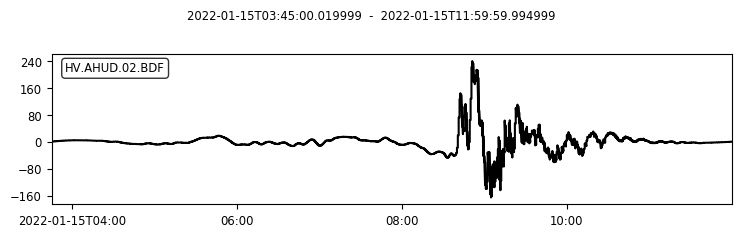

max amp =  239.815510285
distance =  4952142.40274
keep this trace? (y) (y/n): y


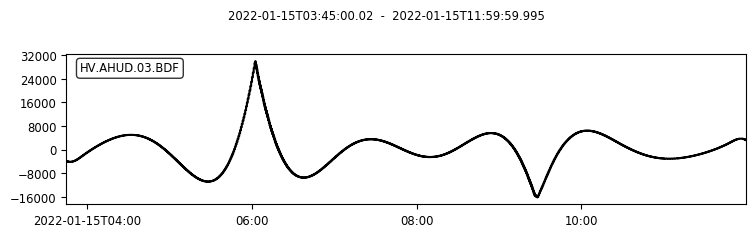

max amp =  30022.8293629
distance =  4952118.13674
keep this trace? (n) (y/n): n


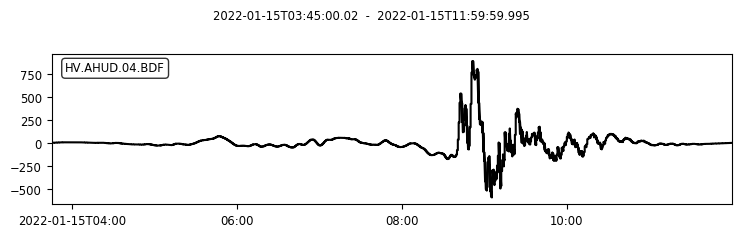

max amp =  890.75008219
distance =  4952051.24291
keep this trace? (n) (y/n): y


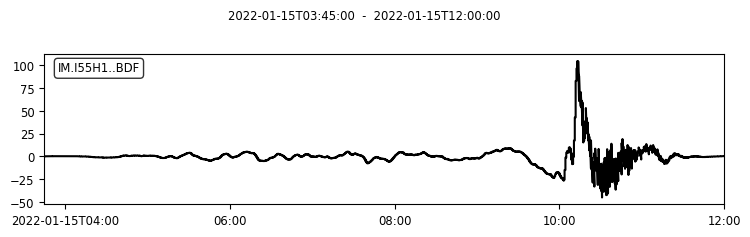

max amp =  104.526352912
distance =  6420246.85925
keep this trace? (y) (y/n): y


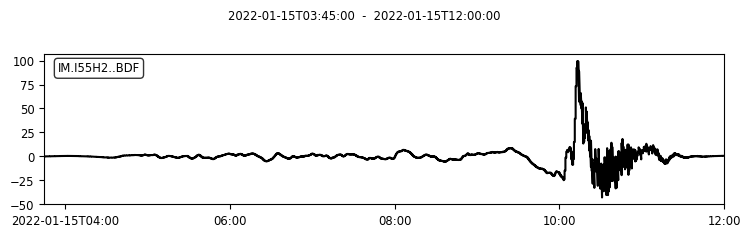

max amp =  99.5256332887
distance =  6421464.29185
keep this trace? (y) (y/n): y


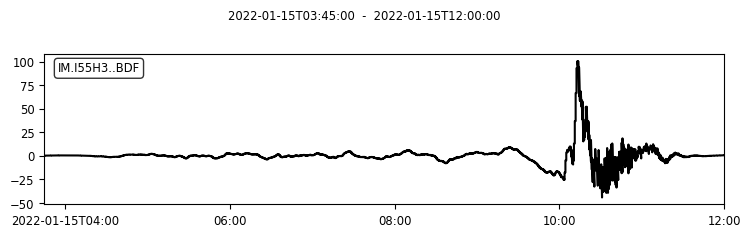

max amp =  100.484584716
distance =  6423034.35762
keep this trace? (y) (y/n): y


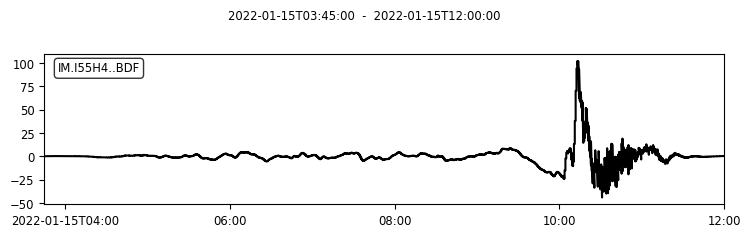

max amp =  102.205275397
distance =  6422454.85398
keep this trace? (y) (y/n): y


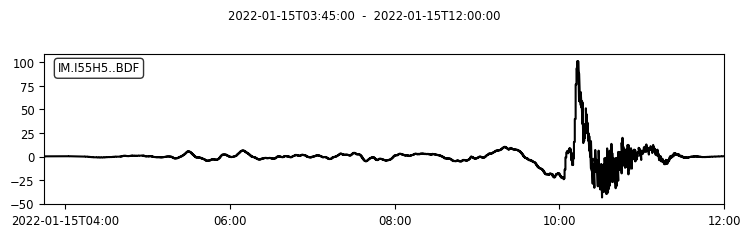

max amp =  101.3737249
distance =  6421195.81747
keep this trace? (y) (y/n): y


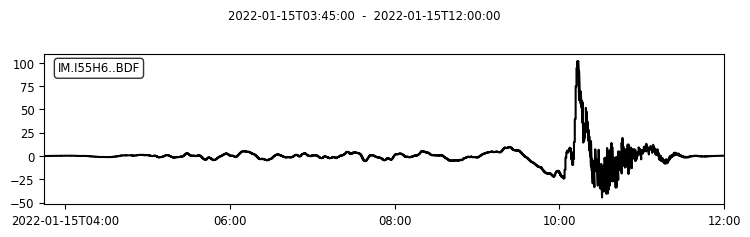

max amp =  101.865572862
distance =  6421638.49221
keep this trace? (y) (y/n): y


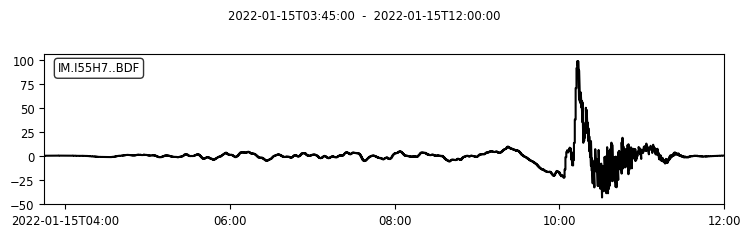

max amp =  99.0146799211
distance =  6422020.11083
keep this trace? (y) (y/n): y


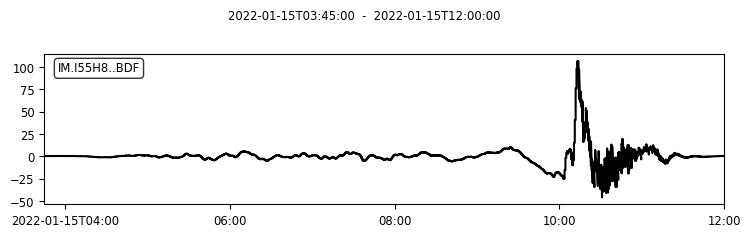

max amp =  106.727729457
distance =  6421941.39462
keep this trace? (y) (y/n): y


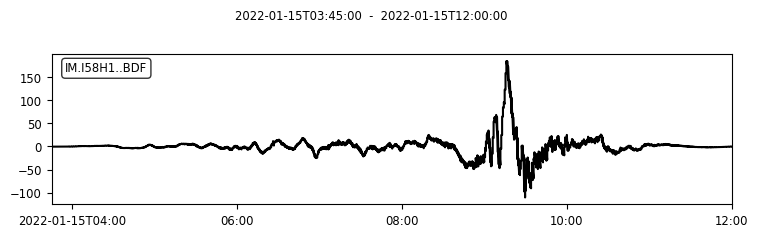

max amp =  185.107176553
distance =  5428318.96417
keep this trace? (y) (y/n): y


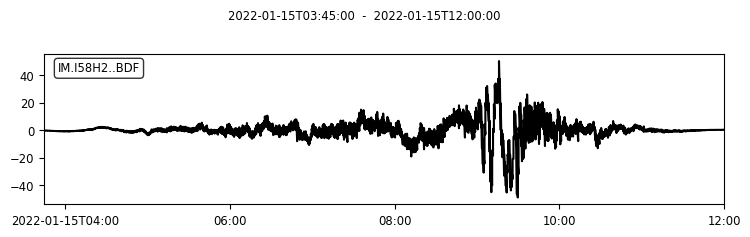

max amp =  50.1650042121
distance =  5428662.39943
keep this trace? (y) (y/n): y


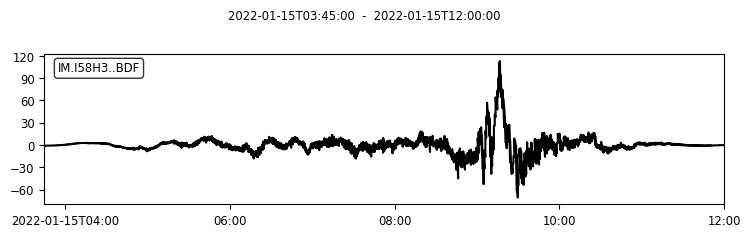

max amp =  112.872924718
distance =  5428689.50914
keep this trace? (n) (y/n): y


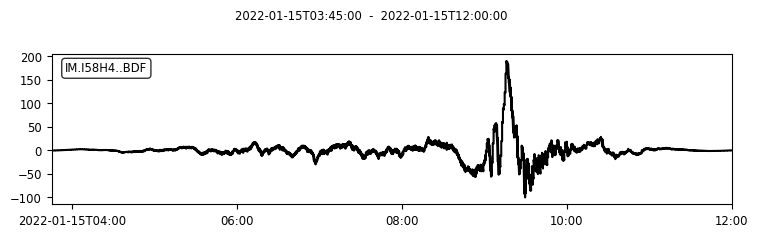

max amp =  189.656318323
distance =  5427570.46176
keep this trace? (y) (y/n): y


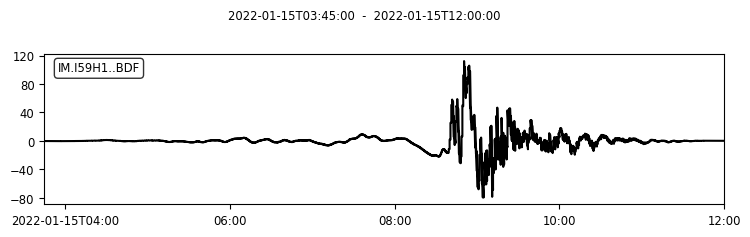

max amp =  112.23088161
distance =  4944027.71377
keep this trace? (y) (y/n): y


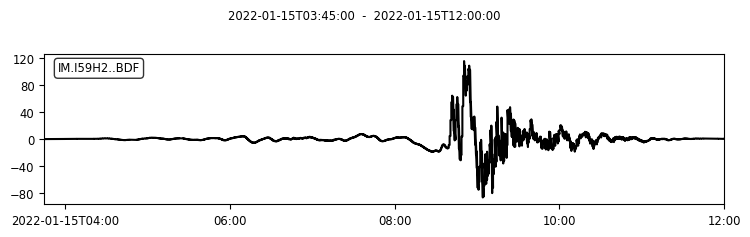

max amp =  115.129226905
distance =  4944888.21129
keep this trace? (y) (y/n): y


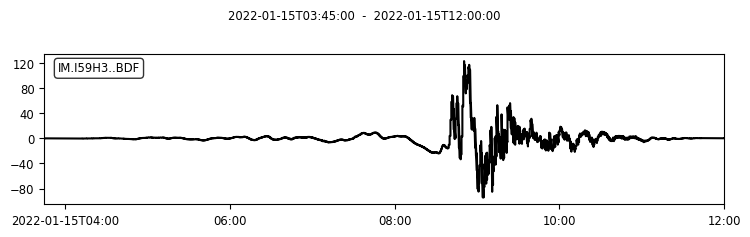

max amp =  123.040593078
distance =  4944534.38503
keep this trace? (y) (y/n): y


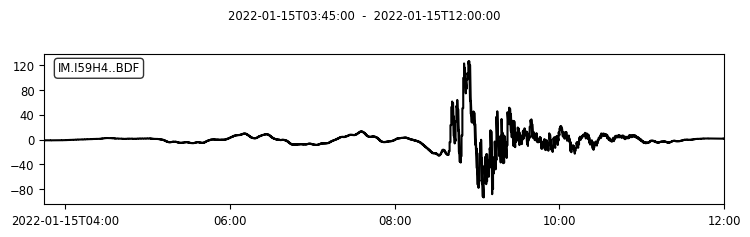

max amp =  126.563996214
distance =  4943188.04604
keep this trace? (y) (y/n): y


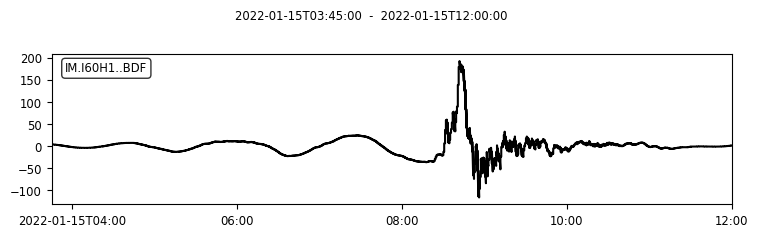

max amp =  191.887548232
distance =  4846901.86675
keep this trace? (y) (y/n): y


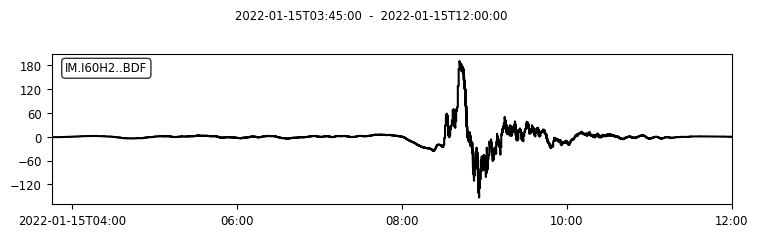

max amp =  190.953780083
distance =  4848539.06521
keep this trace? (y) (y/n): y


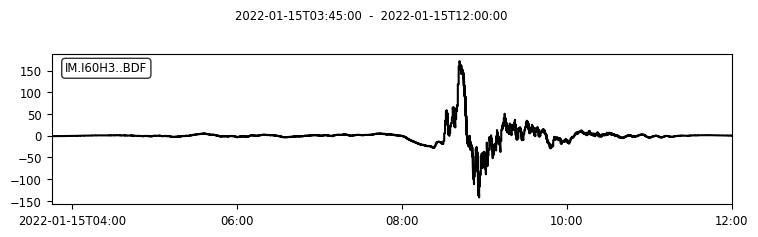

max amp =  171.945657597
distance =  4847349.08194
keep this trace? (y) (y/n): y


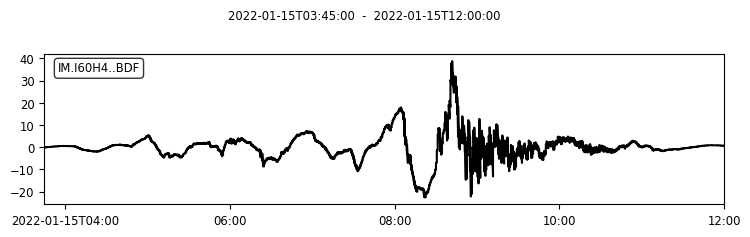

max amp =  38.7576525108
distance =  4846957.95473
keep this trace? (y) (y/n): y


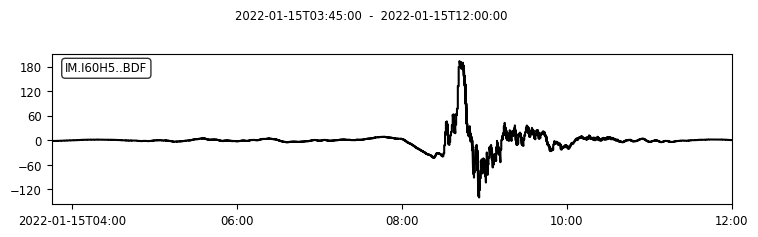

max amp =  193.482283097
distance =  4846617.20568
keep this trace? (n) (y/n): y


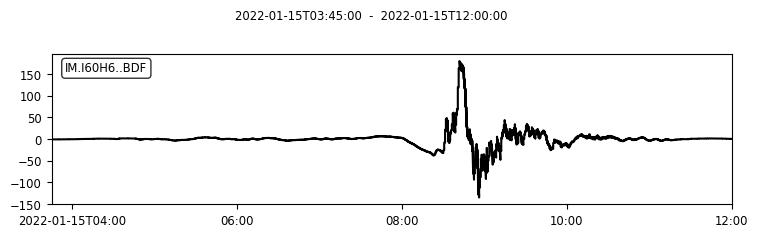

max amp =  179.230217884
distance =  4847967.0003
keep this trace? (y) (y/n): y


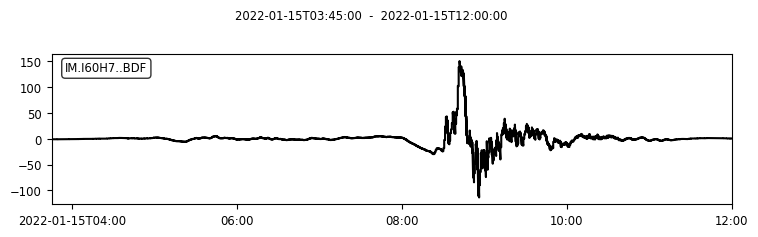

max amp =  150.429258822
distance =  4847612.13654
keep this trace? (y) (y/n): y


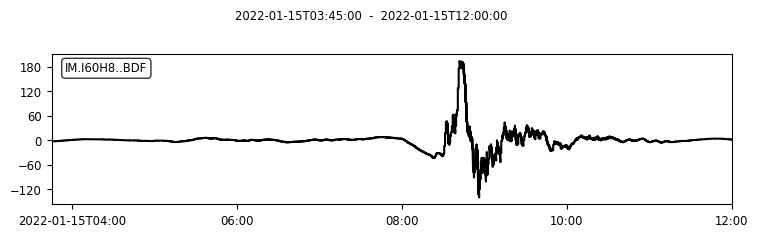

max amp =  193.591164226
distance =  4847724.14154
keep this trace? (y) (y/n): y


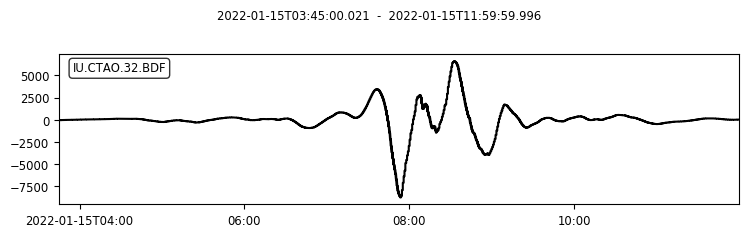

max amp =  8743.11827185
distance =  3991763.59934
keep this trace? (n) (y/n): y


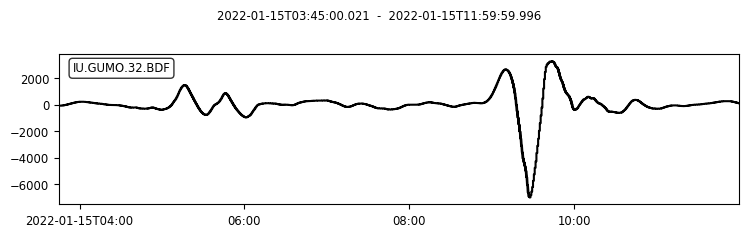

max amp =  6995.8400906
distance =  5770483.44723
keep this trace? (y) (y/n): y


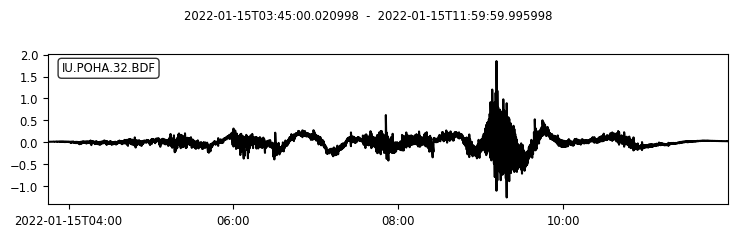

max amp =  1.85319242088
distance =  4977458.99052
keep this trace? (y) (y/n): n


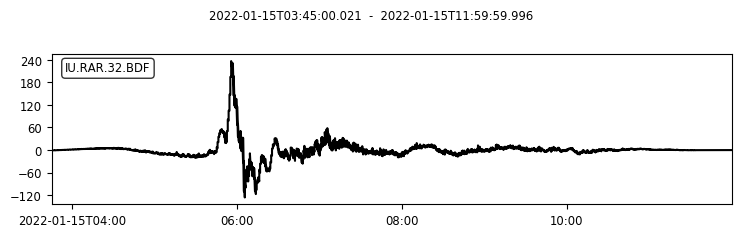

max amp =  236.552903813
distance =  1622220.03502
keep this trace? (y) (y/n): y


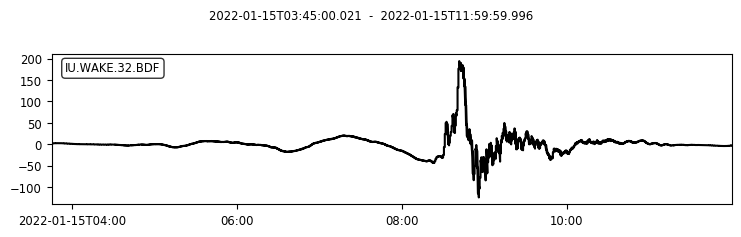

max amp =  194.071972837
distance =  4844264.29316
keep this trace? (y) (y/n): y
['AU.I07H1..BDF', 'AU.I07H2..BDF', 'AU.I07H3..BDF', 'AU.I07H5..BDF', 'AU.I07H6..BDF', 'AU.I07H7..BDF', 'AU.I07H8..BDF', 'HV.AHUD.01.BDF', 'HV.AHUD.02.BDF', 'HV.AHUD.04.BDF', 'IM.I55H1..BDF', 'IM.I55H2..BDF', 'IM.I55H3..BDF', 'IM.I55H4..BDF', 'IM.I55H5..BDF', 'IM.I55H6..BDF', 'IM.I55H7..BDF', 'IM.I55H8..BDF', 'IM.I58H1..BDF', 'IM.I58H2..BDF', 'IM.I58H3..BDF', 'IM.I58H4..BDF', 'IM.I59H1..BDF', 'IM.I59H2..BDF', 'IM.I59H3..BDF', 'IM.I59H4..BDF', 'IM.I60H1..BDF', 'IM.I60H2..BDF', 'IM.I60H3..BDF', 'IM.I60H4..BDF', 'IM.I60H5..BDF', 'IM.I60H6..BDF', 'IM.I60H7..BDF', 'IM.I60H8..BDF', 'IU.CTAO.32.BDF', 'IU.GUMO.32.BDF', 'IU.RAR.32.BDF', 'IU.WAKE.32.BDF']
38
Failed to subset inventory. Returning unchanged


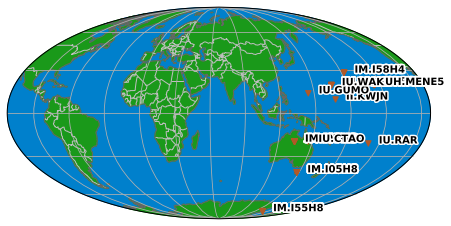

In [158]:
fdsnURL = "http://service.iris.edu"
chanstring = 'BDF'
st_bdf, inv_bdf, raw_st_bdf, raw_inv_bdf = analyze_clientchan(fdsnURL, chanstring, fmin=fmin, searchRadiusDeg=searchRadiusDeg)

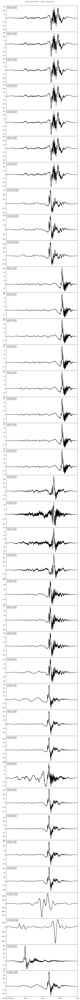

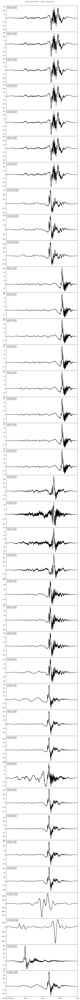

In [159]:
st_bdf.plot(equal_scale=False);

Trimming
[[314, UTCDateTime(2022, 1, 15, 4, 14, 45)]]
[314, UTCDateTime(2022, 1, 15, 4, 14, 45)]


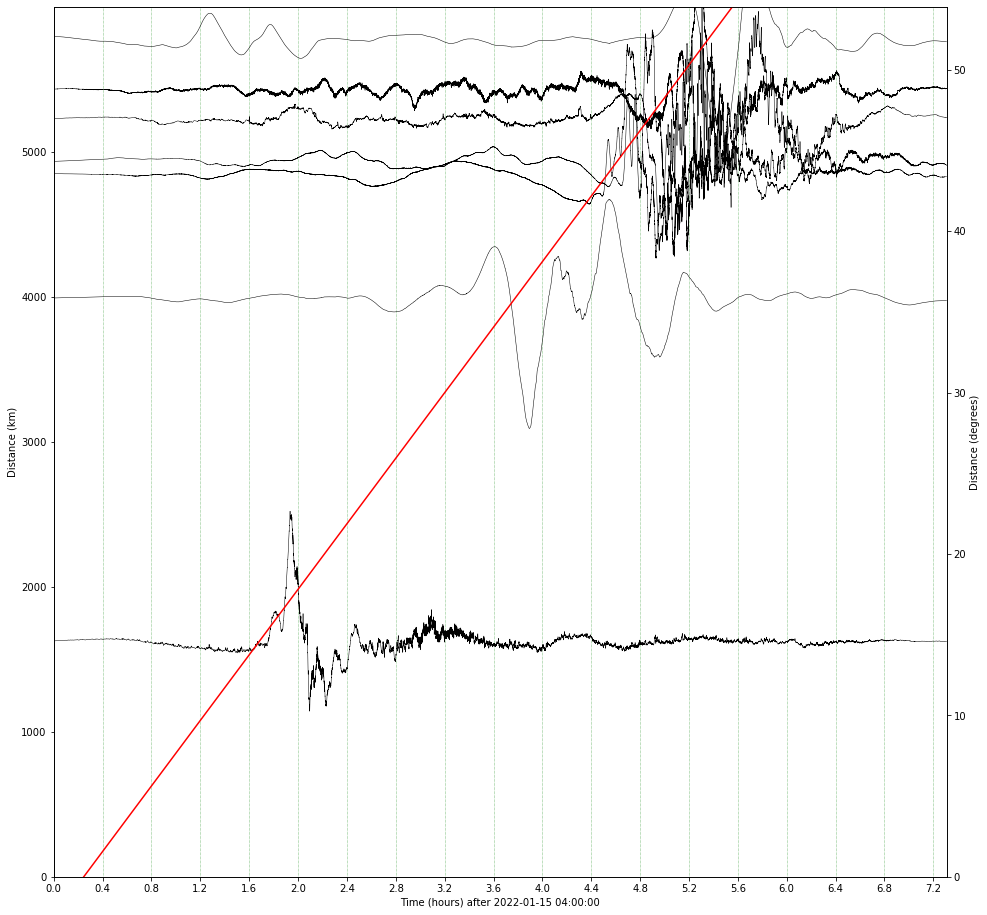

In [203]:
reftime = obspy.UTCDateTime(2022,1,15,4,0,0)
clamb = 314
stime = reftime
etime = stime + 7200 + rmax/clamb
plot_record_section(st_bdf, reftime, outfile=None, starttime=stime, endtime=etime, \
                        km_min=0, km_max=rmax/1000, slopes = [[clamb, obspy.UTCDateTime(2022,1,15,4,14,45)]], \
                        scale_factor=900.0, plot_arrivals=False, \
                        figsize=(16,16), min_spacing_km=0, normalize=True)#, reduced_speed=clamb )

Trimming
[[314, UTCDateTime(2022, 1, 15, 4, 14, 45)]]
[314, UTCDateTime(2022, 1, 15, 4, 14, 45)]


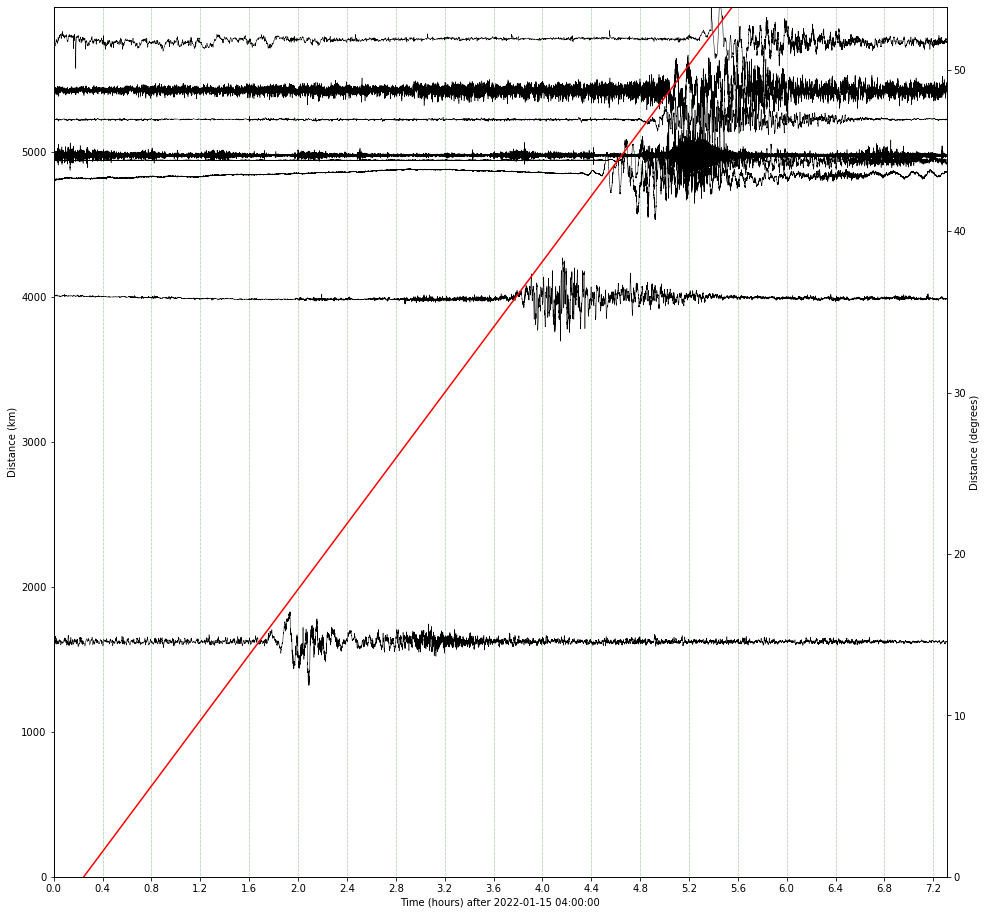

In [205]:
reftime = obspy.UTCDateTime(2022,1,15,4,0,0)
clamb = 314
stime = reftime
etime = stime + 7200 + rmax/clamb
plot_record_section(raw_st_bdf, reftime, outfile=None, starttime=stime, endtime=etime, \
                        km_min=0, km_max=rmax/1000, slopes = [[clamb, obspy.UTCDateTime(2022,1,15,4,14,45)]], \
                        scale_factor=300.0, plot_arrivals=False, \
                        figsize=(16,16), min_spacing_km=0, normalize=True)#, reduced_speed=clamb )

Trimming
[[314, UTCDateTime(2022, 1, 15, 4, 14, 45)]]
[314, UTCDateTime(2022, 1, 15, 4, 14, 45)]


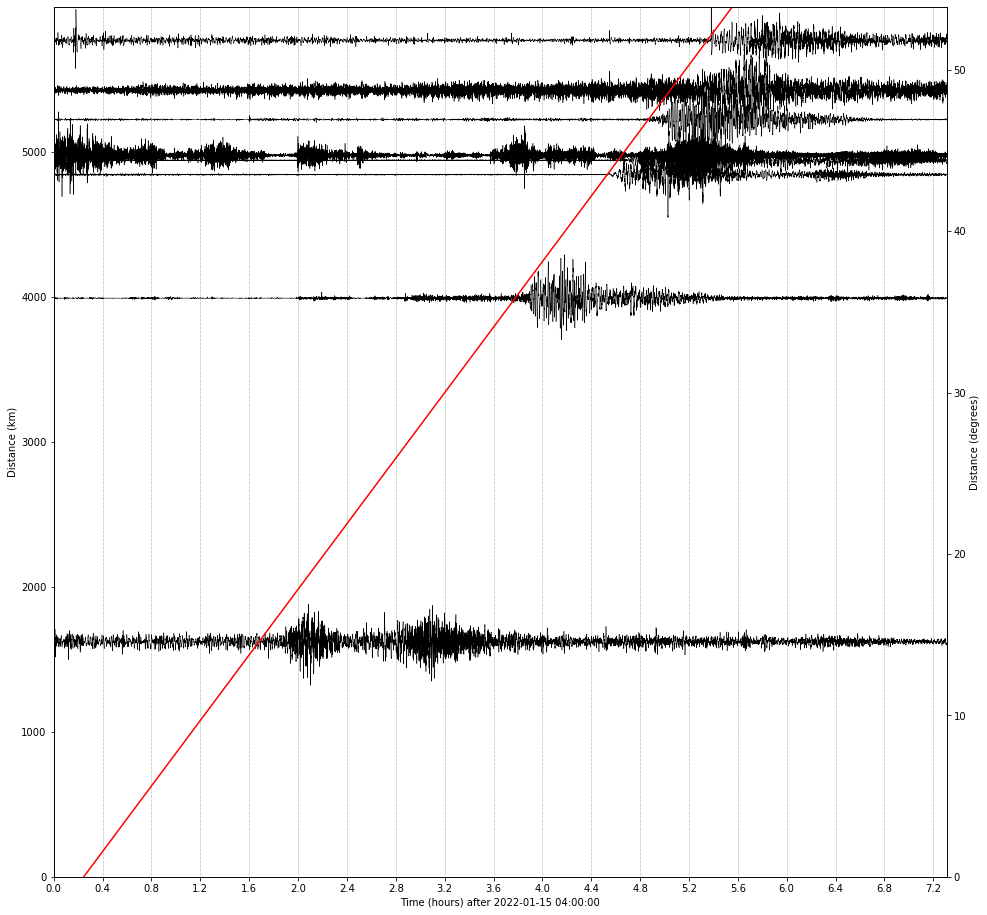

In [208]:
st4 = raw_st_bdf.copy()
st4.filter('bandpass', freqmin=0.01, freqmax=1.0, corners=4)
plot_record_section(st4, reftime, outfile=None, starttime=stime, endtime=etime, \
                        km_min=0, km_max=rmax/1000, slopes = [[clamb, obspy.UTCDateTime(2022,1,15,4,14,45)]], \
                        scale_factor=300.0, plot_arrivals=False, \
                        figsize=(16,16), min_spacing_km=0, normalize=True)#, reduced_speed=clamb )

/home/thompsong/DATA/Tonga_eruption_analysis/iris_?HZ_within_20_degrees.xml /home/thompsong/DATA/Tonga_eruption_analysis/iris_?HZ_within_20_degrees.mseed
Trying to load inventory from 2022/01/15 03:00 to 2022/01/15 05:00
inventory saved to /home/thompsong/DATA/Tonga_eruption_analysis/iris_?HZ_within_20_degrees.xml
waveform downloaded for  AU.NFK.BHZ
failed to download waveform for  AU.NFK.HHZ
failed to download waveform for  AU.NIUE.BHZ
waveform downloaded for  G.DZM.BHZ
More than 1 Trace
waveform downloaded for  G.FUTU.BHZ
waveform downloaded for  G.FUTU.LHZ
waveform downloaded for  G.NOUC.BHZ
waveform downloaded for  G.NOUC.LHZ
waveform downloaded for  G.SANVU.BHZ
waveform downloaded for  G.SANVU.HHZ
waveform downloaded for  G.SANVU.LHZ
waveform downloaded for  II.MSVF.BHZ
More than 1 Trace
waveform downloaded for  II.MSVF.LHZ
More than 1 Trace
waveform downloaded for  II.MSVF.VHZ
More than 1 Trace
waveform downloaded for  II.MSVF.BHZ
More than 1 Trace
waveform downloaded for  II.MSV

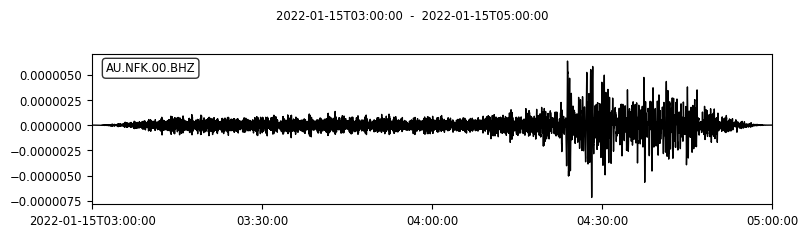

max amp =  7.17421600382e-06
distance =  1926273.08499
keep this trace? (y) (y/n): y


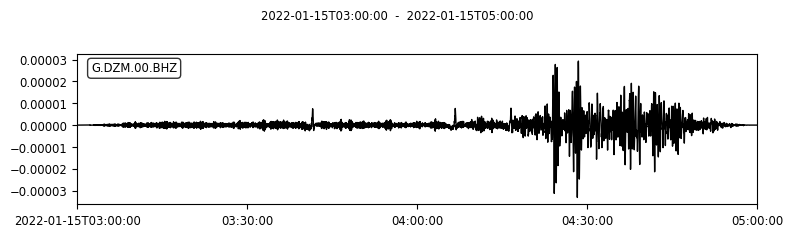

max amp =  3.31559486715e-05
distance =  1889041.07108
keep this trace? (n) (y/n): y


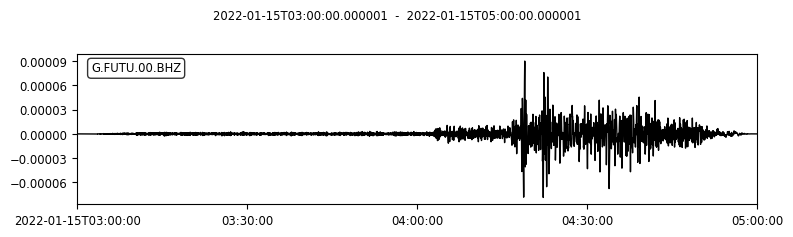

max amp =  9.02346329717e-05
distance =  754541.407546
keep this trace? (n) (y/n): y


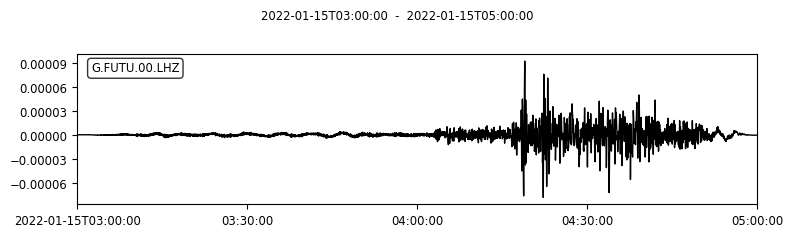

max amp =  9.21736192816e-05
distance =  754541.407546
keep this trace? (y) (y/n): y


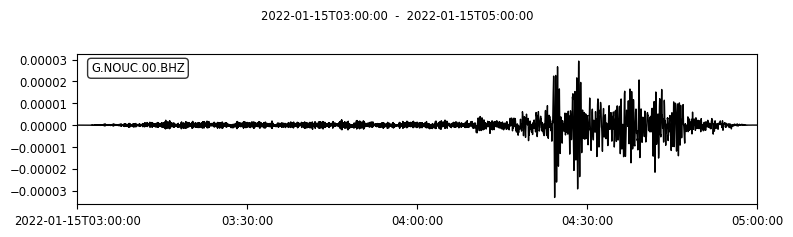

max amp =  3.31811768129e-05
distance =  1903252.59397
keep this trace? (y) (y/n): y


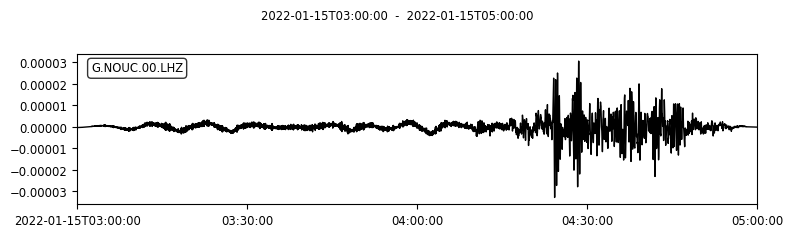

max amp =  3.27975513363e-05
distance =  1903252.59397
keep this trace? (y) (y/n): y


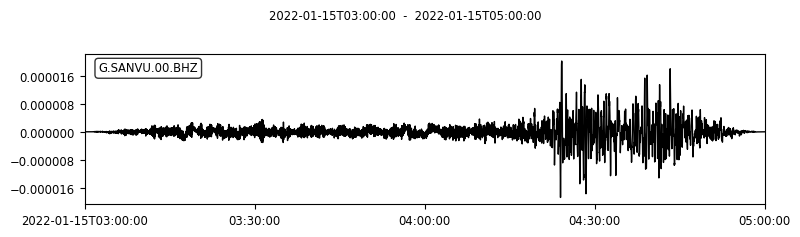

max amp =  2.01889912962e-05
distance =  1926431.44713
keep this trace? (y) (y/n): y


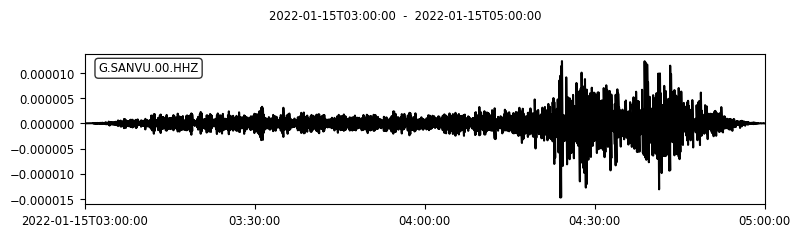

max amp =  1.47125219808e-05
distance =  1926431.44713
keep this trace? (y) (y/n): y


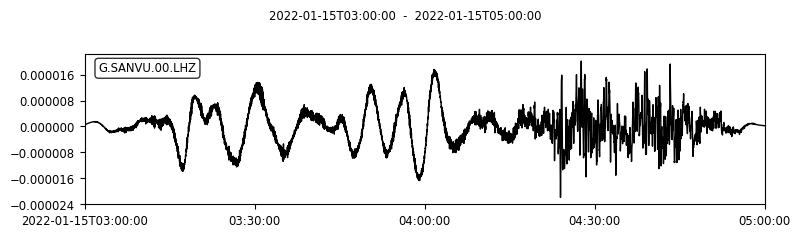

max amp =  2.19657475366e-05
distance =  1926431.44713
keep this trace? (y) (y/n): y


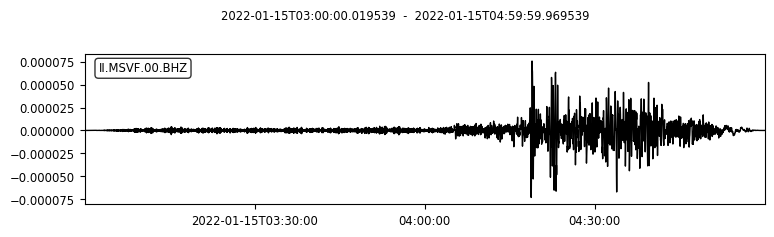

max amp =  7.56390501992e-05
distance =  757841.812715
keep this trace? (n) (y/n): y


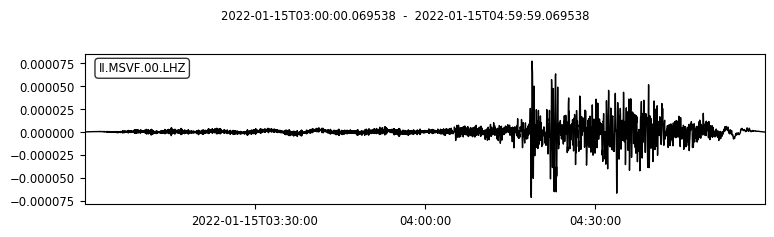

max amp =  7.69853342785e-05
distance =  757841.812715
keep this trace? (y) (y/n): y


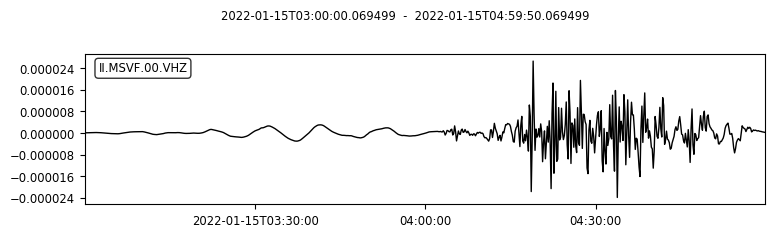

max amp =  2.66230805797e-05
distance =  757841.812715
keep this trace? (y) (y/n): y


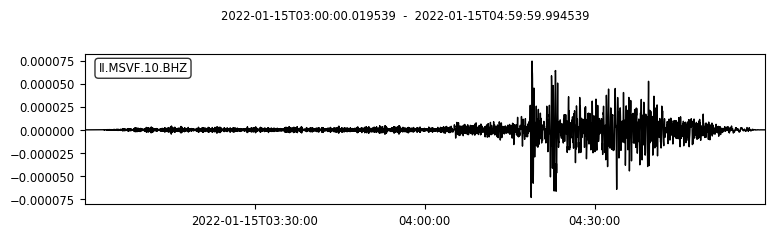

max amp =  7.44599913737e-05
distance =  757841.812715
keep this trace? (n) (y/n): y


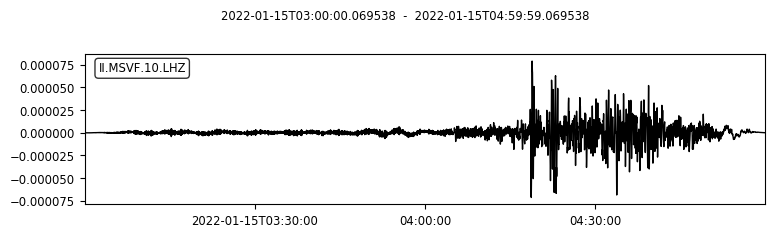

max amp =  7.87746492052e-05
distance =  757841.812715
keep this trace? (y) (y/n): y


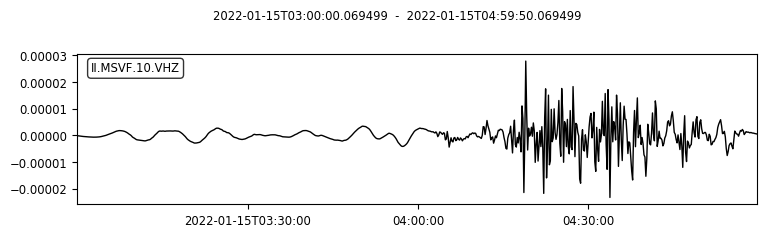

max amp =  2.78270235668e-05
distance =  757841.812715
keep this trace? (y) (y/n): y


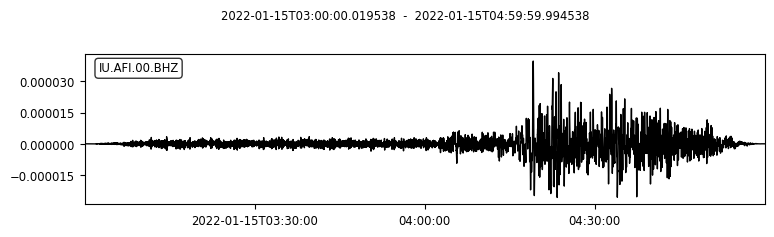

max amp =  3.96505076775e-05
distance =  833309.97213
keep this trace? (y) (y/n): y


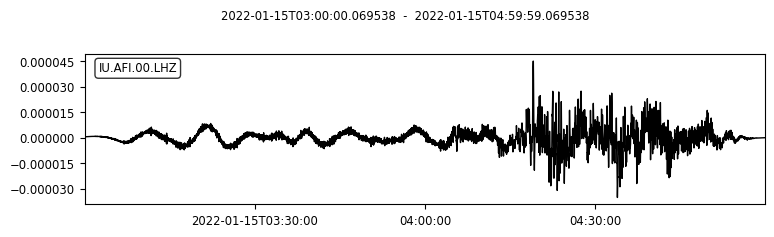

max amp =  4.5060436077e-05
distance =  833309.97213
keep this trace? (y) (y/n): y


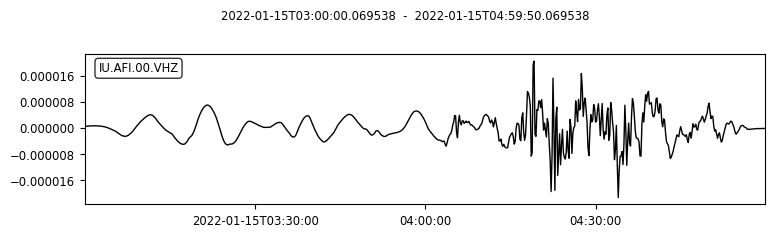

max amp =  2.13883187641e-05
distance =  833309.97213
keep this trace? (y) (y/n): y


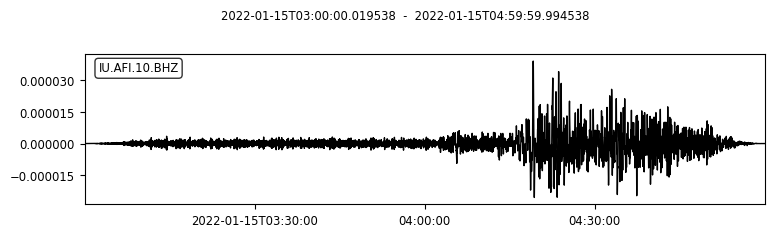

max amp =  3.91393640345e-05
distance =  833309.97213
keep this trace? (y) (y/n): y


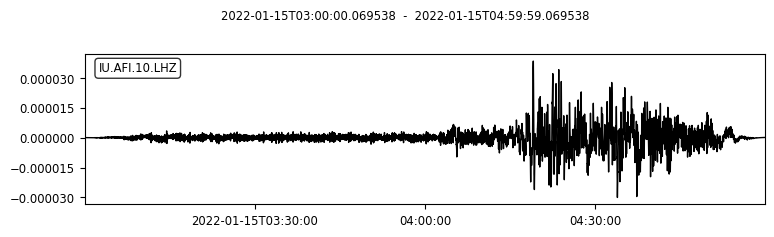

max amp =  3.83892908017e-05
distance =  833309.97213
keep this trace? (y) (y/n): y


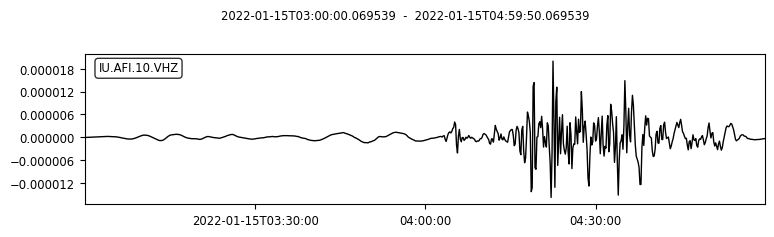

max amp =  2.00483936607e-05
distance =  833309.97213
keep this trace? (y) (y/n): y


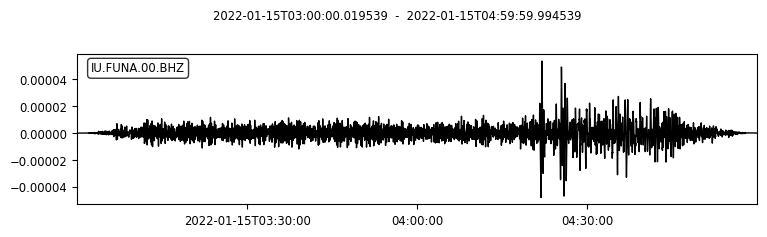

max amp =  5.36137603804e-05
distance =  1460401.70944
keep this trace? (n) (y/n): y


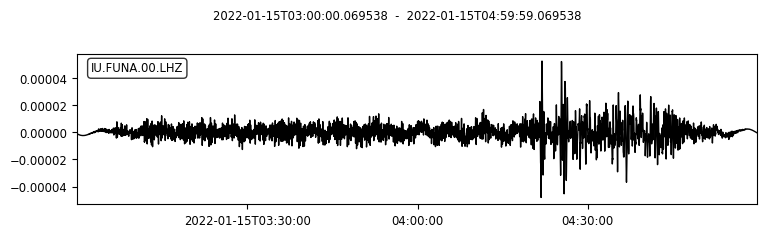

max amp =  5.22884686306e-05
distance =  1460401.70944
keep this trace? (y) (y/n): y


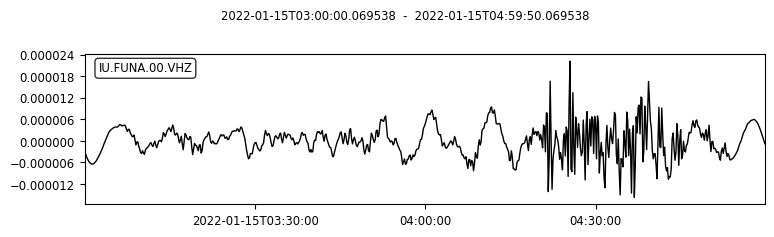

max amp =  2.22104681992e-05
distance =  1460401.70944
keep this trace? (y) (y/n): y


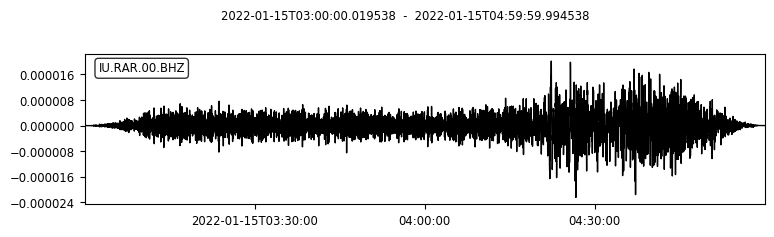

max amp =  2.25150828727e-05
distance =  1622220.03502
keep this trace? (y) (y/n): y


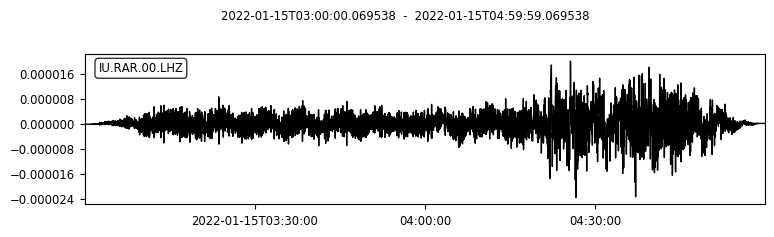

max amp =  2.35951068505e-05
distance =  1622220.03502
keep this trace? (y) (y/n): y


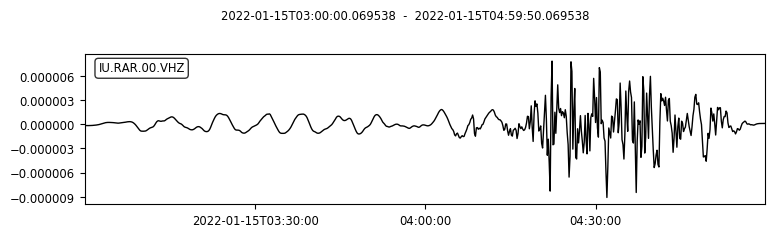

max amp =  9.07763862567e-06
distance =  1622220.03502
keep this trace? (y) (y/n): y


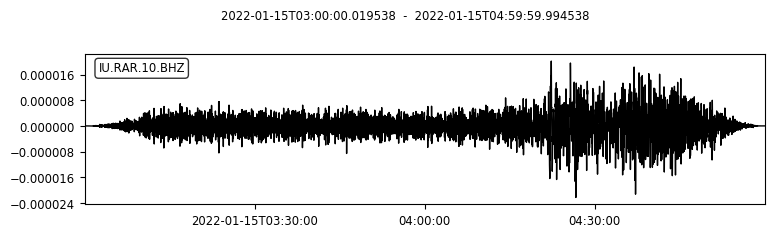

max amp =  2.23136099438e-05
distance =  1622220.03502
keep this trace? (n) (y/n): y


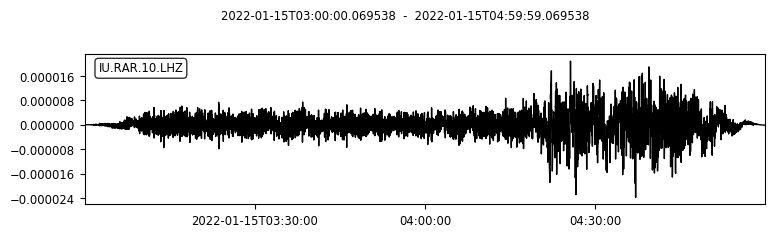

max amp =  2.37768291111e-05
distance =  1622220.03502
keep this trace? (y) (y/n): y


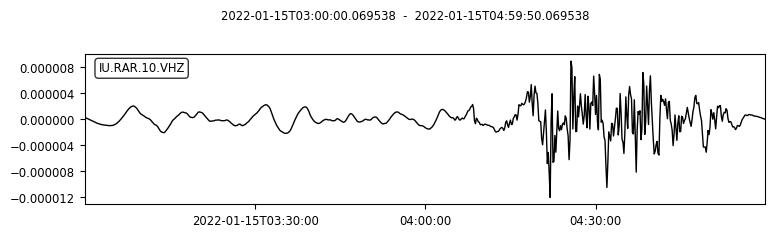

max amp =  1.20131377712e-05
distance =  1622220.03502
keep this trace? (y) (y/n): y


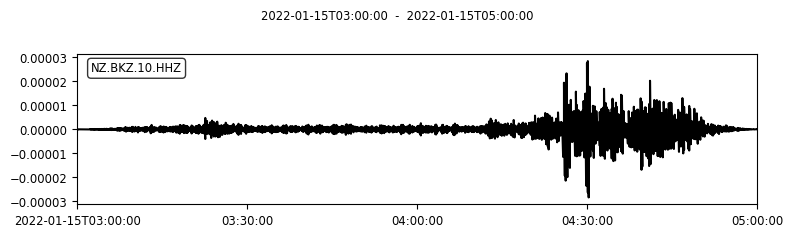

max amp =  2.83615397164e-05
distance =  2208778.05573
keep this trace? (n) (y/n): y


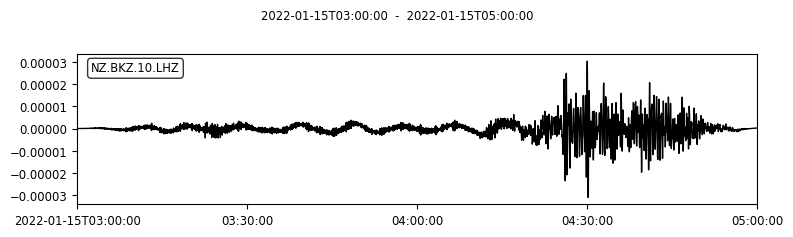

max amp =  3.09798637064e-05
distance =  2208778.05573
keep this trace? (y) (y/n): y


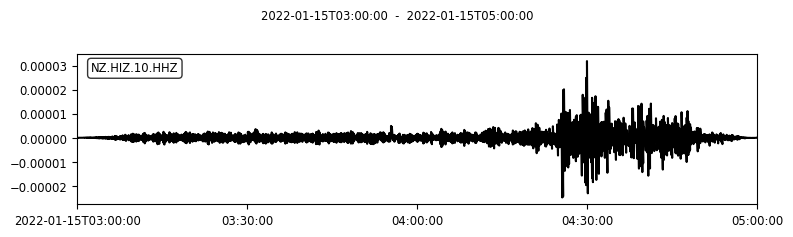

max amp =  3.1854483232e-05
distance =  2204271.00614
keep this trace? (y) (y/n): y


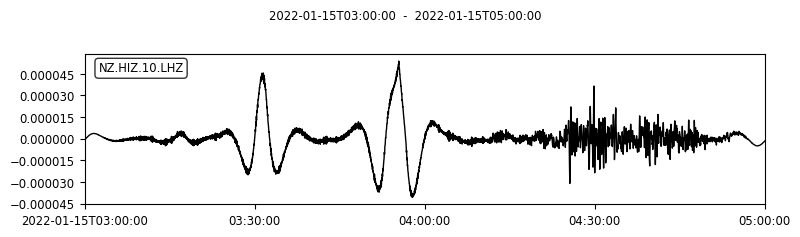

max amp =  5.3836333349e-05
distance =  2204271.00614
keep this trace? (y) (y/n): y


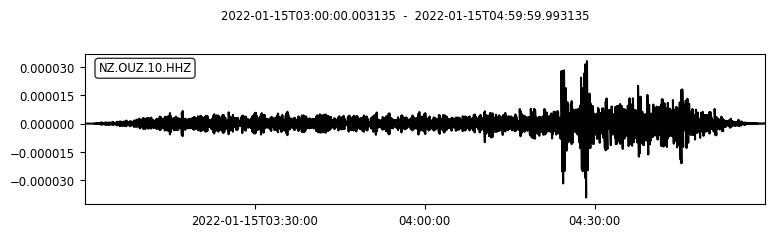

max amp =  3.90808738623e-05
distance =  1953280.35765
keep this trace? (y) (y/n): y


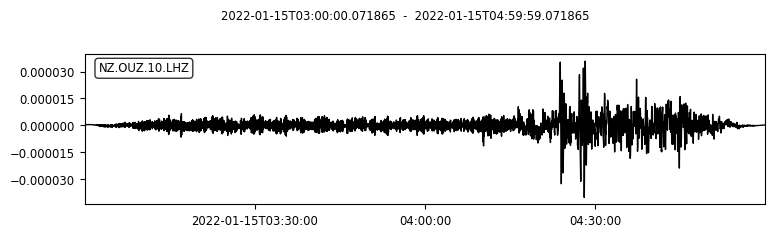

max amp =  4.02580102488e-05
distance =  1953280.35765
keep this trace? (y) (y/n): y


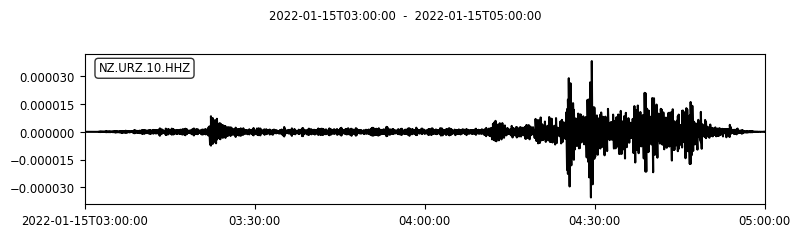

max amp =  3.82992256851e-05
distance =  2095112.45236
keep this trace? (y) (y/n): y


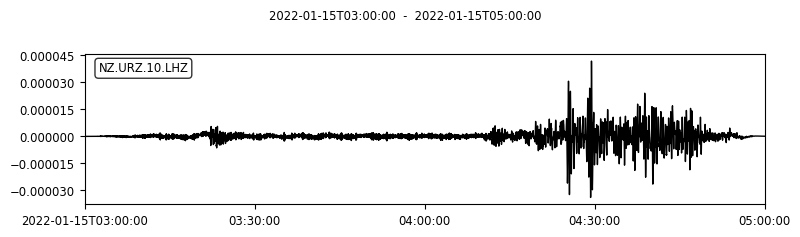

max amp =  4.1883849443e-05
distance =  2095112.45236
keep this trace? (y) (y/n): y
['AU.NFK.00.BHZ', 'G.DZM.00.BHZ', 'G.FUTU.00.BHZ', 'G.FUTU.00.LHZ', 'G.NOUC.00.BHZ', 'G.NOUC.00.LHZ', 'G.SANVU.00.BHZ', 'G.SANVU.00.HHZ', 'G.SANVU.00.LHZ', 'II.MSVF.00.BHZ', 'II.MSVF.00.LHZ', 'II.MSVF.00.VHZ', 'II.MSVF.10.BHZ', 'II.MSVF.10.LHZ', 'II.MSVF.10.VHZ', 'IU.AFI.00.BHZ', 'IU.AFI.00.LHZ', 'IU.AFI.00.VHZ', 'IU.AFI.10.BHZ', 'IU.AFI.10.LHZ', 'IU.AFI.10.VHZ', 'IU.FUNA.00.BHZ', 'IU.FUNA.00.LHZ', 'IU.FUNA.00.VHZ', 'IU.RAR.00.BHZ', 'IU.RAR.00.LHZ', 'IU.RAR.00.VHZ', 'IU.RAR.10.BHZ', 'IU.RAR.10.LHZ', 'IU.RAR.10.VHZ', 'NZ.BKZ.10.HHZ', 'NZ.BKZ.10.LHZ', 'NZ.HIZ.10.HHZ', 'NZ.HIZ.10.LHZ', 'NZ.OUZ.10.HHZ', 'NZ.OUZ.10.LHZ', 'NZ.URZ.10.HHZ', 'NZ.URZ.10.LHZ']
38
Failed to subset inventory. Returning unchanged


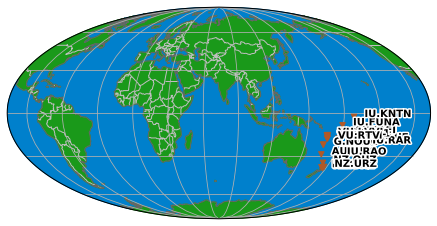

In [217]:
# Parameters for high frequency data
DATA_ROOT = os.path.join(os.getenv('HOME'), 'DATA', 'Tonga_eruption_analysis')
if not os.path.isdir(DATA_ROOT):
    os.makedirs(DATA_ROOT)
searchRadiusDeg = 60
fmin = 0.001
T = 1.0/fmin
circum_earth_km = 40075
circum_earth_m = circum_earth_km*1000
m_per_deg = circum_earth_m/360.0

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

startt =  obspy.core.UTCDateTime('2022-01-15T03:00:00.000000Z') 
endt = obspy.core.UTCDateTime('2022-01-15T05:00:00.000000Z') 
fdsnURL = "http://service.iris.edu"
chanstring = '?HZ'
searchRadiusDeg=20
st_bhz, inv_bhz, raw_st_bhz, raw_inv_bhz = analyze_clientchan(fdsnURL, chanstring, fmin=fmin, searchRadiusDeg=searchRadiusDeg)

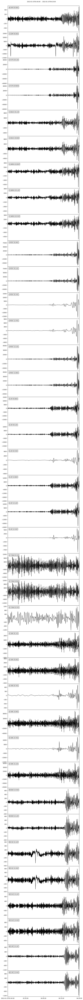

In [219]:
st5 = raw_st_bhz.copy()
st5 = smart_merge(st5)
st5.filter('bandpass',freqmin=0.001, freqmax=0.1, corners=4)
st5.plot(equal_scale=False, starttime=obspy.UTCDateTime(2022,1,15,3,40,0), endtime=obspy.UTCDateTime(2022,1,15,4,20,0));

Trimming


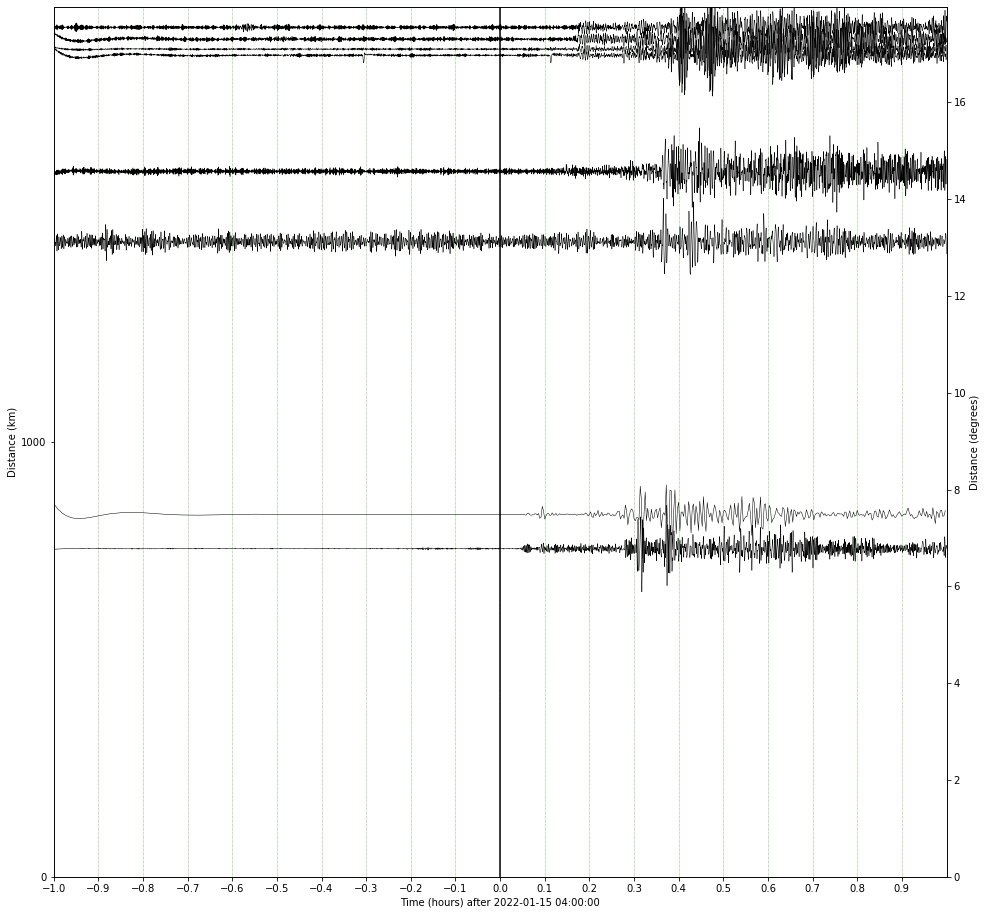

In [222]:
plot_record_section(st5, reftime, outfile=None, starttime=startt, endtime=endt, \
                        km_min=0, km_max=2000, slopes = [], \
                        scale_factor=100.0, plot_arrivals=False, \
                        figsize=(16,16), min_spacing_km=0, normalize=True)#, reduced_speed=clamb )

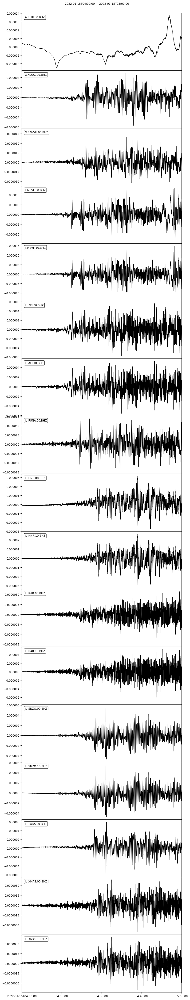

In [215]:
st6 = st_bhz.copy()
#st6.filter('bandpass',freqmin=0.001, freqmax=0.1, corners=4)
st6.plot(equal_scale=False, starttime=obspy.UTCDateTime(2022,1,15,4,0,0), endtime=obspy.UTCDateTime(2022,1,15,5,0,0));

In [216]:
for tr in st6:
    print(tr.id, tr.stats.distance)

AU.LHI.00.BHZ 2819027.11778
G.NOUC.00.BHZ 1903252.59397
G.SANVU.00.BHZ 1926431.44713
II.MSVF.00.BHZ 757841.812715
II.MSVF.10.BHZ 757841.812715
IU.AFI.00.BHZ 833309.97213
IU.AFI.10.BHZ 833309.97213
IU.FUNA.00.BHZ 1460401.70944
IU.HNR.00.BHZ 2918855.55136
IU.HNR.10.BHZ 2918855.55136
IU.RAR.00.BHZ 1622220.03502
IU.RAR.10.BHZ 1622220.03502
IU.SNZO.00.BHZ 2488195.87876
IU.SNZO.10.BHZ 2488195.87876
IU.TARA.00.BHZ 2750652.30867
IU.XMAS.00.BHZ 3184629.90894
IU.XMAS.10.BHZ 3184629.90894


### 3.1.2 Reconstituted "good" traces

In [275]:
pklfile = os.path.join(DATA_ROOT, 'st_ldo_downsample_pick.pkl')
if os.path.isfile(pklfile): # read data from pickle file and leap to 3.1.3
    with open(pklfile, 'rb') as f:
        st_ldo_downsample_pick = pickle.load(f)

In [276]:
#st_ldo_downsample_pick = process_1(st_ldo)

new_otime = obspy.UTCDateTime(2022,1,15,4,7,18)

for tr in st_ldo_downsample_pick:
    if tr.stats.network == 'PB':
        st_ldo_downsample_pick.remove(tr)

In [371]:
tr.stats

         network: IU
         station: PAB
        location: 30
         channel: LDO
       starttime: 2022-01-12T18:26:40.666680Z
         endtime: 2022-01-20T05:33:10.666680Z
   sampling_rate: 0.1
           delta: 10.0
            npts: 64480
           calib: 1.0
           PRmax: 13543.00003
            Pmax: [57.168961628409868, 100.82156843072164]
         _format: MSEED
     coordinates: AttribDict({'latitude': 39.5446, 'longitude': -4.3499, 'elevation': 950.0})
        distance: 17738526.4701
maxamp_corrected: 101.684816499
      maxamp_raw: 3745.1763824
           mseed: AttribDict({'dataquality': 'M', 'number_of_records': 973, 'encoding': 'STEIM2', 'byteorder': '>', 'record_length': 512, 'filesize': 616439808})
      processing: ["ObsPy 0.0.0+archive: detrend(options={}::type='linear')", "ObsPy 0.0.0+archive: taper(max_length=None::max_percentage=0.015508708915491495::side='both'::type='hann')", "ObsPy 0.0.0+archive: filter(options={'freq': 0.0001, 'corners': 2}::type='high

[1, 1.01, 1.0201] [157164.80076633673, 171247.19648849664, 169628.90535007953]
[1, 1.01, 1.0201] [11654.887108982452, 23136.538380708731, 22964.732049638042]
[ 2.87957856  4.59457937  2.92080658  4.59374496  2.92080658] [ 2.89241823  2.16367077  2.7363082   2.16385217  2.7379636 ]
-0.371664953366 3.87011048326
156


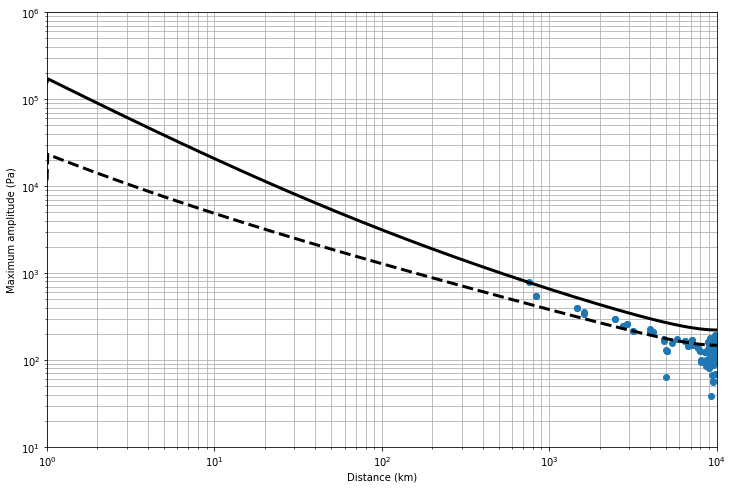

In [404]:
plot_amplitude_versus_distance(st_ldo_downsample_pick, 'Pa', reftime=otime, \
                               cmin=300, cmax=420, duration=7200)
#plot_reduced_pressure(st, 'Pa')   
#plot_inv(inv)
#plots(st_ldo_downsample_pick, inv_ldo, olat, olon, otime, cmin=300, cmax=420)
print(len(st_ldo_downsample_pick))

### 3.1.3 Make record section of the N wave

In [ ]:
signal_duration = 3600.0 * 3.0
#wavespeed, new_otime, t, d = regress_arrival_times(st2, otime, outfile='Nwave_arrivalfit.eps')
wavespeed = 312.7
new_otime = obspy.UTCDateTime(2022,1,15,4,7,18)
etime = new_otime + (circum_earth_m/2)/wavespeed + signal_duration
#plot_record_section(st_ldo_downsample_pick, new_otime, starttime=new_otime, endtime=etime, \
#                    outfile='Nwave_recordsection.eps', slope_speed=wavespeed, figsize=(8,16), scale_factor=5)

In [ ]:
#plot_record_section(st_ldo_downsample_pick, new_otime, starttime=new_otime, endtime=etime, \
#                    outfile='Nwave_recordsection2.eps', slope_speed=wavespeed, figsize=(6,12), scale_factor=3)
reftime = obspy.UTCDateTime(2022,1,15,3,0,0)
stime = reftime
etime = obspy.UTCDateTime(2022,1,16,16,0,0)
celerity = 315.0
wraptime = circum_earth_m/celerity
plot_record_section(st_ldo_downsample_pick, reftime, starttime=stime, endtime=etime, \
                    outfile='Nwave_recordsection5.eps', slopes=[[celerity, otime], [-celerity, otime+wraptime]], figsize=(6,12), scale_factor=3, min_spacing_km=800)

In [ ]:
stime = obspy.UTCDateTime(2022,1,15,4,0,0)
etime = obspy.UTCDateTime(2022,1,15,6,0,0)
reftime = stime
plot_record_section(st_ldo_downsample_pick, reftime, starttime=stime, endtime=etime, \
    outfile='Nwave_recordsection3.eps', figsize=(12,12), scale_factor=1000, normalize=True, reduced_speed=315, min_spacing_km=1000)

### 3.1.4 make record section of multiple passes of N wave

In [ ]:
etime2 = obspy.UTCDateTime(2022,1,20,0,0,0)
st5 = st_ldo_downsample_pick.copy().filter('bandpass', freqmin=0.01, freqmax=0.1, corners=2)
plot_record_section(st5, new_otime, starttime=new_otime, endtime=etime2, \
    outfile='Nwave_recordsection4.eps', figsize=(16,16), scale_factor=10)

In [ ]:
stime2 = obspy.UTCDateTime(2022,1,15,0,0,0)
etime2 = obspy.UTCDateTime(2022,1,20,0,0,0)
st_ldo_lowpass = st_ldo_downsample_pick.copy().filter('bandpass', freqmin=0.0002, freqmax=0.01, corners=6)
wavespeed=310.0
wraptime = circum_earth_m/wavespeed 
plot_record_section(st_ldo_lowpass, stime2, starttime=stime2, endtime=etime2, \
    outfile='Nwave_recordsection_long_master.eps', \
                    slopes=[[wavespeed, new_otime],\
                            [-wavespeed, new_otime+wraptime], \
                            [wavespeed, new_otime+wraptime], \
                            [-wavespeed, new_otime+wraptime*2], \
                            [wavespeed, new_otime+wraptime*2], \
                            [-wavespeed, new_otime+wraptime*3], \
                            [wavespeed, new_otime+wraptime*3], \
                           ], \
                    figsize=(12,12), scale_factor=10, min_spacing_km = 500)

### 3.1.5 Save reconstituted, downsampled, picked barometric data to pickle file

In [ ]:
pklfile = os.path.join(DATA_ROOT, 'st_ldo_downsample_pick.pkl')
with open(pklfile, 'wb') as f:
    pickle.dump(st_ldo_downsample_pick, f)    

## 3.2 Explore the near stations only to improve origin time estimates

### 3.2.1 Read raw barometric data and order traces by distance

In [ ]:
pklfile = os.path.join(DATA_ROOT, 'st_ldo_raw.pkl')
if os.path.isfile(pklfile):
    with open(pklfile, 'rb') as f:
        st_ldo_raw_sorted = pickle.load(f)
else:
    #st_ldo_raw = obspy.core.read(os.path.join(DATA_ROOT, 'iris_LDO_within_180_degrees.mseed'))
    #inv_ldo_raw = obspy.read_inventory(os.path.join(DATA_ROOT, 'iris_LDO_within_180_degrees.xml'))
    #attach_station_coordinates_from_inventory(inv_ldo_raw, st_ldo_raw)
    #attach_distance_to_stream(st_ldo_raw, olat, olon)
    #r = get_distance_vector(st_ldo_raw)
    #st_ldo_raw_sorted = order_traces_by_distance(st_ldo_raw, r) 

    with open(pklfile, 'wb') as f:
        pickle.dump(st_ldo_raw_sorted, f) 

In [ ]:
r = get_distance_vector(st_ldo_raw_sorted)
st_sorted = order_traces_by_distance(st_ldo_raw_sorted, r) 
st2 = remove_duplicates(stkeep_sorted)
st2.detrend('linear')
st3 = st2.copy().trim(starttime=obspy.UTCDateTime(2022,1,15,3,0,0), endtime=obspy.UTCDateTime(2022,1,15,7,0,0))
#stkeep = manually_select_good_traces(st, trim_mins=0, record_section=False, auto=False, wlen=7200, rmax=3200000)    

In [ ]:


#stkeep2.plot(equal_scale=False)
stime = obspy.UTCDateTime(2022,1,15,4,0,0)
stkeep2.normalize()
plot_record_section(stkeep2, stime, \
    outfile='Nwave_raw_close.eps', figsize=(16,16), scale_factor=500, km_max=3500)

In [ ]:
stkeep3 = stkeep2.copy().filter('highpass', freq=0.01, corners=2)

plot_record_section(stkeep3, stime, \
    outfile='Nwave_raw_close.eps', figsize=(16,16), scale_factor=500, km_max=3500)

In [ ]:
import matplotlib
matplotlib.use('TkAgg')
pick_pressure_onset(stkeep3, new_otime, 250, 400)

In [ ]:
regress_arrival_times(stkeep3, new_otime, outfile=None)

In [ ]:
plot_record_section(stkeep3, stime, \
    outfile='Nwave_raw_close.eps', figsize=(16,16), scale_factor=500, km_max=3500, slopes=[[295.7, obspy.UTCDateTime(2022,1,15,4,1,28)]])

In [ ]:
#stkeep2[1].plot(type='dayplot');
tr = st_ldo_raw_sorted[0].copy()
tr.trim(starttime=stime+1800, endtime=stime+7200)
tr.plot();

In [ ]:
757000/(42*60)

In [ ]:
# miscellaneous stuff

plots(st, inv_ldo, olat, olon, otime, minf=0, auto=True)

r = get_distance_vector(st_ldo)
st = order_traces_by_distance(st_ldo, r) 
# sort traces by distance
for tr in st:
    print(tr.id, tr.stats.distance)

plots(st, inv_ldo, olat, olon, otime, startt=otime-200000, endt=otime, auto=True, minf=0.001)



# 4. Run for seismic channels

In [ ]:
pklfile = os.path.join(DATA_ROOT, 'st_lhz_downsample_pick.pkl')
if os.path.isfile(pklfile):
    with open(pklfile, 'rb') as f:
        st_lhz_downsample_pick = pickle.load(f) 
    
else:

    fdsnURL = "http://service.iris.edu"
    chanstring = 'LHZ'
    st_lhz, inv_lhz, st_lhz_raw, inv_lhz_raw = analyze_clientchan(fdsnURL, chanstring, fmin=0.005, network='IU')

    st_lhz_downsample_pick = process_1(st_lhz)
    
    with open(pklfile, 'wb') as f:
        pickle.dump(st_lhz_downsample_pick, f)     

st_f = st_lhz_downsample_pick.copy().filter('bandpass', freqmin=0.001, freqmax=0.01, corners=2)
signal_duration = 3600.0 * 3.0
wavespeed = 312.7
new_otime = obspy.UTCDateTime(2022,1,15,4,7,18)
etime = new_otime + (circum_earth_m/2)/wavespeed + signal_duration
plot_record_section(st_f, new_otime, starttime=new_otime, endtime=etime, \
    outfile='seismicwave_recordsection.eps', figsize=(8,16), scale_factor=2e8, slope_speed=wavespeed)

etime = new_otime + 3 * 3600
plot_record_section(st_lhz_downsample_pick, new_otime, starttime=new_otime, endtime=etime, \
    outfile='seismicwave_recordsection_short.eps', figsize=(8,16), scale_factor=1e8)


  

In [ ]:
stime = obspy.UTCDateTime(2022,1,15,0,0,0)
etime = obspy.UTCDateTime(2022,1,17,0,0,0)
st_f2 = st_lhz_downsample_pick.copy().filter('bandpass', freqmin=0.005, freqmax=0.02, corners=2)
plot_record_section(st_f2, stime, starttime=stime, endtime=etime, \
    outfile='seismicwave_recordsection.eps', figsize=(6,12), scale_factor=6e8, min_spacing_km = 2000)

In [ ]:
st_lhz_raw = obspy.core.read(os.path.join(DATA_ROOT, 'iris_LHZ_within_180_degrees.mseed'))
inv_lhz_raw = obspy.read_inventory(os.path.join(DATA_ROOT, 'iris_LHZ_within_180_degrees.xml'))
attach_station_coordinates_from_inventory(inv_lhz_raw, st_lhz_raw)
attach_distance_to_stream(st_lhz_raw, olat, olon)
reftime = obspy.UTCDateTime(2022,1,15,4,0,0)
stime = reftime
etime = obspy.UTCDateTime(2022,1,15,6,0,0)
celerity = 300.0
wraptime = circum_earth_m/celerity

In [ ]:
st = st_lhz_raw.copy()
st.filter('bandpass', freqmin=0.005, freqmax=0.02)
st.trim(starttime=stime-3600,endtime=etime+3600)
st.normalize()

In [ ]:
st_f3=st_f2.copy().normalize()
plot_record_section(st_f3, reftime, starttime=stime, endtime=etime, \
    outfile='seismicwave_recordsection5.eps', slopes=[[celerity, otime], \
    [-celerity, otime+wraptime], [4000, otime]], figsize=(6,12), scale_factor=3000, min_spacing_km=500)

In [ ]:
st_f2 = st_lhz_downsample_pick.copy().filter('bandpass', freqmin=0.001, freqmax=0.02, corners=2)
st_f3 = st_f2.copy().trim(starttime=stime-3600, endtime=etime+3600)
st_f4 = st_f3.copy().normalize(global_max=False)


In [ ]:
reftime = obspy.UTCDateTime(2022,1,15,3,0,0)
stime = reftime
etime = obspy.UTCDateTime(2022,1,16,16,0,0)
celerity = 300.0
wraptime = circum_earth_m/celerity
plot_record_section(st_f4, reftime, starttime=stime, endtime=etime, \
    outfile='seismicwave_recordsection_1pass_master.eps', slopes=[[3600, otime, 'b-'],[315.0, otime, 'r-'], [celerity, otime, 'g-'], [-celerity, otime+wraptime, 'g-']], figsize=(6,12), scale_factor=1000, min_spacing_km=1000)

In [ ]:
r = get_distance_vector(st_lhz)
st_lhz_sorted = order_traces_by_distance(st_lhz, r) 
plots(st_lhz_sorted, inv_ldo, olat, olon, otime, startt=otime, endt=otime+12*3600, auto=True, minf=0.001, maxf=0.1)

r = get_distance_vector(st_ldo)
st_ldo_sorted = order_traces_by_distance(st_ldo, r) 
plots(st_ldo_sorted, inv_ldo, olat, olon, otime, startt=otime, endt=otime+12*3600, auto=True, minf=0.001, maxf=0.1)

r = get_distance_vector(st_ldo)
st_ldo_sorted = order_traces_by_distance(st_ldo, r) 
plots(st_ldo_sorted, inv_ldo, olat, olon, otime, startt=otime, endt=st_ldo[0].stats.endtime, auto=True, minf=0.00015, maxf=0.25)

# 4. Run for infrasound channels

In [ ]:
fdsnURL = "http://service.iris.edu"
chanstring = 'LDF'
st_ldf, inv_ldf, raw_st_ldf, raw_inv_ldf  = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)
plots(st_ldf, otime, otime+17*3600)

# 5. Run for Raspberry Booms

In [ ]:
fdsnURL = "http://fdsnws.raspberryshakedata.com"
chanstring = 'HDF'
st_boom, inv_boom, raw_st_boom, raw_inv_boom  = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

# 6. Combine results in single graph

In [ ]:
st_list = [st_ldf, st_ldo, st_boom]
inv_list = [inv_ldf, inv_ldo, inv_boom]
units = 'Pa'
plot_combined_versus_distance(st_list, inv_list, units, corrected=False)
plot_combined_versus_distance(st_list, inv_list, units, corrected=True)

In [ ]:
for st in st_list:
    print(len(st))

To do:
- downsample H?? and B?? channels to 1 sample per second
- apply data quality metrics to remove bad channels
- extra steps to remove spikes?
- detect events?
- examine as a function of low-cut frequency
- make maps with pygmt, e.g. with radius contours, or amplitude contours

In [ ]:
fmin=1/10000


fdsnURL = "http://service.iris.edu"
chanstring = 'LDO'
st_ldo2, inv_ldo2 = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

fdsnURL = "http://service.iris.edu"
chanstring = 'LDF'
st_ldf2, inv_ldf2 = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

fdsnURL = "http://fdsnws.raspberryshakedata.com"
chanstring = 'HDF'
st_boom2, inv_boom2 = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

In [ ]:
st_list = [st_ldf2, st_ldo2]
inv_list = [inv_ldf2, inv_ldo2]
units = 'Pa'
plot_combined_versus_distance(st_list, inv_list, units, corrected=False)
plot_combined_versus_distance(st_list, inv_list, units, corrected=True)

In [ ]:
# plot traces by distance - record section?
st = obspy.core.Stream()
for tr in st_ldo2:
    tr.stats['distance']=tr.stats.distance_in_km*1000.0
    tr.data=tr.data*10
    st.append(tr)
for tr in st_ldf2:
    tr.stats['distance']=tr.stats.distance_in_km*1000.0
    tr.data=tr.data*10
    st.append(tr)  
    

In [ ]:
sectionpng = os.path.join(DATA_ROOT,'section.png')
st.plot(type='section',title='',dpi=75,scale=15.0,reftime=otime,norm_method='stream',fillcolors=['r','b'],outfile=sectionpng)

In [ ]:
print(len(st_ldo2),len(st_ldf2),len(st))

# 7. Investigate filter bandwidth needed to see signal fully at MSVF

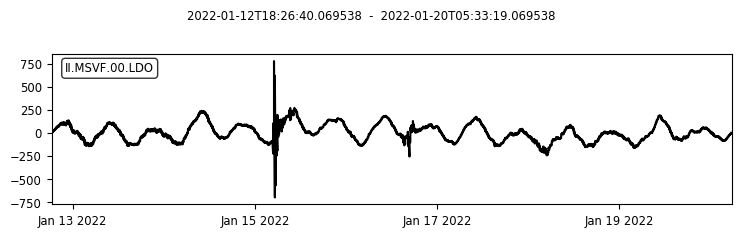

In [223]:
st = obspy.core.read(os.path.join(DATA_ROOT, 'iris_LDO_within_180_degrees.mseed'))
#st.select(station='MSVF').plot()
inv = obspy.read_inventory(os.path.join(DATA_ROOT, 'iris_LDO_within_180_degrees.xml'))
msvf = st.select(station='MSVF')
msvf2=msvf.copy()
msvf2.remove_response(inventory=inv)
msvf2.plot()
tr = msvf2[0]

[  4.41602443e-05   5.29922932e-05   6.35907518e-05   7.63089022e-05
   9.15706826e-05   1.09884819e-04   1.31861783e-04   1.58234140e-04
   1.89880967e-04   2.27857161e-04   2.73428593e-04   3.28114312e-04
   3.93737174e-04   4.72484609e-04   5.66981531e-04   6.80377837e-04
   8.16453404e-04   9.79744085e-04   1.17569290e-03   1.41083148e-03
   1.69299778e-03   2.03159733e-03   2.43791680e-03   2.92550016e-03
   3.51060019e-03   4.21272023e-03   5.05526428e-03   6.06631714e-03
   7.27958056e-03   8.73549668e-03   1.04825960e-02   1.25791152e-02
   1.50949383e-02   1.81139259e-02   2.17367111e-02   2.60840533e-02
   3.13008640e-02   3.75610368e-02   4.50732441e-02   5.40878929e-02
   6.49054715e-02   7.78865658e-02   9.34638790e-02   1.12156655e-01
   1.34587986e-01   1.61505583e-01   1.93806699e-01   2.32568039e-01
   2.79081647e-01   3.34897977e-01   4.01877572e-01   4.82253086e-01]


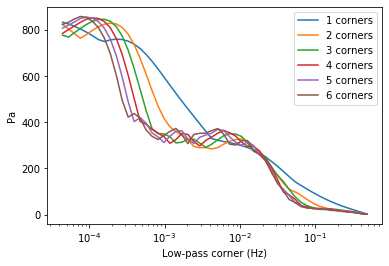

In [224]:
f = np.power(1.2,np.arange(-55,-1))
f = f[f<0.5]
plt.figure()
print(f)
for ncorners in range(6):
    a = []
    for fmin in f:
        tr2 = tr.copy()
        if fmin>0.0:
            #print(fmin)
            tr2.filter('highpass',freq=fmin,corners=ncorners+1)
        a.append(np.max(np.abs(tr2.data)))
    labstr = "%d corners" % (ncorners+1)
    plt.semilogx(f,a,label=labstr)
plt.ylabel('Pa')
plt.xlabel('Low-pass corner (Hz)')
plt.legend()
plt.show()

[  1.31861783e-04   1.58234140e-04   1.89880967e-04   2.27857161e-04
   2.73428593e-04   3.28114312e-04   3.93737174e-04   4.72484609e-04
   5.66981531e-04   6.80377837e-04   8.16453404e-04   9.79744085e-04
   1.17569290e-03   1.41083148e-03   1.69299778e-03   2.03159733e-03
   2.43791680e-03   2.92550016e-03   3.51060019e-03   4.21272023e-03
   5.05526428e-03   6.06631714e-03   7.27958056e-03   8.73549668e-03
   1.04825960e-02   1.25791152e-02   1.50949383e-02   1.81139259e-02
   2.17367111e-02   2.60840533e-02   3.13008640e-02   3.75610368e-02
   4.50732441e-02   5.40878929e-02   6.49054715e-02   7.78865658e-02
   9.34638790e-02   1.12156655e-01   1.34587986e-01   1.61505583e-01
   1.93806699e-01   2.32568039e-01   2.79081647e-01   3.34897977e-01
   4.01877572e-01   4.82253086e-01   1.00000000e+00]
6.103515625e-05


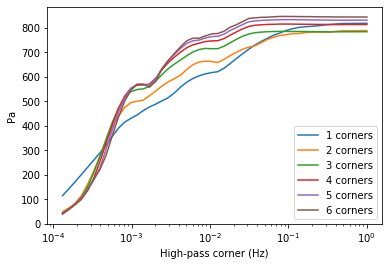

In [225]:
fmin = np.power(2.0,-14)
#f = np.power(2.0,np.arange(-13,-1))
f = np.power(1.2,np.arange(-55,-1))
f = f[f<=0.5]
f = f[f>fmin*2]
f = np.append(f,1.0)
print(f)
print(fmin)

plt.figure()
for ncorners in range(6):
    a = []
    for fmax in f:
        tr2 = tr.copy()
        if fmax<1.0:
            #print(fmin)
            tr2.filter('bandpass',freqmin=fmin, freqmax=fmax,corners=ncorners+1)
            
        else:
            tr2.filter('highpass',freq=fmin, corners=ncorners+1)
        a.append(np.max(np.abs(tr2.data)))
    labstr = "%d corners" % (ncorners+1)
    plt.semilogx(f,a,label=labstr)
plt.ylabel('Pa')
plt.xlabel('High-pass corner (Hz)')
plt.legend()
plt.show()

II.MSVF.00.LDO | 2022-01-12T18:26:40.069538Z - 2022-01-20T05:33:19.069538Z | 1.0 Hz, 644800 samples

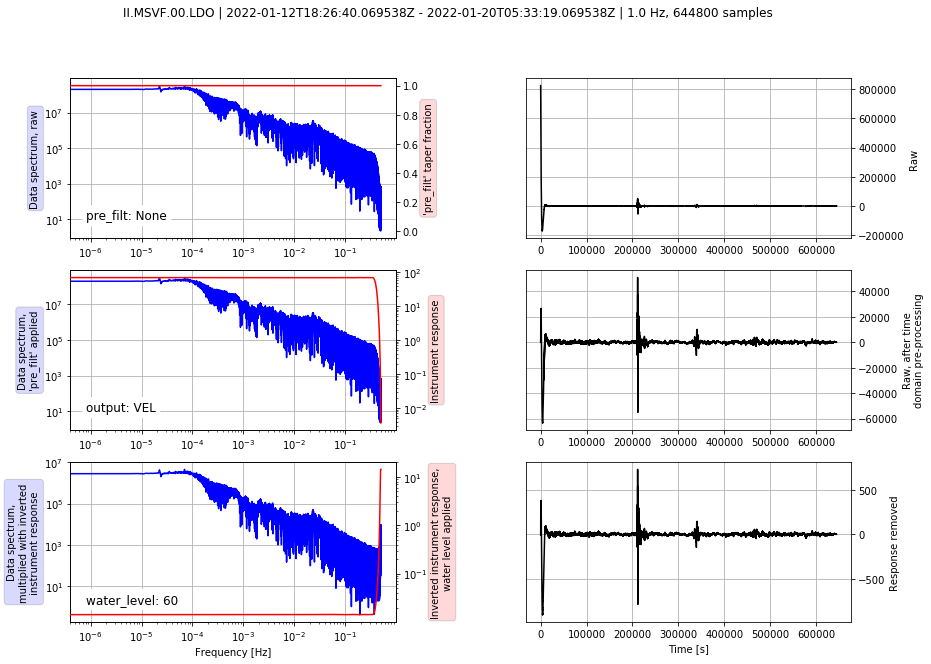

In [226]:
tr2=msvf[0].copy()
pre_filt = [0.0001, 0.0002, 0.5, 0.1]
tr2.filter('bandpass', freqmin=0.0001, freqmax=0.5, corners=2)
tr2.remove_response(inventory=inv, plot=True, water_level=60)
#tr2.plot()

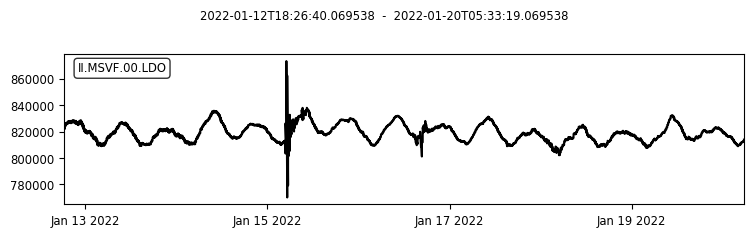

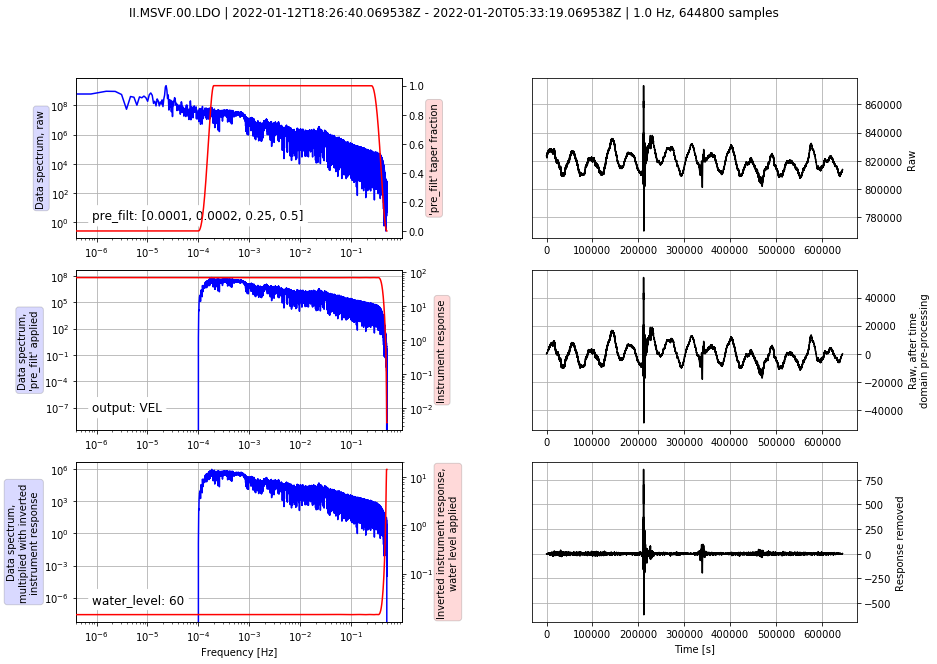

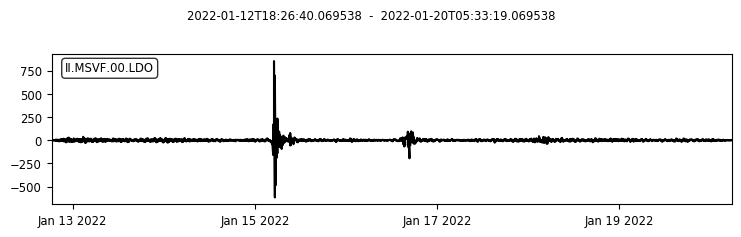

In [227]:
tr2=msvf[0].copy()
tr2.plot()
pre_filt = [0.0001, 0.0002, 0.25, 0.5]
#tr2.filter('pass', freq=0.0001, corners=2)
tr2.remove_response(inventory=inv, pre_filt=pre_filt, plot=True, water_level=60)
tr2.plot();

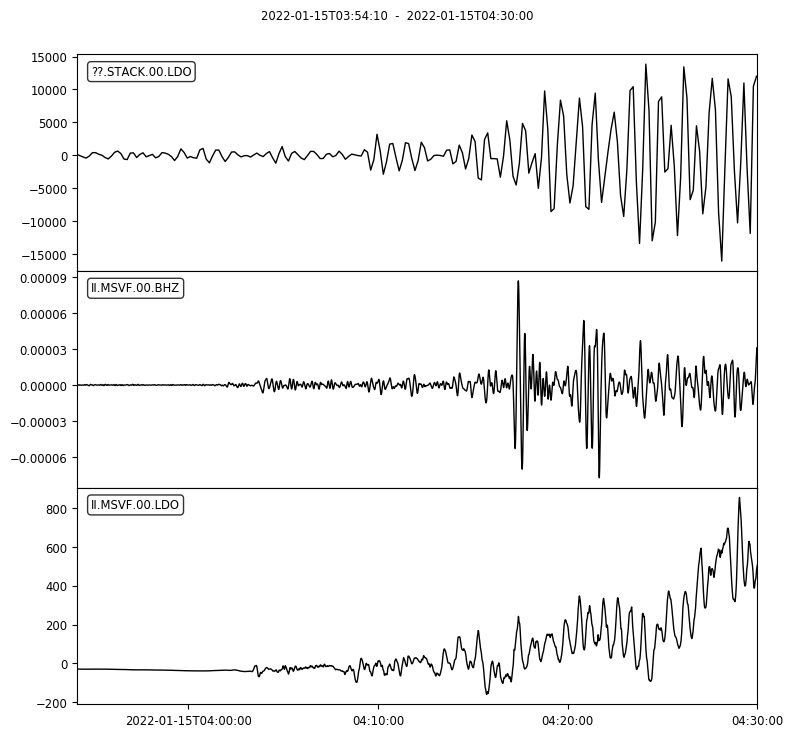

In [434]:
stime = obspy.UTCDateTime(2022,1,15,3,30,0)
etime = stime + 3600
stfinal = obspy.Stream()

# plot MSVF BHZ
tr4 = st_bhz.select(station='MSVF').copy()[0]
speed = 8000
tr4.stats.distance = 757000.0
tr4.stats.starttime = tr4.stats.starttime - tr4.stats.distance/speed
#tr4.plot(starttime=stime, endtime=etime);
#stfinal.append(tr4)
stfinal.append(tr4.filter('bandpass', freqmin=0.01, freqmax=0.1, corners=4))

# plot MSVF infrasound reduced by 314 m/s from 03:45 to 05:45
speed = 314
tr3=tr2.copy()
tr3.stats.distance = 757000.0
tr3.stats.starttime = tr3.stats.starttime - tr3.stats.distance/speed
#tr3.plot(starttime=stime, endtime=etime);
stfinal.append(tr3)
#stfinal.append(tr3.filter('highpass', freq=0.0001, corners=4))

#stfinal.plot(equal_scale=False, starttime=stime, endtime=etime);
stfinal.append(stack)
#stfinal.append(stack.filter('highpass',freq=0.01))

#stfinal.plot(equal_scale=False, starttime=stime+1450, endtime=etime-1050);
stfinal.plot(equal_scale=False, starttime=stime+1450, endtime=etime);

stfinal.write('seismoacoustic_main_event.mseed')

In [274]:
lightning = obspy.read('lightning_main_event.mseed')

FileNotFoundError: [Errno 2] No such file or directory: 'lightning_main_event.mseed'

# Miscellaneous

In [ ]:
mseedfile = os.path.join(DATA_ROOT, 'rboom_HDF_within_180_degrees.mseed')
inv = obspy.read_inventory(os.path.join(DATA_ROOT, 'rboom_HDF_within_180_degrees.xml'))
pre_filt = [0.0001, 0.0002, 0.25, 0.5]
N = 1000
count = 0
f = open(os.path.join(DATA_ROOT, 'rboom_good_HDF_ids_within_180_degrees.pkl'), "rb")
good_ids = pickle.load(f)
f.close()
good_st = obspy.core.Stream()
more_good = ['S89A5', 'R160F', 'RC93C', 'RA8D4', 'R9606', 'R40C1', 'R3A8A', 'R571C', 'R9CDF', 'RB83C', 'R0033']
for sta in more_good:
    good_ids.append('AM.%s.00.HDF' % sta)
import obspy
import io

reclen = 512
chunksize = 100000 * reclen # Around 50 MB

with io.open(mseedfile, "rb") as fh:
    while count<N:
        with io.BytesIO() as buf:
            c = fh.read(chunksize)
            if not c:
                break
            buf.write(c)
            buf.seek(0, 0)
            st = obspy.read(buf)
            count+=1
        # Do something useful!
        st.merge()
        for tr in st:
            if tr.id in good_ids:
                good_st.append(tr)
        #st.remove_response(inventory=inv, pre_filt=pre_filt, plot=True, water_level=60) 

In [ ]:
st_good = good_st.copy()
st_good.taper(0.01)
for tr in st_good:
    try:
        tr.filter('highpass', freq=0.0001, corners=2)
    except:
        pass
st_good = manually_select_good_traces(st_good) 

In [ ]:
#st.select(station='MSVF').plot()
pre_filt = [0.001, 0.002, 0.25, 0.5]
inv = obspy.read_inventory(os.path.join(DATA_ROOT, 'rboom_HDF_within_180_degrees.xml'))
st_good2 = st_good.copy()
for tr in st_good2:
    #tr.remove_response(inventory=inv, pre_filt=pre_filt, plot=True, water_level=60)
    tr.remove_response(inventory=inv, pre_filt=pre_filt, plot=True, water_level=60)
    tr.plot();

In [ ]:
tr = good_st.copy()[0]
tr.plot();

In [ ]:
tr.trim(starttime=obspy.UTCDateTime(2022,1,15,18,0,0), endtime=obspy.UTCDateTime(2022,1,15,23,0,0))
tr.plot()

In [ ]:
tr.remove_response(inventory=inv, pre_filt=[0.01, 0.02, 10, 20], plot=True, water_level=60)

In [ ]:
inv_ldo3 = inv_ldo2.copy()
inv_ldo3.__add__(inv_ldf2)

In [ ]:
plot_inv(inv_ldo3)

In [ ]:
msvf

In [ ]:
st_ldo.select(station='MSVF')[0].stats.distance_in_km

In [ ]:
plot_inv(inv_ldo3)

In [ ]:
searchRadiusDeg = 20
fmin = 0.0001
T = 1.0/fmin

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

startt = otime - T*2
endt = otime + 7 * 3600 + T*2 

fdsnURL = "http://service.iris.edu"
chanstring = 'HHZ'
st_hhz, inv_hhz = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

In [ ]:
st=st_hhz.copy()
st.taper(0.1)
st.filter('bandpass', freqmin=0.01, freqmax=1.0, corners=2)
st.trim(starttime=obspy.UTCDateTime(2022,1,15,4,14,45),endtime=obspy.UTCDateTime(2022,1,15,7,14,45))
st.plot(equal_scale=False);

In [ ]:
for tr in st_hhz:
    print(tr.stats.distance_in_km)

In [ ]:
st.trim(starttime=obspy.UTCDateTime(2022,1,15,6,53,0),endtime=obspy.UTCDateTime(2022,1,15,6,57,0))
st.plot(equal_scale=False);

In [ ]:
chanstring = 'BHZ'
st_bhz, inv_bhz = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

In [ ]:
st=st_bhz.copy()
st.taper(0.1)
st.filter('bandpass', freqmin=0.01, freqmax=15.0, corners=2)
st.trim(starttime=obspy.UTCDateTime(2022,1,15,4,14,45),endtime=obspy.UTCDateTime(2022,1,15,4,24,45))
st.plot(equal_scale=False);

In [ ]:
searchRadiusDeg = 60
fmin = 0.001
T = 1.0/fmin

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

distkm = degrees2kilometers(searchRadiusDeg)
max_acoustic_speed = 380
min_acoustic_speed = 300
min_travel_time = distkm * 1000 / max_acoustic_speed 
max_travel_time = distkm * 1000 / min_acoustic_speed                   
print(searchRadiusDeg, distkm, max_travel_time, min_travel_time)

startt = otime - T*2
endt = otime + max_travel_time + T*2 

fdsnURL = "http://service.iris.edu"
chanstring = 'LHZ'
st_lhz, inv_lhz = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

In [ ]:
st = st_lhz.copy()
st.taper(0.1)
st.filter('bandpass', freqmin=0.003, freqmax=0.5, corners=2)
st.trim(starttime=obspy.UTCDateTime(2022,1,15,4,0,0),endtime=obspy.UTCDateTime(2022,1,15,5,0,0))
for tr in st:
    tr.plot()


st.select(station='MSVF').plot();

tr = obspy.core.Trace()
tr.data = st[0].data + st[1].data
tr.stats.starttime = st[0].stats.starttime
tr.stats.sampling_rate = st[0].stats.sampling_rate
tr.id = 'XX.MSVF.20.LHZ'
tr.plot()

tr.trim(starttime=obspy.UTCDateTime(2022,1,15,4,15,0),endtime=obspy.UTCDateTime(2022,1,15,4,35,0))
tr.plot()

fdsnClient = Client(fdsnURL)  
startt = otime-10000
endt = obspy.UTCDateTime(2022,1,15,7,0,0)+10000

msvf = fdsnClient.get_waveforms('II', 'MSVF', '*', '*', startt, endt)

for loc in ['00', '10']:
    st = msvf.select(location=loc, channel='[LV][HD]?')
    st.plot(equal_scale=False);

for tr in msvf:
    print(tr.id, tr.stats.sampling_rate)

for loc in ['00', '10']:
    st = msvf.copy().select(location=loc, channel='[LV][HD]?')
    st.detrend('linear')
    st.taper(0.02)
    st.filter('bandpass',freqmin=0.0002,freqmax=0.01)
    st.plot(equal_scale=False);

print(msvf)

for loc in ['00', '10']:
    st = msvf.copy().select(location=loc, channel='B[HD]?')
    st.detrend('linear')
    st.taper(0.02)
    st.filter('highpass',freq=0.5,corners=2)
    st.trim(starttime=otime+150,endtime=otime+300)
    st.plot(equal_scale=False);

searchRadiusDeg = 120
fmin = 0.001
T = 1.0/fmin

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

distkm = degrees2kilometers(searchRadiusDeg)
max_acoustic_speed = 380
min_acoustic_speed = 300
min_travel_time = distkm * 1000 / max_acoustic_speed 
max_travel_time = distkm * 1000 / min_acoustic_speed                   
print(searchRadiusDeg, distkm, max_travel_time, min_travel_time)

startt = otime - T*2
endt = otime + max_travel_time + T*2 

fdsnURL = "http://service.iris.edu"
chanstring = 'LHZ'
st_lhz, inv_lhz = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

st_ldf_recon = obspy.read(os.path.join(DATA_ROOT, 'iris_LDF_within_180_degrees.mseed'))

len(st_ldf_recon)

len(st_ldf_recon.merge())

ids = []
for tr in st_ldf_recon:
    if not tr.id in ids:
        ids.append(tr.id)
print(len(ids))

print(ids)

st_ldo_recon = obspy.read(os.path.join(DATA_ROOT, 'iris_LDO_within_180_degrees.mseed'))

Text(0, 0.5, 'Time difference (s)')

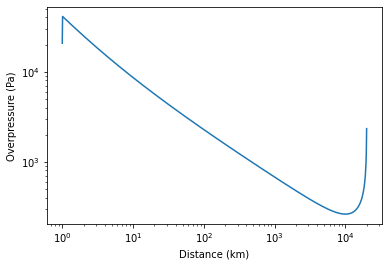

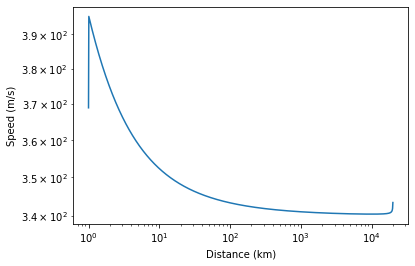

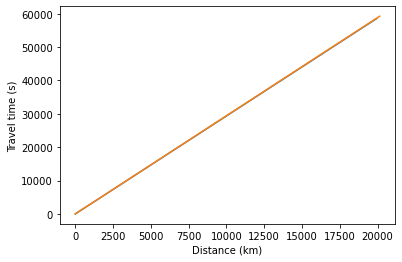

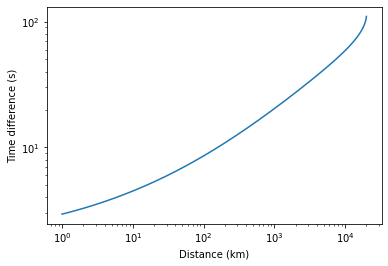

In [9]:
import math
R = circum_earth_km/(2*math.pi)


def machnumber(Pover, Pambient=1e5, vambient=340):
    g = 1.4 # specific heat ratio for air
    Pratio = Pover / Pambient
    f = (1 + g) * Pratio / (2 * g)
    M = np.sqrt(1 + f)
    v = vambient * M
    return (M, v)

def pressure_vs_distance(r_station, P_station, crossover_km=100, vambient=340):

    r_sphere = R * np.sin(r_station / R)
    Preduced = P_station / (1/r_sphere + 1/np.sqrt(crossover_km * r_sphere)) 
   
    
    r = 1 # 1 km for reduced pressure
    r_list = [r]
    P_list = [Preduced]
    Pambient = 1e5
    [M,v] = machnumber(Preduced, Pambient=Pambient, vambient=vambient)
    t_list = [0]
    v_list = [v]
    M_list = [M]
    multiplier = 1.01
    
   
    last_r = r
    while r < circum_earth_km/2: 
        r = r * multiplier
        r_sphere = R * np.sin(r / R)
        
        #P = Preduced/r + Preduced/np.sqrt(crossover_km * r)
        P = Preduced/r_sphere + Preduced/np.sqrt(crossover_km * r_sphere)
        [M,v] = machnumber(P, Pambient=Pambient)
        r_list.append(r)
        P_list.append(P)
        v_list.append(v)
        mean_v = np.mean(v_list[-2:])
        delta_r = (r - last_r)*1000
        delta_t = delta_r/mean_v
        t_list.append(t_list[-1]+delta_t)
        M_list.append(M)
        last_r = r
    return (r_list, P_list, v_list, t_list, M_list)


r_msvf = 757.0 # km
P_msvf = 780.0 # Pa
vambient = 340

r_list, P_list, v_list, t_list, M_list = pressure_vs_distance(r_msvf, P_msvf, crossover_km=1, vambient=vambient)

plt.figure()
plt.loglog(r_list, P_list)
plt.xlabel('Distance (km)')
plt.ylabel('Overpressure (Pa)')


plt.figure()
plt.loglog(r_list, v_list)
plt.xlabel('Distance (km)')
plt.ylabel('Speed (m/s)')

plt.figure()
plt.plot(r_list, t_list)
t2_list = np.array(r_list)*1000/vambient
plt.plot(r_list, t2_list)
plt.xlabel('Distance (km)')
plt.ylabel('Travel time (s)')


plt.figure()
plt.loglog(r_list, t2_list - t_list)
plt.xlabel('Distance (km)')
plt.ylabel('Time difference (s)')